In [1]:
import sys
import os
from IPython.display import Image
import json
from collections import defaultdict
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import xml.dom.minidom as minidom
import xml.etree.cElementTree as cet
import xml.etree.ElementTree as et
%matplotlib inline

In [2]:
import pandas as pd 
df = pd.read_csv('./nameplate_bounding_box.csv')
dataset = df.replace("ResizedNameplates","BinaryNamePlateBoxes",regex=True)
bb_path_name=dataset['id'].iloc[0]
print(bb_path_name)
bb=dataset['label'].iloc[0]
print(bb,type(bb))
bb=bb.replace("[","").replace("]","").replace("'","").replace(" ","")
bb_info = list(map(int,bb.split(",")))
print(bb_info,type(bb_info))

BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28896.png
[96, 56, 64, 20] <class 'str'>
[96, 56, 64, 20] <class 'list'>


In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.image as img
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchvision.io import read_image
class VehicleNamePlateBBDataset(Dataset):
    def __init__(self, data, path , transform = None):
        super().__init__()
        self.data = data.values
        self.path = path
        self.transform = transform
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self,index):
        img_name,label_str = self.data[index]
        img_path = os.path.join(self.path, img_name)
        image = img.imread(img_path)
        image.resize()
        bb=label_str.replace("[","").replace("]","").replace("'","").replace(" ","")
        bb_info = list(map(int,bb.split(",")))
        bb_info =[bb_info[0]/256.0,bb_info[1]/128.0,bb_info[2]/256.0,bb_info[3]/128.0]
        label = torch.Tensor(bb_info)
               
        if self.transform is not None:
            image = self.transform(image)
        return img_path, image, label
trans = transforms.Compose([transforms.ToTensor()])#,transforms.Normalize((0.5,), (0.5,))])
train, valid_data = train_test_split(dataset, test_size=0.1,random_state=42)
working_folder = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2"
train_data = VehicleNamePlateBBDataset(train, working_folder,trans)
valid_data = VehicleNamePlateBBDataset(valid_data, working_folder,trans)

training images
tensor([0.3906, 0.8359, 0.2500, 0.1562])
tensor([0.5273, 0.6172, 0.2500, 0.1562])
tensor([0.3633, 0.4922, 0.2500, 0.1562])
tensor([0.4062, 0.4844, 0.2500, 0.1562])
tensor([0.3672, 0.6172, 0.2500, 0.1562])
torch.Size([1, 128, 256])


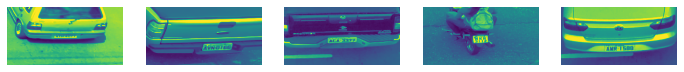

In [4]:
import numpy as np
import torchvision
import matplotlib.pyplot as plt

def imshow(image, ax=None, title=None, normalize=True):
    if ax is None:
        fig, ax = plt.subplots()
    image = image.numpy().transpose((1, 2, 0))

    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax
batch_size = 16
train_loader = DataLoader(dataset = train_data, batch_size = batch_size, shuffle=True, num_workers=0)
valid_loader = DataLoader(dataset = valid_data, batch_size = batch_size, shuffle=False, num_workers=0)
image_paths, trainimages, trainlabels = next(iter(train_loader))

fig, axes = plt.subplots(figsize=(12, 12), ncols=5)
print('training images')
for i in range(5):
    axe1 = axes[i] 
    imshow(trainimages[i], ax=axe1, normalize=False)
    print(trainlabels[i])

print(trainimages[0].size())

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F



class YoloLiteModified(nn.Module):
  def __init__(self):
    super(YoloLiteModified, self).__init__()
    self.n_classes = 4

    self.classification = nn.Sequential(
        nn.Conv2d(in_channels= 1, out_channels= 16, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size= 2),
        nn.Conv2d(in_channels= 16, out_channels = 32, kernel_size= 3, stride = 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(in_channels=32, out_channels= 64, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(in_channels=64, out_channels= 128, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(in_channels=128, out_channels= 128, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(in_channels=128, out_channels= self.n_classes, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Flatten(),
        nn.Linear(in_features = 32, out_features = self.n_classes, bias = False)
        
#         nn.Conv2d(in_channels=32, out_channels= 64, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
#         nn.MaxPool2d(kernel_size = 2),
        
    )

  def forward(self, x):
    logits = self.classification(x)
    boxes = torch.sigmoid(logits)
    return boxes



In [25]:
from torchsummary import summary
model = YoloLiteModified()
summary(model,(1,256,128))
print(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 256, 128]             160
         MaxPool2d-2          [-1, 16, 128, 64]               0
            Conv2d-3          [-1, 32, 128, 64]           4,640
         MaxPool2d-4           [-1, 32, 64, 32]               0
            Conv2d-5           [-1, 64, 64, 32]          18,496
         MaxPool2d-6           [-1, 64, 32, 16]               0
            Conv2d-7          [-1, 128, 32, 16]          73,856
         MaxPool2d-8           [-1, 128, 16, 8]               0
            Conv2d-9           [-1, 128, 16, 8]         147,584
        MaxPool2d-10            [-1, 128, 8, 4]               0
           Conv2d-11              [-1, 4, 8, 4]           4,612
        MaxPool2d-12              [-1, 4, 4, 2]               0
          Flatten-13                   [-1, 32]               0
           Linear-14                   

In [7]:
num_epochs = 200
num_classes = 4
batch_size = 16
learning_rate = 0.001


def criterion(output, target):
    loss = F.mse_loss(output,target)
    return loss
    
optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)

def save_ckp(model, optimizer,epoch,file_prefix):
    checkpoint = {'model': model,
              'state_dict': model.state_dict(),
              'optimizer' : optimizer.state_dict()}
    filename=file_prefix+"_"+str(epoch)+".pth"
    torch.save(checkpoint, filename)

In [8]:
%%time
# keeping-track-of-losses 
device = torch.device('cpu')
train_losses = []
valid_losses = []
file_prefix="./models/nameplatebb/nameplatebb_gray_250_epochs"
for epoch in range(1, num_epochs + 1):
    # keep-track-of-training-and-validation-loss
    train_loss = 0.0
    valid_loss = 0.0
    
    # training-the-model
    model.train()
    batch_no =0
    num_correct_train_data = 0
    
    for img_path, data, target in train_loader:
        print("Batch",batch_no)
        # move-tensors-to-GPU 
#         print(data,type(data))
#         print(target,type(target))
        data = data.to(device)
        target = target.to(device)
        
        # clear-the-gradients-of-all-optimized-variables
        optimizer.zero_grad()
        # forward-pass: compute-predicted-outputs-by-passing-inputs-to-the-model
        output = model(data)
        # calculate-the-batch-loss
        loss = criterion(output, target)
        
        # backward-pass: compute-gradient-of-the-loss-wrt-model-parameters
        loss.backward()
        # perform-a-single-optimization-step (parameter-update)
        optimizer.step()
        # update-training-loss
        train_loss += loss.item() * data.size(0)
        batch_no +=1
       
    # validate-the-model
    model.eval()
    for data, target in valid_loader:
        
        data = data.to(device)
        target = target.to(device)
        
        output = model(data)
        
        loss = criterion(output, target)
        
        # update-average-validation-loss 
        valid_loss += loss.item() * data.size(0)
    
    # calculate-average-losses
    train_loss = train_loss/len(train_loader.sampler)
    valid_loss = valid_loss/len(valid_loader.sampler)
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
        
    # print-training/validation-statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
        epoch, train_loss, valid_loss))
    print("Training Losses",train_losses)
    print("Valid Losses",valid_losses)
    save_ckp(model,optimizer,epoch,file_prefix)

Batch 0
Batch 1
Batch 2
Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110


Batch 832
Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931


Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262


Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch

Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410


Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209

Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490
Batch 491
Batch 492
Batch 493
Batch 494
Batch 495
Batch 496
Batch 497
Batch 498
Batch 499
Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509
Batch 510
Batch 511
Batch 512
Batch 513
Batch 514
Batch 515
Batch 516
Batch 517
Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554


Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295
Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300
Batch 1301
Batch 1302
Batch 1303
Batch 1304
Batch 1305
Batch 1306
Batch 1307
Batch 1308
Batch 1309
Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340

Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630
Batch 631
Batch 632
Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694


Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412
Batch 1413
Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426
Batch 1427
Batch 1428
Batch 1429
Batch 1430
Batch 1431
Batch 1432
Batch 1433
Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 5 	Training Loss: 0.005097 	Validation Loss: 0.006270
Training Losses [0.008195590093497929, 0.007492221143160424, 0.006913226907311841, 0.006034991241487506, 0.0050971114259135576]
Valid Losses [0.00797150335307353, 0.007205606629064337, 0.0069520607413280575, 0.006796709836186561, 0.00626958274863

Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736
Batch 737
Batch 738
Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766
Batch 767
Batch 768
Batch 769
Batch 770
Batch 771
Batch 772
Batch 773
Batch 774
Batch 775
Batch 776
Batch 777
Batch 778
Batch 779
Batch 780
Batch 781
Batch 782
Batch 783
Batch 784
Batch 785
Batch 786
Batch 787
Batch 788
Batch 789
Batch 790
Batch 791
Batch 792
Batch 793
Batch 794
Batch 795
Batch 796
Batch 797
Batch 798
Batch 799
Batch 800
Batch 801
Batch 802
Batch 803
Batch 804
Batch 805
Batch 806
Batch 807
Batch 808
Batch 809
Batch 810
Batch 811
Batch 812
Batch 813
Batch 814
Batch 815
Batch 816
Batch 817
Batch 818
Batch 819
Batch 820
Batch 821
Batch 822
Batch 823
Batch 824
Batch 825
Batch 826
Batch 827
Batch 828
Batch 829


Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch

Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962


Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266


Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 108

Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390


Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192

Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490
Batch 491
Batch 492
Batch 493
Batch 494
Batch 495
Batch 496
Batch 497
Batch 498
Batch 499
Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509


Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295
Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300

Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580
Batch 581
Batch 582
Batch 583
Batch 584
Batch 585
Batch 586
Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622


Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368
Batch 1369
Batch 1370
Batch 1371
Batch 1372
Batch 1373
Batch 1374
Batch 1375
Batch 1376
Batch 1377
Batch 1378
Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403

Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706
Batch 707
Batch 708
Batch 709
Batch 710
Batch 711
Batch 712
Batch 713
Batch 714
Batch 715
Batch 716
Batch 717
Batch 718
Batch 719
Batch 720
Batch 721
Batch 722
Batch 723
Batch 724
Batch 725
Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732


Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426
Batch 1427
Batch 1428
Batch 1429
Batch 1430
Batch 1431
Batch 1432
Batch 1433
Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 12 	Training Loss: 0.001994 	Validation Loss: 0.006770
Training Losses [0.008195590093497929, 0.007492221143160424, 0.006913226907311841, 0.006034991241487506, 0.0050971114259135576, 0.0042244605434346985, 0.0035403480871485054, 0.0029885621979616876, 0.002609331158642982, 0.002346269234497148, 0.002135984672134663, 0.00199439046226987]
Valid Losses [0.00797150335307353, 0.007205606629064337, 0.0069520607413280575, 0.006796709836186561, 0.006269582748634103, 0.00607695047809778, 0.006151605599576566, 0.006072191335406273, 0.005839135855142606, 0.0057255802043567495, 0.005829050043520753, 0.006770368858846159]
Batch 0
Batch 1
Batch 2
Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batc

Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766
Batch 767
Batch 768
Batch 769
Batch 770
Batch 771
Batch 772
Batch 773
Batch 774
Batch 775
Batch 776
Batch 777
Batch 778
Batch 779
Batch 780
Batch 781
Batch 782
Batch 783
Batch 784
Batch 785
Batch 786
Batch 787
Batch 788
Batch 789
Batch 790
Batch 791
Batch 792
Batch 793
Batch 794
Batch 795
Batch 796
Batch 797
Batch 798
Batch 799
Batch 800
Batch 801
Batch 802
Batch 803
Batch 804
Batch 805
Batch 806
Batch 807
Batch 808
Batch 809
Batch 810
Batch 811
Batch 812
Batch 813
Batch 814
Batch 815
Batch 816
Batch 817
Batch 818
Batch 819
Batch 820
Batch 821
Batch 822
Batch 823
Batch 824
Batch 825
Batch 826
Batch 827
Batch 828
Batch 829
Batch 830
Batch 831
Batch 832
Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838


Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 

Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936


Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210


Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030

Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303


Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113

Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390


Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192

Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474


Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269

Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490
Batch 491
Batch 492
Batch 493
Batch 494
Batch 495
Batch 496
Batch 497
Batch 498
Batch 499
Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509
Batch 510
Batch 511
Batch 512
Batch 513
Batch 514
Batch 515
Batch 516
Batch 517
Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553


Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295
Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300
Batch 1301
Batch 1302
Batch 1303
Batch 1304
Batch 1305
Batch 1306
Batch 1307
Batch 1308
Batch 1309
Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342

Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580
Batch 581
Batch 582
Batch 583
Batch 584
Batch 585
Batch 586
Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630


Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368
Batch 1369
Batch 1370
Batch 1371
Batch 1372
Batch 1373
Batch 1374
Batch 1375
Batch 1376
Batch 1377
Batch 1378
Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412

Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630
Batch 631
Batch 632
Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701


Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412
Batch 1413
Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426
Batch 1427
Batch 1428
Batch 1429
Batch 1430
Batch 1431
Batch 1432
Batch 1433
Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 21 	Training Loss: 0.001390 	Validation Loss: 0.005937
Training Losses [0.008195590093497929, 0.007492221143160424, 0.006913226907311841, 0.006034991241487506, 0.0050971114259135576, 0.0042244605434346985, 0.0035403480871485054, 0.0029885621979616876, 0.002609331158642982, 0.002346269234497148, 0.002135984672134663, 0.00199439046226987, 0.0021431644515370243, 0.00

Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706
Batch 707
Batch 708
Batch 709
Batch 710
Batch 711
Batch 712
Batch 713
Batch 714
Batch 715
Batch 716
Batch 717
Batch 718
Batch 719
Batch 720
Batch 721
Batch 722
Batch 723
Batch 724
Batch 725
Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736
Batch 737
Batch 738
Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Bat

Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989


Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218


Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Bat

Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266


Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
B

Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309


Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120

Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350


Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157

Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385


Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186

Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414


Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216

Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439


Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236

Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458


Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253

Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471


Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265

Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482


Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275

Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486


Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281

Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490


Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284

Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489


Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283

Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482


Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274

Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470


Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264

Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454


Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249

Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431


Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228

Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406


Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205

Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374


Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179

Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342


Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149

Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306


Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117

Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265


Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079


Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217


Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 

Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
B

Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Ba

Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934


Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batc

Batch 833
Batch 834
Batch 835
Batch 836
Batch 837
Batch 838
Batch 839
Batch 840
Batch 841
Batch 842
Batch 843
Batch 844
Batch 845
Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932


[0.008195590093497929, 0.007492221143160424, 0.006913226907311841, 0.006034991241487506, 0.0050971114259135576, 0.0042244605434346985, 0.0035403480871485054, 0.0029885621979616876, 0.002609331158642982, 0.002346269234497148, 0.002135984672134663, 0.00199439046226987, 0.0021431644515370243, 0.0016486156275583941, 0.0016319183539375004, 0.0016131865121799443, 0.0015203328458232401, 0.0015376666043951093, 0.0013892134074363915, 0.001338419392233991, 0.0013898458016229122, 0.0013017116670409757, 0.0012559015113375784, 0.0012357127696899812, 0.001203308683463527, 0.0011789321107484913, 0.0011999977915811348, 0.001156067795702544, 0.0011052396582331009, 0.0011219860844734742, 0.0010931514798353627, 0.0010537460485477556, 0.001062690946773157, 0.0010446692203376056, 0.0010261416911193527, 0.001011221103886442, 0.0009997687510745206, 0.0009728383352196328, 0.0009886362112278351, 0.0009672498427940239, 0.0009796808616057415, 0.0009476428887482261, 0.0009390046940736361, 0.000981496543995196, 0.

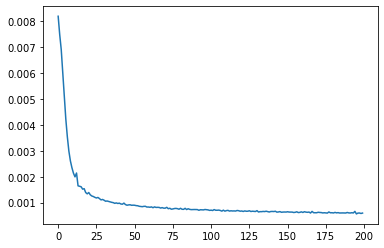

In [9]:
print(train_losses)
x=range(0,len(train_losses))
plt.plot(x,train_losses)
plt.show()

In [14]:
from copy import deepcopy
def calculate_IOU(target, output):
    bb1=target.tolist()
    bb2=output.tolist()
#     print(bb1,bb2)
    bb1[2] = bb1[0] + bb1[2]
    bb1[3] = bb1[1] + bb1[3]
   
    bb2[2] = bb2[0] + bb2[2]
    bb2[3] = bb2[1] + bb2[3]

    assert bb1[0] <= bb1[2]
    assert bb1[1] <= bb1[3]
    assert bb2[0] <= bb2[2]
    assert bb2[1] <= bb2[3]

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1[0], bb2[0])
    y_top = max(bb1[1], bb2[1])
    x_right = min(bb1[2], bb2[2])
    y_bottom = min(bb1[3], bb2[3])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
    bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

model.eval()
n=0
num_correct_data = 0
batch_test = 0
for data, target in train_loader:
    print("Batch",batch_test)
    data = data.to(device)
    target = target.to(device)
    output = model(data)
    curr_target = target.size(0)
    print(curr_target)
    n += target.size(0)
    
    for b in range(0,curr_target):
        iou = calculate_IOU(target[b],output[b])
        if(iou >=0.4):
            num_correct_data+=1
    batch_test+=1
print(num_correct_data/n *100.0)

Batch 0
16
Batch 1
16
Batch 2
16
Batch 3
16
Batch 4
16
Batch 5
16
Batch 6
16
Batch 7
16
Batch 8
16
Batch 9
16
Batch 10
16
Batch 11
16
Batch 12
16
Batch 13
16
Batch 14
16
Batch 15
16
Batch 16
16
Batch 17
16
Batch 18
16
Batch 19
16
Batch 20
16
Batch 21
16
Batch 22
16
Batch 23
16
Batch 24
16
Batch 25
16
Batch 26
16
Batch 27
16
Batch 28
16
Batch 29
16
Batch 30
16
Batch 31
16
Batch 32
16
Batch 33
16
Batch 34
16
Batch 35
16
Batch 36
16
Batch 37
16
Batch 38
16
Batch 39
16
Batch 40
16
Batch 41
16
Batch 42
16
Batch 43
16
Batch 44
16
Batch 45
16
Batch 46
16
Batch 47
16
Batch 48
16
Batch 49
16
Batch 50
16
Batch 51
16
Batch 52
16
Batch 53
16
Batch 54
16
Batch 55
16
Batch 56
16
Batch 57
16
Batch 58
16
Batch 59
16
Batch 60
16
Batch 61
16
Batch 62
16
Batch 63
16
Batch 64
16
Batch 65
16
Batch 66
16
Batch 67
16
Batch 68
16
Batch 69
16
Batch 70
16
Batch 71
16
Batch 72
16
Batch 73
16
Batch 74
16
Batch 75
16
Batch 76
16
Batch 77
16
Batch 78
16
Batch 79
16
Batch 80
16
Batch 81
16
Batch 82
16
Batch 83
16
Ba

Batch 639
16
Batch 640
16
Batch 641
16
Batch 642
16
Batch 643
16
Batch 644
16
Batch 645
16
Batch 646
16
Batch 647
16
Batch 648
16
Batch 649
16
Batch 650
16
Batch 651
16
Batch 652
16
Batch 653
16
Batch 654
16
Batch 655
16
Batch 656
16
Batch 657
16
Batch 658
16
Batch 659
16
Batch 660
16
Batch 661
16
Batch 662
16
Batch 663
16
Batch 664
16
Batch 665
16
Batch 666
16
Batch 667
16
Batch 668
16
Batch 669
16
Batch 670
16
Batch 671
16
Batch 672
16
Batch 673
16
Batch 674
16
Batch 675
16
Batch 676
16
Batch 677
16
Batch 678
16
Batch 679
16
Batch 680
16
Batch 681
16
Batch 682
16
Batch 683
16
Batch 684
16
Batch 685
16
Batch 686
16
Batch 687
16
Batch 688
16
Batch 689
16
Batch 690
16
Batch 691
16
Batch 692
16
Batch 693
16
Batch 694
16
Batch 695
16
Batch 696
16
Batch 697
16
Batch 698
16
Batch 699
16
Batch 700
16
Batch 701
16
Batch 702
16
Batch 703
16
Batch 704
16
Batch 705
16
Batch 706
16
Batch 707
16
Batch 708
16
Batch 709
16
Batch 710
16
Batch 711
16
Batch 712
16
Batch 713
16
Batch 714
16
Batch 715
16

16
Batch 1251
16
Batch 1252
16
Batch 1253
16
Batch 1254
16
Batch 1255
16
Batch 1256
16
Batch 1257
16
Batch 1258
16
Batch 1259
16
Batch 1260
16
Batch 1261
16
Batch 1262
16
Batch 1263
16
Batch 1264
16
Batch 1265
16
Batch 1266
16
Batch 1267
16
Batch 1268
16
Batch 1269
16
Batch 1270
16
Batch 1271
16
Batch 1272
16
Batch 1273
16
Batch 1274
16
Batch 1275
16
Batch 1276
16
Batch 1277
16
Batch 1278
16
Batch 1279
16
Batch 1280
16
Batch 1281
16
Batch 1282
16
Batch 1283
16
Batch 1284
16
Batch 1285
16
Batch 1286
16
Batch 1287
16
Batch 1288
16
Batch 1289
16
Batch 1290
16
Batch 1291
16
Batch 1292
16
Batch 1293
16
Batch 1294
16
Batch 1295
16
Batch 1296
16
Batch 1297
16
Batch 1298
16
Batch 1299
16
Batch 1300
16
Batch 1301
16
Batch 1302
16
Batch 1303
16
Batch 1304
16
Batch 1305
16
Batch 1306
16
Batch 1307
16
Batch 1308
16
Batch 1309
16
Batch 1310
16
Batch 1311
16
Batch 1312
16
Batch 1313
16
Batch 1314
16
Batch 1315
16
Batch 1316
16
Batch 1317
16
Batch 1318
16
Batch 1319
16
Batch 1320
16
Batch 1321
16
Bat

In [8]:
def load_ckp(checkpoint_fpath,model):
    """
    checkpoint_path: path to save checkpoint
    model: model that we want to load checkpoint parameters into       
    optimizer: optimizer we defined in previous training
    """
    # load check point
    checkpoint = torch.load(checkpoint_fpath)
    optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)
#     checkpoint = {'model': model,
#               'state_dict': model.state_dict(),
#               'optimizer' : optimizer.state_dict()}
    
    # initialize state_dict from checkpoint to model
    model.load_state_dict(checkpoint['state_dict'])
    # initialize optimizer from checkpoint to optimizer
    optimizer.load_state_dict(checkpoint['optimizer'])
    # initialize valid_loss_min from checkpoint to valid_loss_min
    
    # return model, optimizer, epoch value, min validation loss 
    return model, optimizer
checkpoint_path ="./models/nameplatebb/nameplatebb_gray_200_epochs_200.pth"
saved_model,saved_optimizer = load_ckp(checkpoint_path,model)


In [9]:
def evaluate_model(model,data_loader):
    def calculate_IOU(target, output):
        bb1=target.tolist()
        bb2=output.tolist()
    #     print(bb1,bb2)
        bb1[2] = bb1[0] + bb1[2]
        bb1[3] = bb1[1] + bb1[3]

        bb2[2] = bb2[0] + bb2[2]
        bb2[3] = bb2[1] + bb2[3]

        assert bb1[0] <= bb1[2]
        assert bb1[1] <= bb1[3]
        assert bb2[0] <= bb2[2]
        assert bb2[1] <= bb2[3]

        # determine the coordinates of the intersection rectangle
        x_left = max(bb1[0], bb2[0])
        y_top = max(bb1[1], bb2[1])
        x_right = min(bb1[2], bb2[2])
        y_bottom = min(bb1[3], bb2[3])

        if x_right < x_left or y_bottom < y_top:
            return 0.0

        # The intersection of two axis-aligned bounding boxes is always an
        # axis-aligned bounding box
        intersection_area = (x_right - x_left) * (y_bottom - y_top)

        # compute the area of both AABBs
        bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
        bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

        # compute the intersection over union by taking the intersection
        # area and dividing it by the sum of prediction + ground-truth
        # areas - the interesection area
        iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
        assert iou >= 0.0
        assert iou <= 1.0
        return iou
    model.eval()
    device = torch.device('cpu')
    n=0
    num_correct_data = 0
    batch_test = 0
    for img_path,data, target in data_loader:
#         print("Batch",batch_test)
        
        data = data.to(device)
        target = target.to(device)
        output = model(data)
        curr_target = target.size(0)
        n += target.size(0)
        
        for b in range(0,curr_target):
            iou = calculate_IOU(target[b],output[b])
            print(img_path[b],list(target[b]),iou)
            if(iou >=0.4):
                num_correct_data+=1
        batch_test+=1
    print(num_correct_data/n *100.0)
test_loader = DataLoader(dataset = train_data, batch_size = 1, shuffle=False, num_workers=0)
evaluate_model(saved_model,test_loader)

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8157.png [tensor(0.3672), tensor(0.4219), tensor(0.2500), tensor(0.1562)] 0.5556613288901361
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/com-2666/8281.png [tensor(0.3320), tensor(0.7812), tensor(0.2500), tensor(0.1562)] 0.6727509484306339
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aie-6383/8786.png [tensor(0.3711), tensor(0.4219), tensor(0.2500), tensor(0.1562)] 0.5631356816579455
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bev-0108/3488.png [tensor(0.3906), tensor(0.4922), tensor(0.2500), tensor(0.1562)] 0.7377560730568783
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27179.png [tensor(0.3672), tensor(0.4219), tensor(0.2500), tensor(0.1562)] 0.5757609068362703
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apl-3500/32351.png [tensor(0.4141), tensor(0.1797), tensor(0.2500), tensor(0.1562)] 0.2875762115242468
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ipo-7305/19691.png [tensor(0.3984), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.737863012931946
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aes-7627/6442.png [tensor(0.4570), tensor(0.1797), tensor(0.2500), tensor(0.1562)] 0.551190489801189
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Se

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azz-6864/32628.png [tensor(0.3906), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.5835158203038094
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auj-8958/10948.png [tensor(0.3594), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.5588477492852298
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ays-5083/2023.png [tensor(0.5508), tensor(0.2812), tensor(0.2500), tensor(0.1562)] 0.4803896156017207
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayq-5487/13802.png [tensor(0.7422), tensor(0.4766), tensor(0.2500), tensor(0.1562)] 0.7893293747200814
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/adr-8732/35548.png [tensor(0.3672), tensor(0.3984), tensor(0.2500), tensor(0.1562)] 0.5857991849958204
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-6155/34482.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1562)] 0.5092998438450321
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asp-9088/421.png [tensor(0.6055), tensor(0.7344), tensor(0.2500), tensor(0.1562)] 0.7630225902501381
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atd-9302/34238.png [tensor(0.3750), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.9303039965369485
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/S

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axu-2907/26184.png [tensor(0.3711), tensor(0.5234), tensor(0.2500), tensor(0.1562)] 0.5755840307560044
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axf-5473/10754.png [tensor(0.5039), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.7005579016705936
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22068.png [tensor(0.4453), tensor(0.1797), tensor(0.2500), tensor(0.1562)] 0.8155644626897669
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/anv-2817/34853.png [tensor(0.7500), tensor(0.1016), tensor(0.2500), tensor(0.1562)] 0.6544482546777878
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15772.png [tensor(0.3555), tensor(0.4922), tensor(0.2500), tensor(0.1562)] 0.4654914333722636
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azk-3521/23916.png [tensor(0.2500), tensor(0.4531), tensor(0.2500), tensor(0.1562)] 0.706163458177056
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asz-2631/19433.png [tensor(0.3672), tensor(0.4062), tensor(0.2500), tensor(0.1562)] 0.5237458412909768
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aue-3158/16141.png [tensor(0.4453), tensor(0.1641), tensor(0.2500), tensor(0.1562)] 0.6055399315502784
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avn-4768/14087.png [tensor(0.2734), tensor(0.3203), tensor(0.2500), tensor(0.1562)] 0.46497516711199893
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awn-7012/8721.png [tensor(0.6719), tensor(0.), tensor(0.2500), tensor(0.1562)] 0.2018994634592849
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ltp-0980/21898.png [tensor(0.1797), tensor(0.4062), tensor(0.2500), tensor(0.1562)] 0.5273804505637194
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axg-4984/24373.png [tensor(0.3828), tensor(0.4609), tensor(0.2500), tensor(0.1562)] 0.8875130162173279
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axs-3516/5958.png [tensor(0.3789), tensor(0.4297), tensor(0.2500), tensor(0.1562)] 0.5935469732871061
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23297.png [tensor(0.3828), tensor(0.4062), tensor(0.2500), tensor(0.1562)] 0.7357271668228786
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axw-6592/16349.png [tensor(0.3672), tensor(0.5547), tensor(0.2500), tensor(0.1562)] 0.5176336935569341
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aoe-6227/34646.png [tensor(0.4102), tensor(0.4297), tensor(0.2500), tensor(0.1562)] 0.7925924635304731
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ato-0557/16272.png [tensor(0.3789), tensor(0.4062), tensor(0.2500), tensor(0.1562)] 0.6824479015620868
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-5567/18708.png [tensor(0.3711), tensor(0.4062), tensor(0.2500), tensor(0.1562)] 0.8084552322848846
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bdr-2711/18979.png [tensor(0.3594), tensor(0.6328), tensor(0.2500), tensor(0.1562)] 0.5202212109077085
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/fke-3040/16595.png [tensor(0.4648), tensor(0.3125), tensor(0.2500), tensor(0.1562)] 0.6682299264610478
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bds-7377/29887.png [tensor(0.3906), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.628151038638794
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqv-8460/26535.png [tensor(0.5977), tensor(0.1250), tensor(0.2500), tensor(0.1562)] 0.5870717274066997
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/alq-1925/32620.png [tensor(0.3047), tensor(0.2500), tensor(0.2500), tensor(0.1562)] 0.6983347653754453
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/htg-6294/32529.png [tensor(0.4492), tensor(0.0078), tensor(0.2500), tensor(0.1562)] 0.4238984757112753
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26974.png [tensor(0.6094), tensor(0.1797), tensor(0.2500), tensor(0.1562)] 0.6397519260984259
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axg-3855/30153.png [tensor(0.3750), tensor(0.4297), tensor(0.2500), tensor(0.1562)] 0.7098612712654371
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33058.png [tensor(0.4023), tensor(0.4219), tensor(0.2500), tensor(0.1562)] 0.8896647039020288
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-0639/21344.png [tensor(0.3750), tensor(0.4141), tensor(0.2500), tensor(0.1562)] 0.5739676779979327
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2

KeyboardInterrupt: 

In [10]:
import torch.onnx 

#Function to Convert to ONNX 
def Convert_ONNX(model): 

    # set the model to inference mode 
    model.eval() 

    # Let's create a dummy input tensor  
    
    dummy_input = torch.randn(1, 3, 256, 128, requires_grad=True)  
    
    # Export the model   
    torch.onnx.export(model,         # model being run 
         dummy_input,       # model input (or a tuple for multiple inputs) 
         "NameplateLocalization.onnx",       # where to save the model  
         export_params=True,  # store the trained parameter weights inside the model file 
         opset_version=10,    # the ONNX version to export the model to 
         do_constant_folding=True,  # whether to execute constant folding for optimization 
         input_names = ['modelInput'],   # the model's input names 
         output_names = ['modelOutput'], # the model's output names 
         dynamic_axes={'modelInput' : {0 : 'batch_size'},    # variable length axes 
                                'modelOutput' : {0 : 'batch_size'}}) 
    print(" ") 
    print('Model has been converted to ONNX') 
Convert_ONNX(model)

RuntimeError: Given groups=1, weight of size [16, 1, 3, 3], expected input[1, 3, 256, 128] to have 1 channels, but got 3 channels instead

In [23]:
def dump_data(model,data_loader):
    def calculate_IOU(target, output):
        bb1=target.tolist()
        bb2=output.tolist()
    #     print(bb1,bb2)
        bb1[2] = bb1[0] + bb1[2]
        bb1[3] = bb1[1] + bb1[3]

        bb2[2] = bb2[0] + bb2[2]
        bb2[3] = bb2[1] + bb2[3]

        assert bb1[0] <= bb1[2]
        assert bb1[1] <= bb1[3]
        assert bb2[0] <= bb2[2]
        assert bb2[1] <= bb2[3]

        # determine the coordinates of the intersection rectangle
        x_left = max(bb1[0], bb2[0])
        y_top = max(bb1[1], bb2[1])
        x_right = min(bb1[2], bb2[2])
        y_bottom = min(bb1[3], bb2[3])

        if x_right < x_left or y_bottom < y_top:
            return 0.0

        # The intersection of two axis-aligned bounding boxes is always an
        # axis-aligned bounding box
        intersection_area = (x_right - x_left) * (y_bottom - y_top)

        # compute the area of both AABBs
        bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
        bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

        # compute the intersection over union by taking the intersection
        # area and dividing it by the sum of prediction + ground-truth
        # areas - the interesection area
        iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
        assert iou >= 0.0
        assert iou <= 1.0
        return iou
    nameplate_detection_results = {}
    model.eval()
    device = torch.device('cpu')
    n=0
    num_correct_data = 0
    batch_test = 0
    for img_path,data, target in data_loader:
#         print("Batch",batch_test)
        
        data = data.to(device)
        target = target.to(device)
        output = model(data)
        curr_target = target.size(0)
                
        for b in range(0,curr_target):
            iou = calculate_IOU(target[b],output[b])
            image_identifiers = img_path[b].split("/")
            print(image_identifiers)
            frameno = image_identifiers[-1][:-4]
            nameplate = image_identifiers[-2]
            setno = image_identifiers[-4]
            camera = image_identifiers[-5]
            print(camera,setno,nameplate,frameno)
            output_tuple=(img_path[b],output[b].tolist(),iou)
            print(output_tuple)
            if camera not in nameplate_detection_results:
                nameplate_detection_results[camera]={}
            if setno not in nameplate_detection_results[camera]:
                nameplate_detection_results[camera][setno]={}
            if nameplate not in nameplate_detection_results[camera][setno]:
                nameplate_detection_results[camera][setno][nameplate]={}
            nameplate_detection_results[camera][setno][nameplate][frameno]=output_tuple
                
            
    return nameplate_detection_results    
test_loader = DataLoader(dataset = train_data, batch_size = 1, shuffle=False, num_workers=0)
nameplate_detection_results = dump_data(saved_model,test_loader)

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aub-6274', '8157.png']
Camera2 Set03 aub-6274 8157
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8157.png', [0.3882801830768585, 0.3851960301399231, 0.26248157024383545, 0.16535910964012146], 0.5556613288901361)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'com-2666', '8281.png']
Camera1 Set03 com-2666 8281
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/com-2666/8281.png', [0.34511125087738037, 0.7568346858024597, 0.25347328186035156, 0.15924671292304993], 0.6727509484306339)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aes-7627', '6442.png']
Camera1 Set04 aes-7627 6442
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aes-7627/6442.png', [0.48968279361724854, 0.20227129757404327, 0.2603301703929901, 0.16401338577270508], 0.551190489801189)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aor-2826', '26538.png']
Camera1 Set04 aor-2826 26538
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aor-2826/26538.png', [0.4130805730819702, 0.43941399455070496, 0.2440350204706192, 0.14692550897598267], 0.7947659951724751)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'mhl-7631', '24243.png']
Camera1 Set01 mhl-7631 24243
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24243.png', [0.4145205616950989, 0.41264620423316956, 0.24478015303611755, 0.1499541997909546], 0.5794532222933636)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aym-8391', '17050.png']
Camera2 Set02 aym-8391 17050
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17050.png', [0.4128867983818054, 0.4008418321609497, 0.2597457766532898, 0.16243377327919006], 0.600444270477808)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axr-3960', '8299.png']
Camera2 Set02 axr-3960 8299
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axr-3960/8299.png', [0.3897833228111267, 0.5418796539306641, 0.2535322606563568, 0.1562117636203766], 0.7290867261012596)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'atq-9550', '16683.png']
Camera1 Set05 atq-9550 16683
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atq-9550/16683.png', [0.4073699712753296, 0.6581671833992004, 0.25353947281837463, 0.16087204217910767], 0.6103953536499078)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayv-5843', '13780.png']
Camera1 Set03 ayv-5843 13780
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayv-5843/13780.png', [0.30094990134239197, 0.2813194692134857, 0.27550965547561646, 0.1792709231376648], 0.7674887612137447)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aup-6455', '3457.png']
Camera1 Set01 aup-6455 3457
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3457.png', [0.7541698217391968, 0.364566832780838, 0.2573378384113312, 0.1680164784193039], 0.8222027397791356)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aes-7627', '8677.png']
Camera2 Set04 aes-7627 8677
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aes-7627/8677.png', [0.33822938799858093, 0.45627644658088684, 0.2540789246559143, 0.1591918170452118], 0.5128839768711871)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'mbw-8032', '19027.png']
Camera1 Set01 mbw-8032 19027
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19027.png', [0.3992448151111603, 0.5871213674545288, 0.2530488073825836, 0.15946155786514282], 0.6394768722296239)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aqu-1803', '15546.png']
Camera2 Set01 aqu-1803 15546
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqu-1803/15546.png', [0.4136729836463928, 0.48478963971138, 0.25188884139060974, 0.153970405459404], 0.30968724347193843)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ath-3307', '35133.png']
Camera1 Set05 ath-3307 35133
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35133.png', [0.34037095308303833, 0.4336579442024231, 0.24546995759010315, 0.1469658762216568], 0.7018157231601841)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'arc-2575', '11360.png']
Camera1 Set04 arc-2575 11360
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arc-2575/11360.png', [0.4344552457332611, 0.5074416995048523, 0.24332861602306366, 0.14811493456363678], 0.5504400107620888)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'auz-9865', '15462.png']
Camera2 Set01 auz-9865 15462
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auz-9865/15462.png', [0.3975699245929718, 0.4305432438850403, 0.2584872841835022, 0.16367995738983154], 0.6593604609087445)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ate-3369', '32943.png']
Camera2 Set02 ate-3369 32943
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ate-3369/32943.png', [0.1985577642917633, 0.0762568861246109, 0.26342540979385376, 0.15736906230449677], 0.8594432139370509)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'cub-8450', '27095.png']
Camera1 Set04 cub-8450 27095
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/cub-8450/27095.png', [0.4063165485858917, 0.43097013235092163, 0.2456333041191101, 0.14852236211299896], 0.7308736964608863)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axg-3855', '30153.png']
Camera2 Set02 axg-3855 30153
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axg-3855/30153.png', [0.36848336458206177, 0.4009995758533478, 0.2676740288734436, 0.16842027008533478], 0.7098612712654371)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axp-4236', '33058.png']
Camera2 Set03 axp-4236 33058
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33058.png', [0.40138939023017883, 0.43125754594802856, 0.25023001432418823, 0.1546531319618225], 0.8896647039020288)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'atu-5120', '7971.png']
Camera1 Set03 atu-5120 7971
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atu-5120/7971.png', [0.38352423906326294, 0.42009177803993225, 0.25500723719596863, 0.1603936105966568], 0.8310954526084069)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aoa-3760', '10960.png']
Camera1 Set03 aoa-3760 10960
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aoa-3760/10960.png', [0.6274834871292114, 0.5700340270996094, 0.2366904318332672, 0.1460336595773697], 0.6531779950071784)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'abw-4462', '2604.png']
Camera1 Set05 abw-4462 2604
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/abw-4462/2604.png', [0.24110707640647888, 0.035921066999435425, 0.27184200286865234, 0.16621801257133484], 0.3379854153202878)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'axu-8491', '26412.png']
Camera2 Set01 axu-8491 26412
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-8491/26412.png', [0.3391990661621094, 0.40314069390296936, 0.25937747955322266, 0.16220536828041077], 0.7170463754543628)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awm-1518', '34770.png']
Camera1 Set03 awm-1518 34770
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awm-1518/34770.png', [0.40568122267723083, 0.5351676940917969, 0.24468453228473663, 0.15022920072078705], 0.204026917138473)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'oxe-4952', '22113.png']
Camera1 Set02 oxe-4952 22113
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/oxe-4952/22113.png', [0.3316076695919037, 0.5088581442832947, 0.2573486566543579, 0.1617031991481781], 0.2628629212017958)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'alo-9716', '31644.png']
Camera2 Set01 alo-9716 31644
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/alo-9716/31644.png', [0.37380754947662354, 0.39631402492523193, 0.24971207976341248, 0.15369912981987], 0.8486182934491336)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'arc-2629', '27481.png']
Camera2 Set02 arc-2629 27481
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arc-2629/27481.png', [0.3848515748977661, 0.47079095244407654, 0.2555232346057892, 0.15907973051071167], 0.5440827549718328)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'bcr-0157', '24508.png']
Camera1 Set01 bcr-0157 24508
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcr-0157/24508.png', [0.3403509557247162, 0.38504737615585327, 0.2546272277832031, 0.15687768161296844], 0.4887929041113029)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ave-7451', '3725.png']
Camera1 Set05 ave-7451 3725
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ave-7451/3725.png', [0.4072172939777374, 0.38378190994262695, 0.26200270652770996, 0.16569669544696808], 0.5566053210655507)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ate-2805', '24610.png']
Camera2 Set04 ate-2805 24610
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ate-2805/24610.png', [0.3684792220592499, 0.3438936471939087, 0.2585747539997101, 0.1597980260848999], 0.4348380620177138)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'bes-7722', '13909.png']
Camera1 Set03 bes-7722 13909
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bes-7722/13909.png', [0.3883245289325714, 0.4311034679412842, 0.2568007707595825, 0.1586979776620865], 0.8233020848310718)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ayg-4713', '32182.png']
Camera1 Set04 ayg-4713 32182
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-4713/32182.png', [0.3727743923664093, 0.6401064395904541, 0.26491841673851013, 0.17027491331100464], 0.19455297920917874)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aol-3111', '30043.png']
Camera1 Set03 aol-3111 30043
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30043.png', [0.4455466568470001, 0.2450743317604065, 0.26100265979766846, 0.16533075273036957], 0.560535491423242)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aon-2882', '27594.png']
Camera1 Set03 aon-2882 27594
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aon-2882/27594.png', [0.4173493981361389, 0.4868704378604889, 0.2511928379535675, 0.1529495269060135], 0.3614650675301)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aac-7003', '24651.png']
Camera2 Set04 aac-7003 24651
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aac-7003/24651.png', [0.5662679076194763, 0.2772892117500305, 0.2512981593608856, 0.15588219463825226], 0.5833535453947835)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'fis-2884', '18578.png']
Camera2 Set01 fis-2884 18578
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18578.png', [0.38491153717041016, 0.48441243171691895, 0.23852112889289856, 0.14421425759792328], 0.5149255735189003)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayv-2256', '8933.png']
Camera1 Set01 ayv-2256 8933
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8933.png', [0.4162086248397827, 0.4076520800590515, 0.24694415926933289, 0.15003268420696259], 0.6109371403449817)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'atm-2049', '10973.png']
Camera2 Set05 atm-2049 10973
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10973.png', [0.38288652896881104, 0.6138561367988586, 0.2470819503068924, 0.15453365445137024], 0.7772204148386445)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auh-0434', '32469.png']
Camera1 Set01 auh-0434 32469
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auh-0434/32469.png', [0.3827916383743286, 0.5848761200904846, 0.24704663455486298, 0.15192149579524994], 0.8966322279550761)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aeq-4747', '21084.png']
Camera2 Set01 aeq-4747 21084
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21084.png', [0.46147334575653076, 0.4351784288883209, 0.23458744585514069, 0.14006265997886658], 0.7882096724880396)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aue-2414', '33222.png']
Camera2 Set05 aue-2414 33222
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aue-2414/33222.png', [0.38084104657173157, 0.5006528496742249, 0.2537558972835541, 0.15975512564182281], 0.3179537143572274)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'avm-3172', '7816.png']
Camera1 Set01 avm-3172 7816
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avm-3172/7816.png', [0.41984865069389343, 0.4530813992023468, 0.25253036618232727, 0.15734638273715973], 0.48270137403514074)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'avv-9883', '33110.png']
Camera2 Set05 avv-9883 33110
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avv-9883/33110.png', [0.3791372776031494, 0.3777799606323242, 0.25697949528694153, 0.16050869226455688], 0.582839954541558)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axw-3086', '32281.png']
Camera1 Set02 axw-3086 32281
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axw-3086/32281.png', [0.35338935256004333, 0.5382580757141113, 0.2551858723163605, 0.15817028284072876], 0.7327225468947046)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aic-9085', '5781.png']
Camera1 Set03 aic-9085 5781
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aic-9085/5781.png', [0.35388875007629395, 0.3949952721595764, 0.26507821679115295, 0.16764292120933533], 0.6612496452082706)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'crq-0032', '35100.png']
Camera1 Set04 crq-0032 35100
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/crq-0032/35100.png', [0.6513978838920593, 0.3563859462738037, 0.24748903512954712, 0.15549729764461517], 0.19525836144731512)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axo-2221', '35001.png']
Camera1 Set02 axo-2221 35001
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axo-2221/35001.png', [0.7746713161468506, 0.06355088949203491, 0.253828227519989, 0.15825504064559937], 0.3513493844246511)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axb-1198', '27214.png']
Camera2 Set05 axb-1198 27214
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axb-1198/27214.png', [0.3483266830444336, 0.41459521651268005, 0.25849586725234985, 0.15997745096683502], 0.8145539790270562)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aut-7539', '2629.png']
Camera1 Set04 aut-7539 2629
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aut-7539/2629.png', [0.3739951550960541, 0.4204053282737732, 0.25219491124153137, 0.1557014137506485], 0.7048712667394402)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'arw-7234', '7048.png']
Camera2 Set01 arw-7234 7048
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/arw-7234/7048.png', [0.4011898934841156, 0.39455676078796387, 0.25503742694854736, 0.15789762139320374], 0.6225124056425534)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aii-9292', '27233.png']
Camera1 Set03 aii-9292 27233
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aii-9292/27233.png', [0.3956097364425659, 0.4979594051837921, 0.2599309980869293, 0.1637440323829651], 0.2908053790058299)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'beb-0726', '32556.png']
Camera2 Set02 beb-0726 32556
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/beb-0726/32556.png', [0.40536415576934814, 0.42072272300720215, 0.254800409078598, 0.15749268233776093], 0.7219532123553435)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'bbz-0410', '625.png']
Camera2 Set02 bbz-0410 625
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bbz-0410/625.png', [0.40525874495506287, 0.403377503156662, 0.26266202330589294, 0.1663658171892166], 0.6089570398221527)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'azd-1907', '26997.png']
Camera1 Set03 azd-1907 26997
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azd-1907/26997.png', [0.0796625092625618, 0.6562523245811462, 0.25713473558425903, 0.15732811391353607], 0.30995029518206374)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'amb-5427', '18945.png']
Camera2 Set02 amb-5427 18945
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/amb-5427/18945.png', [0.07863398641347885, 0.46563830971717834, 0.25928884744644165, 0.15461769700050354], 0.3521679876360162)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aug-8890', '18957.png']
Camera2 Set03 aug-8890 18957
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18957.png', [0.38025569915771484, 0.41393035650253296, 0.24876590073108673, 0.15230171382427216], 0.4960101558620123)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'azg-3589', '22085.png']
Camera1 Set03 azg-3589 22085
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azg-3589/22085.png', [0.557333767414093, 0.2508164346218109, 0.24843339622020721, 0.15117867290973663], 0.5006025331853291)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aqy-2334', '5310.png']
Camera1 Set03 aqy-2334 5310
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aqy-2334/5310.png', [0.3718620240688324, 0.3363846242427826, 0.2472112625837326, 0.14922894537448883], 0.48612398637189286)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'auf-8339', '26962.png']
Camera1 Set03 auf-8339 26962
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26962.png', [0.3802405893802643, 0.5218898057937622, 0.2554243206977844, 0.16069163382053375], 0.6964238745818448)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'arv-5433', '13603.png']
Camera2 Set03 arv-5433 13603
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arv-5433/13603.png', [0.48412567377090454, 0.39098724722862244, 0.23984484374523163, 0.14497342705726624], 0.39520761811569916)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'amt-6430', '26703.png']
Camera1 Set01 amt-6430 26703
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/amt-6430/26703.png', [0.44780996441841125, 0.39222827553749084, 0.2464728206396103, 0.1493026614189148], 0.6449662304978547)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'drl-0137', '10364.png']
Camera2 Set01 drl-0137 10364
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/drl-0137/10364.png', [0.387613445520401, 0.31956401467323303, 0.25050079822540283, 0.1490868479013443], 0.2848976577665004)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'atj-9714', '79.png']
Camera2 Set05 atj-9714 79
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atj-9714/79.png', [0.32441988587379456, 0.407815158367157, 0.2508535087108612, 0.15248170495033264], 0.7415789577734552)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'alk-5567', '18711.png']
Camera1 Set02 alk-5567 18711
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-5567/18711.png', [0.32329097390174866, 0.4255378842353821, 0.2487145960330963, 0.15156817436218262], 0.5588131921599369)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ast-1190', '23293.png']
Camera2 Set01 ast-1190 23293
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23293.png', [0.3806634247303009, 0.4283669888973236, 0.2500680685043335, 0.15143133699893951], 0.9351532029012051)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'lux-9860', '32036.png']
Camera2 Set01 lux-9860 32036
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/lux-9860/32036.png', [0.2979860305786133, 0.6105569005012512, 0.25292742252349854, 0.15566976368427277], 0.3415094397393828)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'amm-5079', '32804.png']
Camera2 Set02 amm-5079 32804
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/amm-5079/32804.png', [0.44544368982315063, 0.39181309938430786, 0.24359950423240662, 0.14774289727210999], 0.547060555483085)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ami-7880', '15988.png']
Camera1 Set03 ami-7880 15988
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15988.png', [0.23541207611560822, 0.7593121528625488, 0.25751322507858276, 0.16201584041118622], 0.5155554578064386)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'alk-5567', '19457.png']
Camera2 Set02 alk-5567 19457
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alk-5567/19457.png', [0.5002755522727966, 0.07352516800165176, 0.25196710228919983, 0.1517992466688156], 0.3754391248780451)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aob-1535', '23942.png']
Camera1 Set03 aob-1535 23942
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aob-1535/23942.png', [0.33862242102622986, 0.4165816605091095, 0.25872525572776794, 0.1633874624967575], 0.6567099493275506)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ali-5173', '10474.png']
Camera1 Set01 ali-5173 10474
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ali-5173/10474.png', [0.21124087274074554, 0.3179364502429962, 0.26099249720573425, 0.1583753526210785], 0.9398650619727495)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'azb-2905', '22363.png']
Camera1 Set03 azb-2905 22363
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azb-2905/22363.png', [0.37435805797576904, 0.413068562746048, 0.26475682854652405, 0.16910861432552338], 0.8724632318786585)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'iso-8360', '18401.png']
Camera1 Set01 iso-8360 18401
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/iso-8360/18401.png', [0.40513482689857483, 0.4344521164894104, 0.2521566152572632, 0.15754695236682892], 0.7747577327187283)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'apw-9233', '27406.png']
Camera1 Set05 apw-9233 27406
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27406.png', [0.5094653367996216, 0.14499513804912567, 0.26223599910736084, 0.16365566849708557], 0.28187698721754817)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'asl-0042', '27157.png']
Camera2 Set05 asl-0042 27157
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asl-0042/27157.png', [0.364227294921875, 0.5835608839988708, 0.24297134578227997, 0.146981343626976], 0.8660221239594175)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ast-1190', '23300.png']
Camera2 Set01 ast-1190 23300
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23300.png', [0.3676685690879822, 0.4104878902435303, 0.2535336911678314, 0.1567968875169754], 0.8511066045078471)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'awb-8291', '27212.png']
Camera1 Set04 awb-8291 27212
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awb-8291/27212.png', [0.3885139226913452, 0.41780972480773926, 0.2601737082004547, 0.16504524648189545], 0.7912017349044893)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ayz-3397', '6254.png']
Camera2 Set04 ayz-3397 6254
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayz-3397/6254.png', [0.36885592341423035, 0.3938097059726715, 0.25785112380981445, 0.1619984209537506], 0.6325399245796335)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ako-8296', '11022.png']
Camera2 Set03 ako-8296 11022
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11022.png', [0.14212477207183838, 0.7328268885612488, 0.25415077805519104, 0.1574873924255371], 0.4350031781915952)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axw-5771', '21872.png']
Camera2 Set03 axw-5771 21872
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axw-5771/21872.png', [0.35516270995140076, 0.3885098993778229, 0.24616459012031555, 0.14858202636241913], 0.5362685975607947)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aqh-9146', '3458.png']
Camera1 Set05 aqh-9146 3458
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqh-9146/3458.png', [0.4072294533252716, 0.46778297424316406, 0.25563597679138184, 0.1619080752134323], 0.7079245958477677)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'olv-9215', '7363.png']
Camera2 Set01 olv-9215 7363
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/olv-9215/7363.png', [0.40614765882492065, 0.4182591140270233, 0.2544437050819397, 0.1576661318540573], 0.6630119200741388)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayc-7312', '13470.png']
Camera1 Set01 ayc-7312 13470
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayc-7312/13470.png', [0.4879685044288635, 0.6852540373802185, 0.23745980858802795, 0.145243301987648], 0.31470328183396407)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'azf-9940', '16486.png']
Camera1 Set01 azf-9940 16486
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azf-9940/16486.png', [0.39991265535354614, 0.4260459542274475, 0.24955004453659058, 0.15216068923473358], 0.751125433796199)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aub-5427', '8657.png']
Camera1 Set02 aub-5427 8657
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aub-5427/8657.png', [0.6301690340042114, 0.4762336015701294, 0.24688531458377838, 0.15542611479759216], 0.5752925957008649)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'amz-2753', '35791.png']
Camera2 Set03 amz-2753 35791
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amz-2753/35791.png', [0.4707290530204773, 0.2599259316921234, 0.2599007487297058, 0.1639137715101242], 0.5116755824256906)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'akl-8389', '10700.png']
Camera1 Set03 akl-8389 10700
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akl-8389/10700.png', [0.3769284188747406, 0.46661871671676636, 0.23968228697776794, 0.14323854446411133], 0.4445286006054702)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'lxj-2042', '17012.png']
Camera1 Set04 lxj-2042 17012
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/lxj-2042/17012.png', [0.3797047734260559, 0.43411940336227417, 0.25397536158561707, 0.15768545866012573], 0.7309666047160044)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aos-6746', '2717.png']
Camera1 Set05 aos-6746 2717
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aos-6746/2717.png', [0.4181048274040222, 0.24373199045658112, 0.26198410987854004, 0.16427931189537048], 0.437933552540352)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axu-4921', '19135.png']
Camera1 Set05 axu-4921 19135
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-4921/19135.png', [0.7142898440361023, 0.11697287857532501, 0.2463526725769043, 0.15023761987686157], 0.7042758181302934)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'akc-7557', '24672.png']
Camera2 Set03 akc-7557 24672
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akc-7557/24672.png', [0.3623180687427521, 0.4266069531440735, 0.25641629099845886, 0.15946665406227112], 0.7153321420898975)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'asz-4901', '21841.png']
Camera1 Set02 asz-4901 21841
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asz-4901/21841.png', [0.1930874139070511, 0.15331588685512543, 0.25442931056022644, 0.15178774297237396], 0.5052534007197264)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ato-0557', '16266.png']
Camera2 Set05 ato-0557 16266
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ato-0557/16266.png', [0.16692844033241272, 0.7396849989891052, 0.2484208643436432, 0.15251876413822174], 0.4519616015615975)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'oxg-8937', '13.png']
Camera1 Set04 oxg-8937 13
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/oxg-8937/13.png', [0.45893576741218567, 0.4309140741825104, 0.2501318156719208, 0.15484097599983215], 0.7037003881305782)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ams-8592', '19371.png']
Camera1 Set03 ams-8592 19371
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ams-8592/19371.png', [0.5142125487327576, 0.07135743647813797, 0.26338183879852295, 0.16301506757736206], 0.9097733519802055)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ayg-6177', '27182.png']
Camera1 Set04 ayg-6177 27182
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27182.png', [0.36072617769241333, 0.44514867663383484, 0.2584567964076996, 0.16280116140842438], 0.6981035662682167)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'auq-3681', '31920.png']
Camera1 Set04 auq-3681 31920
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/auq-3681/31920.png', [0.20355167984962463, 0.13634085655212402, 0.2657901346683502, 0.16014885902404785], 0.30557487031031794)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aer-9725', '15775.png']
Camera2 Set01 aer-9725 15775
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15775.png', [0.35311979055404663, 0.43446478247642517, 0.2479703277349472, 0.1523127406835556], 0.6292625849655077)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'avz-8158', '22014.png']
Camera2 Set03 avz-8158 22014
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avz-8158/22014.png', [0.16037797927856445, 0.3965071439743042, 0.24063816666603088, 0.1406269669532776], 0.8663095170928955)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'egt-6563', '27040.png']
Camera1 Set02 egt-6563 27040
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/egt-6563/27040.png', [0.385768324136734, 0.7162469625473022, 0.2544610798358917, 0.16059322655200958], 0.7533167069314612)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aro-7064', '13655.png']
Camera2 Set04 aro-7064 13655
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aro-7064/13655.png', [0.31970080733299255, 0.3713775873184204, 0.26604804396629333, 0.1674584299325943], 0.5943378946291782)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aye-6834', '13949.png']
Camera2 Set04 aye-6834 13949
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13949.png', [0.40726038813591003, 0.4100165069103241, 0.254427433013916, 0.15907379984855652], 0.9504310913682191)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'hhr-4551', '19408.png']
Camera2 Set02 hhr-4551 19408
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/hhr-4551/19408.png', [0.3591483533382416, 0.5088321566581726, 0.24607864022254944, 0.14886032044887543], 0.8910826269240361)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'axs-9681', '34733.png']
Camera1 Set01 axs-9681 34733
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axs-9681/34733.png', [0.41387152671813965, 0.46264904737472534, 0.2364550232887268, 0.1416650414466858], 0.4685705236501124)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aoa-2717', '12633.png']
Camera2 Set01 aoa-2717 12633
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aoa-2717/12633.png', [0.3372912108898163, 0.40882378816604614, 0.2659450173377991, 0.16892044246196747], 0.8304500265254655)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'amm-1775', '526.png']
Camera2 Set05 amm-1775 526
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amm-1775/526.png', [0.18462422490119934, 0.17123427987098694, 0.2581733763217926, 0.1556520313024521], 0.574160978296925)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'auo-7996', '24595.png']
Camera1 Set03 auo-7996 24595
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auo-7996/24595.png', [0.32097288966178894, 0.44655656814575195, 0.24487121403217316, 0.14646045863628387], 0.4603165974721967)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'alj-8237', '19574.png']
Camera1 Set01 alj-8237 19574
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alj-8237/19574.png', [0.440054714679718, 0.44181689620018005, 0.24961572885513306, 0.1540595144033432], 0.6071099992108981)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aoi-6507', '32855.png']
Camera1 Set04 aoi-6507 32855
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoi-6507/32855.png', [0.37561944127082825, 0.5970103144645691, 0.25937578082084656, 0.16495832800865173], 0.6521439305762518)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'eco-2060', '13793.png']
Camera2 Set04 eco-2060 13793
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/eco-2060/13793.png', [0.34857475757598877, 0.44659727811813354, 0.2527974545955658, 0.15687386691570282], 0.6253741048757114)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awm-5157', '24480.png']
Camera1 Set03 awm-5157 24480
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awm-5157/24480.png', [0.4255398213863373, 0.37675395607948303, 0.24743200838565826, 0.15116193890571594], 0.5824238531395233)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'iso-8360', '18402.png']
Camera1 Set01 iso-8360 18402
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/iso-8360/18402.png', [0.3750138282775879, 0.4403974711894989, 0.25178608298301697, 0.15600177645683289], 0.6707599562653592)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'anp-7229', '3355.png']
Camera2 Set05 anp-7229 3355
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/anp-7229/3355.png', [0.34872621297836304, 0.6145651936531067, 0.24537549912929535, 0.1505994349718094], 0.7915166426426111)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ekq-5424', '16974.png']
Camera2 Set03 ekq-5424 16974
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ekq-5424/16974.png', [0.4367501735687256, 0.40590015053749084, 0.24589121341705322, 0.15003450214862823], 0.9184988130075361)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ayk-1705', '499.png']
Camera2 Set02 ayk-1705 499
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayk-1705/499.png', [0.37622788548469543, 0.4819902181625366, 0.2543935477733612, 0.15938182175159454], 0.6307459788643264)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awh-3435', '32714.png']
Camera1 Set03 awh-3435 32714
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awh-3435/32714.png', [0.6585915088653564, 0.7702948451042175, 0.2400282770395279, 0.15092270076274872], 0.36216748817643774)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axu-7702', '18592.png']
Camera1 Set05 axu-7702 18592
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-7702/18592.png', [0.15585163235664368, 0.51106196641922, 0.2543286085128784, 0.1554553061723709], 0.6574996344859324)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'avx-2835', '18288.png']
Camera2 Set01 avx-2835 18288
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avx-2835/18288.png', [0.3943440020084381, 0.238744854927063, 0.2545570433139801, 0.15827183425426483], 0.6286566237189285)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bcb-0603', '16538.png']
Camera1 Set05 bcb-0603 16538
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcb-0603/16538.png', [0.38298535346984863, 0.5913296937942505, 0.23440681397914886, 0.14023645222187042], 0.8151697495100839)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axw-6592', '16350.png']
Camera2 Set04 axw-6592 16350
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axw-6592/16350.png', [0.35847556591033936, 0.43249520659446716, 0.25590988993644714, 0.16157642006874084], 0.7645793659261357)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aik-1728', '13969.png']
Camera2 Set03 aik-1728 13969
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aik-1728/13969.png', [0.3380390405654907, 0.42842981219291687, 0.2531993091106415, 0.15686717629432678], 0.67647227812771)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aln-2225', '19661.png']
Camera1 Set03 aln-2225 19661
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19661.png', [0.3831557333469391, 0.4601892828941345, 0.2582056522369385, 0.160375714302063], 0.6278769784221744)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'atf-1522', '26621.png']
Camera1 Set04 atf-1522 26621
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atf-1522/26621.png', [0.39543649554252625, 0.5833978056907654, 0.24869830906391144, 0.1543249487876892], 0.7930151800820563)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'arx-8757', '29864.png']
Camera1 Set02 arx-8757 29864
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arx-8757/29864.png', [0.368376761674881, 0.5470063090324402, 0.25084084272384644, 0.15481515228748322], 0.7015518168522278)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axu-9778', '2958.png']
Camera2 Set03 axu-9778 2958
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axu-9778/2958.png', [0.14848680794239044, 0.5665972232818604, 0.2522841691970825, 0.14961063861846924], 0.8160668681521109)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'kee-9866', '11227.png']
Camera2 Set05 kee-9866 11227
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/kee-9866/11227.png', [0.3506242334842682, 0.2401692420244217, 0.2576512396335602, 0.15836884081363678], 0.33291249196225287)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axp-4236', '32325.png']
Camera1 Set03 axp-4236 32325
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axp-4236/32325.png', [0.6402270197868347, 0.207311749458313, 0.24927623569965363, 0.15464143455028534], 0.4517520061948435)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axi-5838', '3201.png']
Camera2 Set02 axi-5838 3201
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axi-5838/3201.png', [0.4684125781059265, 0.755720853805542, 0.2525961995124817, 0.1657571643590927], 0.37245585431010403)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'hsj-5512', '11472.png']
Camera2 Set03 hsj-5512 11472
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/hsj-5512/11472.png', [0.3588191270828247, 0.4417199492454529, 0.24023669958114624, 0.14189067482948303], 0.8321557111631797)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aut-1457', '20715.png']
Camera2 Set01 aut-1457 20715
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aut-1457/20715.png', [0.3268030285835266, 0.4017636775970459, 0.2544068694114685, 0.15646353363990784], 0.6964590287286726)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aix-0049', '14251.png']
Camera2 Set03 aix-0049 14251
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aix-0049/14251.png', [0.36392953991889954, 0.40637511014938354, 0.2566654682159424, 0.1594523936510086], 0.6674485471413474)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'awc-7813', '24405.png']
Camera1 Set04 awc-7813 24405
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awc-7813/24405.png', [0.3654463589191437, 0.41146260499954224, 0.2522636651992798, 0.15501348674297333], 0.926281602779187)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ars-4746', '13895.png']
Camera2 Set03 ars-4746 13895
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ars-4746/13895.png', [0.3396371304988861, 0.06358040869235992, 0.262886106967926, 0.15971684455871582], 0.31995107441019005)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'lcw-1636', '27167.png']
Camera2 Set03 lcw-1636 27167
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27167.png', [0.3769969642162323, 0.3914842903614044, 0.24992601573467255, 0.15296055376529694], 0.7744295882138212)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aph-8161', '35118.png']
Camera1 Set03 aph-8161 35118
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aph-8161/35118.png', [0.3722250461578369, 0.4403066635131836, 0.26077839732170105, 0.16460832953453064], 0.45994231114159934)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'hmr-9029', '824.png']
Camera2 Set05 hmr-9029 824
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hmr-9029/824.png', [0.3709964454174042, 0.41482308506965637, 0.2599301040172577, 0.1621684581041336], 0.9138300644720548)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'axc-3964', '4353.png']
Camera2 Set01 axc-3964 4353
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-3964/4353.png', [0.24473056197166443, 0.43781906366348267, 0.25150930881500244, 0.1542244404554367], 0.6564751376358221)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'atg-8925', '31454.png']
Camera1 Set02 atg-8925 31454
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atg-8925/31454.png', [0.3821834921836853, 0.4172966480255127, 0.25610998272895813, 0.16112202405929565], 0.8606084076771762)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avv-9383', '27388.png']
Camera1 Set04 avv-9383 27388
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avv-9383/27388.png', [0.3883572518825531, 0.41782137751579285, 0.2592267096042633, 0.16364145278930664], 0.8187644259203233)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'mii-1381', '34260.png']
Camera1 Set02 mii-1381 34260
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34260.png', [0.38179850578308105, 0.38371381163597107, 0.24385833740234375, 0.1494494080543518], 0.4350784598521626)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'avm-1238', '34658.png']
Camera2 Set01 avm-1238 34658
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avm-1238/34658.png', [0.372079074382782, 0.4325237572193146, 0.25702688097953796, 0.16042302548885345], 0.8232954131499608)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ati-5727', '560.png']
Camera1 Set05 ati-5727 560
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ati-5727/560.png', [0.3544889986515045, 0.38910940289497375, 0.25066930055618286, 0.15213066339492798], 0.6546274364217811)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'azc-9139', '16625.png']
Camera2 Set03 azc-9139 16625
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azc-9139/16625.png', [0.41163405776023865, 0.3829585015773773, 0.2555375099182129, 0.1589064747095108], 0.5203912920920432)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aut-8812', '21203.png']
Camera2 Set01 aut-8812 21203
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aut-8812/21203.png', [0.3130515515804291, 0.41681140661239624, 0.25420081615448, 0.15841606259346008], 0.5989283424877104)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ask-8693', '35368.png']
Camera2 Set02 ask-8693 35368
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ask-8693/35368.png', [0.33915823698043823, 0.6043474078178406, 0.2599266767501831, 0.16754363477230072], 0.7115839608610156)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aoo-1903', '24218.png']
Camera1 Set05 aoo-1903 24218
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aoo-1903/24218.png', [0.63703453540802, 0.09143801778554916, 0.2528330087661743, 0.15503086149692535], 0.5984949753205886)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'arj-4771', '19011.png']
Camera1 Set04 arj-4771 19011
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-4771/19011.png', [0.42054855823516846, 0.39247873425483704, 0.2575336992740631, 0.162346750497818], 0.6308914594021344)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'alt-2747', '32154.png']
Camera1 Set01 alt-2747 32154
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alt-2747/32154.png', [0.25996917486190796, 0.41994255781173706, 0.2460477352142334, 0.1456518918275833], 0.7920602765320739)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayw-7840', '24111.png']
Camera1 Set01 ayw-7840 24111
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-7840/24111.png', [0.40730810165405273, 0.37294086813926697, 0.2579800486564636, 0.16086484491825104], 0.4657562682302519)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'miu-2380', '19092.png']
Camera2 Set02 miu-2380 19092
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/miu-2380/19092.png', [0.3738906979560852, 0.43986836075782776, 0.24277779459953308, 0.14555104076862335], 0.6010296535299666)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'avw-6796', '24552.png']
Camera2 Set04 avw-6796 24552
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avw-6796/24552.png', [0.3325912356376648, 0.35796666145324707, 0.25172537565231323, 0.15266337990760803], 0.37095002295415275)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'agr-1631', '32435.png']
Camera1 Set02 agr-1631 32435
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/agr-1631/32435.png', [0.35493603348731995, 0.5449467897415161, 0.24493250250816345, 0.1511518359184265], 0.4776361290498344)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axx-0691', '27182.png']
Camera2 Set02 axx-0691 27182
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axx-0691/27182.png', [0.3361021876335144, 0.41285088658332825, 0.25769227743148804, 0.15968017280101776], 0.6897717946023953)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayr-5723', '32391.png']
Camera1 Set05 ayr-5723 32391
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayr-5723/32391.png', [0.4919013977050781, 0.46159446239471436, 0.25726258754730225, 0.16521981358528137], 0.5431824328677671)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avt-8972', '10645.png']
Camera1 Set04 avt-8972 10645
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avt-8972/10645.png', [0.7156329154968262, 0.5958314538002014, 0.25816550850868225, 0.16965781152248383], 0.34037177042084515)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axx-6238', '27695.png']
Camera1 Set05 axx-6238 27695
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27695.png', [0.3776705265045166, 0.4522971510887146, 0.2520449459552765, 0.154889315366745], 0.5967480376006867)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'bde-1976', '11113.png']
Camera1 Set02 bde-1976 11113
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bde-1976/11113.png', [0.35127484798431396, 0.4561028480529785, 0.24844516813755035, 0.1514628380537033], 0.7733390074403481)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'azg-3589', '22091.png']
Camera1 Set03 azg-3589 22091
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azg-3589/22091.png', [0.46781501173973083, 0.2441728264093399, 0.2527017891407013, 0.15468883514404297], 0.4023470023023982)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ajf-6376', '1698.png']
Camera2 Set01 ajf-6376 1698
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajf-6376/1698.png', [0.3563389182090759, 0.42519688606262207, 0.24907538294792175, 0.15412801504135132], 0.9160356964244646)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'auj-3708', '35943.png']
Camera2 Set04 auj-3708 35943
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auj-3708/35943.png', [0.38159894943237305, 0.4298316240310669, 0.25613322854042053, 0.16164202988147736], 0.7451497451752052)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axy-3722', '27230.png']
Camera1 Set05 axy-3722 27230
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axy-3722/27230.png', [0.4582110047340393, 0.24689790606498718, 0.24572162330150604, 0.1487315595149994], 0.6993363647640757)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ave-5011', '22051.png']
Camera1 Set04 ave-5011 22051
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ave-5011/22051.png', [0.6304019689559937, 0.406823992729187, 0.24132040143013, 0.146459698677063], 0.5383297674382334)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'dmr-1104', '8759.png']
Camera1 Set03 dmr-1104 8759
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dmr-1104/8759.png', [0.3767138421535492, 0.38783159852027893, 0.2463952749967575, 0.1451144963502884], 0.705119047296511)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'bml-8374', '2499.png']
Camera1 Set01 bml-8374 2499
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bml-8374/2499.png', [0.3909708261489868, 0.43408045172691345, 0.2611268162727356, 0.16528473794460297], 0.7147794505589319)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axo-9712', '32747.png']
Camera1 Set05 axo-9712 32747
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axo-9712/32747.png', [0.7322525382041931, 0.47437572479248047, 0.24411813914775848, 0.15674732625484467], 0.29680851341962067)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aaw-1333', '26286.png']
Camera2 Set01 aaw-1333 26286
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aaw-1333/26286.png', [0.3562130928039551, 0.4534282088279724, 0.24998867511749268, 0.15740370750427246], 0.769032107773305)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ays-3484', '3435.png']
Camera1 Set01 ays-3484 3435
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ays-3484/3435.png', [0.4401584267616272, 0.22613389790058136, 0.26177987456321716, 0.16193976998329163], 0.6892139000034435)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axy-6131', '5536.png']
Camera1 Set02 axy-6131 5536
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-6131/5536.png', [0.3734191060066223, 0.3927346467971802, 0.2564910352230072, 0.15887798368930817], 0.6845753605571353)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'hxx-0902', '24929.png']
Camera1 Set05 hxx-0902 24929
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hxx-0902/24929.png', [0.24669326841831207, 0.16725490987300873, 0.2608571946620941, 0.1570049375295639], 0.689920679541675)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'anj-1940', '33214.png']
Camera2 Set03 anj-1940 33214
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/anj-1940/33214.png', [0.35718461871147156, 0.4335467219352722, 0.2518189251422882, 0.15339061617851257], 0.7714064882902018)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'avm-1238', '34655.png']
Camera2 Set01 avm-1238 34655
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avm-1238/34655.png', [0.3677047789096832, 0.5220856666564941, 0.250796377658844, 0.1580956131219864], 0.6587799679196407)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axc-9664', '5603.png']
Camera2 Set03 axc-9664 5603
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-9664/5603.png', [0.3270864188671112, 0.4609566926956177, 0.2574376165866852, 0.15789823234081268], 0.5789433434883914)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'arp-9242', '3468.png']
Camera2 Set02 arp-9242 3468
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arp-9242/3468.png', [0.37314343452453613, 0.4245622158050537, 0.2566874623298645, 0.15989692509174347], 0.8344138302704704)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'fbl-9682', '436.png']
Camera2 Set02 fbl-9682 436
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/436.png', [0.42728760838508606, 0.20423723757266998, 0.25692665576934814, 0.16141971945762634], 0.624893027345818)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'asq-4354', '14405.png']
Camera1 Set05 asq-4354 14405
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asq-4354/14405.png', [0.36340194940567017, 0.18033844232559204, 0.26208874583244324, 0.16546180844306946], 0.406829701554115)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aut-8812', '19375.png']
Camera1 Set01 aut-8812 19375
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-8812/19375.png', [0.334463506937027, 0.4566721022129059, 0.2560647130012512, 0.1592998504638672], 0.4779724186203457)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'mfk-7531', '13646.png']
Camera2 Set05 mfk-7531 13646
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfk-7531/13646.png', [0.3996331989765167, 0.4177801311016083, 0.26057252287864685, 0.16277016699314117], 0.6095106000745225)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'atf-1522', '26623.png']
Camera1 Set04 atf-1522 26623
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atf-1522/26623.png', [0.38884228467941284, 0.4873095452785492, 0.24709978699684143, 0.15106718242168427], 0.4784371540146437)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axo-2221', '35004.png']
Camera1 Set02 axo-2221 35004
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axo-2221/35004.png', [0.5858058333396912, 0.11108116805553436, 0.24420233070850372, 0.14861303567886353], 0.5047535364737543)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'azb-2905', '24609.png']
Camera2 Set03 azb-2905 24609
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24609.png', [0.3455522358417511, 0.08604257553815842, 0.24811510741710663, 0.14515109360218048], 0.25810830543124746)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'kzs-3218', '23288.png']
Camera2 Set01 kzs-3218 23288
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23288.png', [0.4628744423389435, 0.4217645227909088, 0.23739181458950043, 0.14180272817611694], 0.6516789812724224)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'awj-2021', '22069.png']
Camera1 Set04 awj-2021 22069
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22069.png', [0.5078778266906738, 0.17080163955688477, 0.2599167227745056, 0.16335199773311615], 0.6862424187674587)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'anp-4012', '21002.png']
Camera2 Set01 anp-4012 21002
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/anp-4012/21002.png', [0.38955044746398926, 0.4160923361778259, 0.25283747911453247, 0.15614266693592072], 0.8598375520633197)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ays-3484', '4777.png']
Camera2 Set01 ays-3484 4777
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ays-3484/4777.png', [0.3287407159805298, 0.2671242952346802, 0.2561492323875427, 0.15386249125003815], 0.4270783458832717)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'abc-0064', '19615.png']
Camera1 Set03 abc-0064 19615
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/abc-0064/19615.png', [0.34371110796928406, 0.5038030743598938, 0.24723970890045166, 0.1508939564228058], 0.3411008393062204)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'atu-9776', '1906.png']
Camera2 Set01 atu-9776 1906
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1906.png', [0.3871496021747589, 0.3649387061595917, 0.23748788237571716, 0.14092762768268585], 0.2649663084470394)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ahc-9556', '10113.png']
Camera2 Set01 ahc-9556 10113
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ahc-9556/10113.png', [0.4043905436992645, 0.43755432963371277, 0.24437038600444794, 0.14739421010017395], 0.7251753121712492)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aya-6675', '21741.png']
Camera1 Set02 aya-6675 21741
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aya-6675/21741.png', [0.3554881513118744, 0.4317243695259094, 0.25614896416664124, 0.15941591560840607], 0.866668364156992)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aoa-8433', '13871.png']
Camera1 Set02 aoa-8433 13871
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoa-8433/13871.png', [0.39535456895828247, 0.45419079065322876, 0.25166210532188416, 0.15880978107452393], 0.5628250432680375)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'avt-8796', '31751.png']
Camera2 Set01 avt-8796 31751
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31751.png', [0.3756941854953766, 0.6409552097320557, 0.2487650364637375, 0.1558053344488144], 0.5546362360494397)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'alo-9716', '29616.png']
Camera1 Set01 alo-9716 29616
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alo-9716/29616.png', [0.6997391581535339, 0.6802660226821899, 0.24821914732456207, 0.16279280185699463], 0.6575956293882343)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'awc-9648', '31553.png']
Camera2 Set01 awc-9648 31553
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awc-9648/31553.png', [0.4077923595905304, 0.6101512312889099, 0.2581201195716858, 0.16236236691474915], 0.6516919963423234)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ezc-2012', '5969.png']
Camera1 Set02 ezc-2012 5969
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ezc-2012/5969.png', [0.4234161972999573, 0.2062002718448639, 0.24881580471992493, 0.1498970091342926], 0.4543982552774215)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayj-0158', '19062.png']
Camera1 Set03 ayj-0158 19062
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19062.png', [0.38566312193870544, 0.4173840880393982, 0.25037845969200134, 0.15305893123149872], 0.8501089098312984)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'awd-4758', '7359.png']
Camera2 Set01 awd-4758 7359
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awd-4758/7359.png', [0.2852858603000641, 0.7566625475883484, 0.2456606924533844, 0.15370097756385803], 0.23909484728407515)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'atu-1107', '35302.png']
Camera2 Set03 atu-1107 35302
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atu-1107/35302.png', [0.37131384015083313, 0.3534853756427765, 0.25954470038414, 0.16170507669448853], 0.45348688684882626)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axt-4140', '22262.png']
Camera1 Set03 axt-4140 22262
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axt-4140/22262.png', [0.4072314500808716, 0.40952759981155396, 0.2511495053768158, 0.15311166644096375], 0.8277348015688557)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axz-4196', '13829.png']
Camera1 Set03 axz-4196 13829
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axz-4196/13829.png', [0.4095279276371002, 0.16586332023143768, 0.26331332325935364, 0.16342337429523468], 0.6638056063885607)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ays-1527', '5556.png']
Camera2 Set04 ays-1527 5556
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ays-1527/5556.png', [0.3903549015522003, 0.46047094464302063, 0.24384020268917084, 0.14566360414028168], 0.7221154070983367)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ays-0595', '7319.png']
Camera2 Set01 ays-0595 7319
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ays-0595/7319.png', [0.21946009993553162, 0.758491575717926, 0.25320345163345337, 0.15673191845417023], 0.6509196635049211)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ayn-3712', '5847.png']
Camera2 Set04 ayn-3712 5847
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5847.png', [0.42539775371551514, 0.36748969554901123, 0.24885785579681396, 0.15361188352108002], 0.4030145510155581)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aic-3532', '27018.png']
Camera1 Set04 aic-3532 27018
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aic-3532/27018.png', [0.3919793665409088, 0.4368823170661926, 0.2501339018344879, 0.15330137312412262], 0.6415565348218684)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aun-6110', '29760.png']
Camera2 Set05 aun-6110 29760
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aun-6110/29760.png', [0.4807337522506714, 0.6110683083534241, 0.26857003569602966, 0.1748639941215515], 0.33162531395740497)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'fda-6093', '2699.png']
Camera1 Set01 fda-6093 2699
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/fda-6093/2699.png', [0.32293814420700073, 0.3980320394039154, 0.24129618704319, 0.143763467669487], 0.5503012610358753)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aic-9085', '6092.png']
Camera2 Set03 aic-9085 6092
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aic-9085/6092.png', [0.3514902591705322, 0.44776707887649536, 0.2539757192134857, 0.15700607001781464], 0.7358422153335744)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aqj-5627', '8169.png']
Camera2 Set05 aqj-5627 8169
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aqj-5627/8169.png', [0.4779505729675293, 0.4533255100250244, 0.2485285848379135, 0.15522432327270508], 0.582845086211689)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'afz-6384', '22029.png']
Camera1 Set04 afz-6384 22029
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22029.png', [0.27442583441734314, 0.07859247177839279, 0.2584682106971741, 0.15440255403518677], 0.2914300715087014)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aio-5658', '24315.png']
Camera1 Set04 aio-5658 24315
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aio-5658/24315.png', [0.379360556602478, 0.6133151054382324, 0.2598993182182312, 0.1647525131702423], 0.8490886075313101)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'awg-7209', '18331.png']
Camera2 Set01 awg-7209 18331
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awg-7209/18331.png', [0.13764822483062744, 0.21843117475509644, 0.27043256163597107, 0.16707678139209747], 0.6714318447387864)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'atq-8872', '10678.png']
Camera1 Set03 atq-8872 10678
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10678.png', [0.3362848460674286, 0.423057496547699, 0.2585207521915436, 0.1629759967327118], 0.7330676559508248)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aok-7505', '35521.png']
Camera2 Set03 aok-7505 35521
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aok-7505/35521.png', [0.37435558438301086, 0.44221895933151245, 0.26247909665107727, 0.16569317877292633], 0.8278199262993213)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ayy-7855', '936.png']
Camera1 Set04 ayy-7855 936
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/936.png', [0.32310736179351807, 0.4635482430458069, 0.2594375014305115, 0.16197310388088226], 0.3858454271566803)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'auq-0258', '16994.png']
Camera1 Set05 auq-0258 16994
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16994.png', [0.6089379191398621, 0.13747785985469818, 0.2651711702346802, 0.164984792470932], 0.3678717796463439)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axb-1198', '25005.png']
Camera1 Set05 axb-1198 25005
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25005.png', [0.34330618381500244, 0.37047716975212097, 0.2586243152618408, 0.16029436886310577], 0.5407062695571976)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ayu-1773', '14029.png']
Camera2 Set02 ayu-1773 14029
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayu-1773/14029.png', [0.3948315382003784, 0.41563162207603455, 0.2478310763835907, 0.15281333029270172], 0.36157953829834566)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'axz-9620', '29474.png']
Camera1 Set01 axz-9620 29474
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-9620/29474.png', [0.46076443791389465, 0.43211185932159424, 0.2459394484758377, 0.15188004076480865], 0.4846179338717889)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axa-1498', '510.png']
Camera1 Set05 axa-1498 510
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axa-1498/510.png', [0.205117866396904, 0.3869576156139374, 0.25356337428092957, 0.15318813920021057], 0.7337129451616474)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'baj-2278', '10771.png']
Camera1 Set04 baj-2278 10771
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/baj-2278/10771.png', [0.5342017412185669, 0.20439384877681732, 0.2538003921508789, 0.1554325371980667], 0.4101223245442801)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aop-1014', '24850.png']
Camera2 Set04 aop-1014 24850
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aop-1014/24850.png', [0.37232470512390137, 0.4328736364841461, 0.2516065835952759, 0.15461581945419312], 0.7819714323948508)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'lpy-9962', '13864.png']
Camera1 Set05 lpy-9962 13864
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/lpy-9962/13864.png', [0.23094159364700317, 0.20675022900104523, 0.2712441682815552, 0.16651247441768646], 0.3963740525889709)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'hne-6437', '3228.png']
Camera2 Set03 hne-6437 3228
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/hne-6437/3228.png', [0.3772333562374115, 0.5333353281021118, 0.230793759226799, 0.13499221205711365], 0.7975772182272636)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aup-1696', '16644.png']
Camera1 Set04 aup-1696 16644
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16644.png', [0.41429808735847473, 0.08349775522947311, 0.26512569189071655, 0.16697391867637634], 0.3292392818122142)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'auj-5916', '1921.png']
Camera2 Set01 auj-5916 1921
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auj-5916/1921.png', [0.35307928919792175, 0.4241796135902405, 0.24767325818538666, 0.15220561623573303], 0.7537115519925166)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'akq-6730', '767.png']
Camera1 Set02 akq-6730 767
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/akq-6730/767.png', [0.3213379979133606, 0.363635778427124, 0.2690522372722626, 0.16697658598423004], 0.42671765695758807)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axg-3492', '2898.png']
Camera2 Set03 axg-3492 2898
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axg-3492/2898.png', [0.3186095952987671, 0.4587087035179138, 0.2545427680015564, 0.15492849051952362], 0.37101325059609797)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ava-6308', '16722.png']
Camera1 Set02 ava-6308 16722
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ava-6308/16722.png', [0.19575312733650208, 0.7280532717704773, 0.24741216003894806, 0.14916716516017914], 0.39028724617033694)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'asy-8412', '2712.png']
Camera1 Set05 asy-8412 2712
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asy-8412/2712.png', [0.5214958190917969, 0.07752344757318497, 0.26151081919670105, 0.16564255952835083], 0.4493587015175949)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axw-9560', '30615.png']
Camera2 Set04 axw-9560 30615
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axw-9560/30615.png', [0.31048348546028137, 0.4439297318458557, 0.25808289647102356, 0.15981075167655945], 0.46395605995156397)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ltp-0980', '21896.png']
Camera1 Set05 ltp-0980 21896
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ltp-0980/21896.png', [0.1939353346824646, 0.414040744304657, 0.25685915350914, 0.1555846482515335], 0.7716347934937986)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'azm-0851', '13881.png']
Camera2 Set02 azm-0851 13881
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13881.png', [0.38618069887161255, 0.5696311593055725, 0.24376128613948822, 0.14636677503585815], 0.6722011986933605)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'bch-1817', '9052.png']
Camera1 Set03 bch-1817 9052
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bch-1817/9052.png', [0.3255924582481384, 0.45938223600387573, 0.24673330783843994, 0.15050508081912994], 0.4143474901336961)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'amn-6544', '30169.png']
Camera1 Set05 amn-6544 30169
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/amn-6544/30169.png', [0.4168531596660614, 0.43664512038230896, 0.2555857002735138, 0.15858416259288788], 0.5913844292286553)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'agj-4392', '32790.png']
Camera1 Set05 agj-4392 32790
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/agj-4392/32790.png', [0.3814869225025177, 0.5361493229866028, 0.24829135835170746, 0.15462197363376617], 0.5483651891031112)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'asf-3165', '32687.png']
Camera1 Set04 asf-3165 32687
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32687.png', [0.4047454297542572, 0.42896658182144165, 0.25363510847091675, 0.15733569860458374], 0.6135572065718352)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ads-0268', '18736.png']
Camera1 Set02 ads-0268 18736
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ads-0268/18736.png', [0.34543493390083313, 0.5115634202957153, 0.2652660012245178, 0.17003914713859558], 0.734241699988891)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bdu-1210', '27357.png']
Camera1 Set05 bdu-1210 27357
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdu-1210/27357.png', [0.36726394295692444, 0.4018406271934509, 0.25923359394073486, 0.16293294727802277], 0.7838554601047429)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aye-2516', '8306.png']
Camera2 Set05 aye-2516 8306
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aye-2516/8306.png', [0.4016196131706238, 0.37460005283355713, 0.2606480121612549, 0.16476379334926605], 0.665770391074281)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'nfy-8264', '26031.png']
Camera2 Set01 nfy-8264 26031
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/nfy-8264/26031.png', [0.3087719976902008, 0.29870983958244324, 0.26005321741104126, 0.1613749861717224], 0.604519431118151)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aze-3865', '29819.png']
Camera1 Set05 aze-3865 29819
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-3865/29819.png', [0.27714094519615173, 0.2651132047176361, 0.2683459222316742, 0.16864870488643646], 0.7701741000344662)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ieb-8755', '14231.png']
Camera1 Set05 ieb-8755 14231
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14231.png', [0.35260677337646484, 0.28043243288993835, 0.2593782842159271, 0.1631389558315277], 0.6529633289197949)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'eue-1008', '19329.png']
Camera2 Set02 eue-1008 19329
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/eue-1008/19329.png', [0.39470115303993225, 0.3858153820037842, 0.24144300818443298, 0.14662085473537445], 0.6224501468189532)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aaw-1333', '26284.png']
Camera2 Set01 aaw-1333 26284
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aaw-1333/26284.png', [0.43178027868270874, 0.4545539319515228, 0.24865597486495972, 0.15386831760406494], 0.4853039346482336)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axv-9330', '32545.png']
Camera1 Set02 axv-9330 32545
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axv-9330/32545.png', [0.41683265566825867, 0.4345279932022095, 0.24605391919612885, 0.15092390775680542], 0.7015874351302549)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'axc-2045', '16792.png']
Camera1 Set01 axc-2045 16792
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axc-2045/16792.png', [0.625047504901886, 0.5179484486579895, 0.25194990634918213, 0.16254441440105438], 0.9129784003306955)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'baj-8181', '32734.png']
Camera1 Set04 baj-8181 32734
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/baj-8181/32734.png', [0.4012981355190277, 0.4209081530570984, 0.25468361377716064, 0.15601833164691925], 0.6969366544011959)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'com-2666', '8278.png']
Camera1 Set03 com-2666 8278
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/com-2666/8278.png', [0.2401636838912964, 0.7560819387435913, 0.25742384791374207, 0.16321340203285217], 0.512713055359342)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'eyg-7366', '22137.png']
Camera2 Set03 eyg-7366 22137
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22137.png', [0.3872227668762207, 0.38784560561180115, 0.24131251871585846, 0.143846333026886], 0.6601954034289291)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auj-8958', '10941.png']
Camera1 Set01 auj-8958 10941
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auj-8958/10941.png', [0.42025822401046753, 0.41642120480537415, 0.2538336515426636, 0.1578379124403], 0.8746557397384885)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'chw-3022', '29831.png']
Camera2 Set02 chw-3022 29831
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/chw-3022/29831.png', [0.5723695755004883, 0.09273785352706909, 0.25699326395988464, 0.15655595064163208], 0.27549402637737114)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aye-4224', '35716.png']
Camera2 Set02 aye-4224 35716
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-4224/35716.png', [0.3388617932796478, 0.3866233825683594, 0.24910840392112732, 0.14905200898647308], 0.5320069628275702)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axp-5168', '35792.png']
Camera2 Set02 axp-5168 35792
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axp-5168/35792.png', [0.21828323602676392, 0.06663832068443298, 0.2573544383049011, 0.1503261774778366], 0.6992984227930147)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'kwd-2663', '29940.png']
Camera1 Set02 kwd-2663 29940
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/kwd-2663/29940.png', [0.39297759532928467, 0.4516778588294983, 0.25613874197006226, 0.15762607753276825], 0.7093175527963163)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'bbr-1936', '10813.png']
Camera1 Set03 bbr-1936 10813
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbr-1936/10813.png', [0.5147329568862915, 0.46892738342285156, 0.24538156390190125, 0.15101005136966705], 0.5352419404445433)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'eer-5445', '26692.png']
Camera1 Set02 eer-5445 26692
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eer-5445/26692.png', [0.44809120893478394, 0.4597352147102356, 0.24603787064552307, 0.15121087431907654], 0.5947662336463087)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aqn-0345', '19780.png']
Camera2 Set04 aqn-0345 19780
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqn-0345/19780.png', [0.4257248342037201, 0.4600203335285187, 0.25134754180908203, 0.15586380660533905], 0.4932027007866577)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'htg-6294', '32531.png']
Camera1 Set01 htg-6294 32531
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/htg-6294/32531.png', [0.5033711194992065, 0.05093071237206459, 0.25037476420402527, 0.14923252165317535], 0.6207602460906074)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axo-9712', '35299.png']
Camera2 Set05 axo-9712 35299
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axo-9712/35299.png', [0.3601190447807312, 0.48370200395584106, 0.2503017485141754, 0.1534181386232376], 0.5151494369286123)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'azb-2905', '22362.png']
Camera1 Set03 azb-2905 22362
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azb-2905/22362.png', [0.4035162329673767, 0.3802613615989685, 0.27050620317459106, 0.17598184943199158], 0.5663122243799638)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aze-9076', '16656.png']
Camera2 Set04 aze-9076 16656
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aze-9076/16656.png', [0.3938818871974945, 0.395484983921051, 0.2615049183368683, 0.16458673775196075], 0.7852094808780664)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ata-7692', '27356.png']
Camera2 Set05 ata-7692 27356
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ata-7692/27356.png', [0.39138633012771606, 0.3834926187992096, 0.2539188265800476, 0.15728336572647095], 0.6606136679263139)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'avn-4768', '16243.png']
Camera2 Set05 avn-4768 16243
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avn-4768/16243.png', [0.4965078830718994, 0.28286510705947876, 0.2528204023838043, 0.15610645711421967], 0.307710635557123)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'avv-1753', '239.png']
Camera2 Set02 avv-1753 239
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/239.png', [0.37030431628227234, 0.427293986082077, 0.2580970823764801, 0.16158853471279144], 0.7943107560005678)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ber-1850', '35044.png']
Camera1 Set02 ber-1850 35044
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ber-1850/35044.png', [0.39080455899238586, 0.4400976598262787, 0.25717905163764954, 0.15982778370380402], 0.647698726971632)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axv-5168', '27712.png']
Camera2 Set02 axv-5168 27712
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axv-5168/27712.png', [0.3524360954761505, 0.5365513563156128, 0.24393336474895477, 0.14854174852371216], 0.3671380453470601)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'mjj-5283', '15720.png']
Camera2 Set01 mjj-5283 15720
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/mjj-5283/15720.png', [0.38872531056404114, 0.3216739892959595, 0.25295644998550415, 0.15704871714115143], 0.7332284684048828)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ayh-8531', '21876.png']
Camera2 Set05 ayh-8531 21876
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayh-8531/21876.png', [0.39652177691459656, 0.5712130665779114, 0.2615407109260559, 0.16668270528316498], 0.7156620584842184)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'jzc-8172', '13617.png']
Camera1 Set01 jzc-8172 13617
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jzc-8172/13617.png', [0.4170992374420166, 0.28478461503982544, 0.26314863562583923, 0.16616258025169373], 0.8226942359798999)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axw-3086', '35156.png']
Camera2 Set02 axw-3086 35156
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3086/35156.png', [0.4072667956352234, 0.4890435039997101, 0.2553066611289978, 0.16256944835186005], 0.6356428546722381)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'mic-8902', '35472.png']
Camera1 Set04 mic-8902 35472
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35472.png', [0.35406699776649475, 0.40228942036628723, 0.2476004809141159, 0.14892889559268951], 0.5848166567273397)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'cub-8450', '27829.png']
Camera2 Set04 cub-8450 27829
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cub-8450/27829.png', [0.37687769532203674, 0.5899273753166199, 0.24846068024635315, 0.15300600230693817], 0.7010918756709748)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axt-4140', '22260.png']
Camera1 Set03 axt-4140 22260
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axt-4140/22260.png', [0.4163060188293457, 0.4414539039134979, 0.2548127770423889, 0.15695947408676147], 0.5231291653572426)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'akq-6730', '763.png']
Camera1 Set02 akq-6730 763
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/akq-6730/763.png', [0.3625231683254242, 0.5138749480247498, 0.2609814405441284, 0.16928930580615997], 0.36711203910572526)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'bby-1888', '2920.png']
Camera2 Set05 bby-1888 2920
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2920.png', [0.4354443848133087, 0.43767598271369934, 0.2339588850736618, 0.1365443766117096], 0.5481586952730302)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axw-3665', '3325.png']
Camera2 Set02 axw-3665 3325
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3325.png', [0.60427325963974, 0.6291052103042603, 0.24208658933639526, 0.15019740164279938], 0.517350026880803)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ays-2811', '8883.png']
Camera2 Set02 ays-2811 8883
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8883.png', [0.3748440146446228, 0.40045082569122314, 0.255240797996521, 0.15899540483951569], 0.8731752906672919)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'arz-3086', '24542.png']
Camera1 Set03 arz-3086 24542
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24542.png', [0.3820381164550781, 0.4658581614494324, 0.25825390219688416, 0.16234621405601501], 0.6893085125906835)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ayy-4392', '8833.png']
Camera1 Set02 ayy-4392 8833
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayy-4392/8833.png', [0.08526843041181564, 0.5222575664520264, 0.2560906708240509, 0.1549665480852127], 0.46613883269592143)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'alf-9374', '3062.png']
Camera2 Set02 alf-9374 3062
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3062.png', [0.38056883215904236, 0.5774135589599609, 0.24967356026172638, 0.15411333739757538], 0.589695333109275)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'mim-7364', '13688.png']
Camera2 Set02 mim-7364 13688
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mim-7364/13688.png', [0.4906890392303467, 0.716780960559845, 0.2512589991092682, 0.15976880490779877], 0.6645551184884815)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axe-6541', '19647.png']
Camera1 Set05 axe-6541 19647
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axe-6541/19647.png', [0.5506231188774109, 0.07606708258390427, 0.2519201934337616, 0.15151065587997437], 0.5302304124342037)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'apy-7367', '3258.png']
Camera1 Set02 apy-7367 3258
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/apy-7367/3258.png', [0.1600196659564972, 0.5466126203536987, 0.25327068567276, 0.15438902378082275], 0.6109593521413599)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'avk-7310', '26089.png']
Camera2 Set01 avk-7310 26089
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avk-7310/26089.png', [0.38889360427856445, 0.4194720387458801, 0.2558591961860657, 0.15894515812397003], 0.6572454064455009)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axx-8139', '13438.png']
Camera1 Set03 axx-8139 13438
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axx-8139/13438.png', [0.37416937947273254, 0.43475615978240967, 0.2633892297744751, 0.16641956567764282], 0.8380287192171085)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'atg-9905', '19694.png']
Camera1 Set04 atg-9905 19694
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atg-9905/19694.png', [0.33736586570739746, 0.45280468463897705, 0.2606585919857025, 0.1614370048046112], 0.42928417371977295)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'awg-2240', '34272.png']
Camera1 Set02 awg-2240 34272
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awg-2240/34272.png', [0.10464491695165634, 0.1593632847070694, 0.2633710205554962, 0.15675285458564758], 0.282882142715495)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axu-9778', '705.png']
Camera1 Set03 axu-9778 705
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axu-9778/705.png', [0.09110552817583084, 0.5988788604736328, 0.2572016716003418, 0.15738868713378906], 0.6586278397342424)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avv-3470', '31999.png']
Camera1 Set04 avv-3470 31999
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avv-3470/31999.png', [0.37732309103012085, 0.4088272154331207, 0.2541314661502838, 0.15741339325904846], 0.825580430582179)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayq-0018', '21997.png']
Camera1 Set03 ayq-0018 21997
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayq-0018/21997.png', [0.3671160638332367, 0.38586634397506714, 0.26479920744895935, 0.16413936018943787], 0.7714277479942786)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'att-6526', '101.png']
Camera1 Set01 att-6526 101
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/att-6526/101.png', [0.4063884913921356, 0.4634702801704407, 0.2519625127315521, 0.15488646924495697], 0.48284837924977003)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'dda-6698', '5900.png']
Camera1 Set04 dda-6698 5900
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dda-6698/5900.png', [0.4001050591468811, 0.4015941619873047, 0.2558198571205139, 0.15773582458496094], 0.6126175598726938)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axd-7436', '611.png']
Camera1 Set03 axd-7436 611
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axd-7436/611.png', [0.27263888716697693, 0.4156533479690552, 0.2575329542160034, 0.16076762974262238], 0.4399538737968015)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'atm-9735', '5960.png']
Camera1 Set01 atm-9735 5960
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atm-9735/5960.png', [0.4046891927719116, 0.44314107298851013, 0.2632237374782562, 0.1673946976661682], 0.87096843904959)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'bcv-0676', '8465.png']
Camera1 Set04 bcv-0676 8465
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bcv-0676/8465.png', [0.3836757242679596, 0.4154389500617981, 0.25967127084732056, 0.16153499484062195], 0.6537574659992001)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aka-4371', '6271.png']
Camera2 Set02 aka-4371 6271
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aka-4371/6271.png', [0.3500654697418213, 0.42743322253227234, 0.2524888813495636, 0.15610012412071228], 0.6882608418620388)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'axi-0002', '34970.png']
Camera1 Set04 axi-0002 34970
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axi-0002/34970.png', [0.3888510763645172, 0.4743047058582306, 0.25580066442489624, 0.15623106062412262], 0.9220332805408601)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'avp-3274', '1062.png']
Camera1 Set02 avp-3274 1062
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1062.png', [0.4083010256290436, 0.4549945890903473, 0.24911095201969147, 0.15146081149578094], 0.5178953914978612)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'awi-3228', '13568.png']
Camera1 Set04 awi-3228 13568
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awi-3228/13568.png', [0.33163610100746155, 0.47297120094299316, 0.25764063000679016, 0.15984483063220978], 0.4548626704943852)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'csu-0496', '32627.png']
Camera2 Set05 csu-0496 32627
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/csu-0496/32627.png', [0.3502231240272522, 0.46070313453674316, 0.2555249333381653, 0.15845634043216705], 0.5033687324336531)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aih-8652', '13958.png']
Camera1 Set02 aih-8652 13958
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aih-8652/13958.png', [0.49267634749412537, 0.23544098436832428, 0.2594910264015198, 0.16329742968082428], 0.6358220719159727)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'atw-2730', '11417.png']
Camera2 Set02 atw-2730 11417
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atw-2730/11417.png', [0.37919309735298157, 0.6453922986984253, 0.2361011505126953, 0.14370383322238922], 0.41642012648431737)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aur-7456', '29825.png']
Camera1 Set05 aur-7456 29825
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aur-7456/29825.png', [0.38243648409843445, 0.4624185264110565, 0.2559840977191925, 0.1570783108472824], 0.7414468279910732)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'avo-5611', '5897.png']
Camera2 Set04 avo-5611 5897
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avo-5611/5897.png', [0.354496568441391, 0.3854324221611023, 0.24882832169532776, 0.15023188292980194], 0.5283073565370953)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ffa-6663', '7526.png']
Camera2 Set01 ffa-6663 7526
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ffa-6663/7526.png', [0.30735015869140625, 0.4007547199726105, 0.24637168645858765, 0.1467626690864563], 0.574781000512144)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aze-9745', '25089.png']
Camera1 Set05 aze-9745 25089
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9745/25089.png', [0.16388832032680511, 0.2928829491138458, 0.2519984841346741, 0.1497568041086197], 0.5658651521217378)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ate-3369', '32944.png']
Camera2 Set02 ate-3369 32944
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ate-3369/32944.png', [0.21143871545791626, 0.15170319378376007, 0.2556869387626648, 0.15181751549243927], 0.8053886864274724)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aiv-6868', '19046.png']
Camera2 Set02 aiv-6868 19046
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aiv-6868/19046.png', [0.34643203020095825, 0.4228872060775757, 0.2591913342475891, 0.15930597484111786], 0.687742239343999)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'awj-2021', '24567.png']
Camera2 Set04 awj-2021 24567
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24567.png', [0.4737986922264099, 0.33141353726387024, 0.25781697034835815, 0.16390320658683777], 0.45012316419190035)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'asd-5012', '13509.png']
Camera1 Set02 asd-5012 13509
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13509.png', [0.7176306247711182, 0.3136845827102661, 0.25121942162513733, 0.1601642221212387], 0.640269906065285)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'als-4672', '27204.png']
Camera1 Set03 als-4672 27204
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/als-4672/27204.png', [0.3783055245876312, 0.37845486402511597, 0.25216391682624817, 0.15553545951843262], 0.6890304734620015)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'mhg-4317', '29924.png']
Camera2 Set02 mhg-4317 29924
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mhg-4317/29924.png', [0.3594100773334503, 0.6385738849639893, 0.26636162400245667, 0.1742047816514969], 0.4835578331586922)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'cma-0900', '371.png']
Camera2 Set03 cma-0900 371
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/371.png', [0.3527267277240753, 0.4029480814933777, 0.2589413821697235, 0.1614520251750946], 0.8475177001789782)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'olf-0484', '21870.png']
Camera1 Set03 olf-0484 21870
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/olf-0484/21870.png', [0.4076627194881439, 0.4141181707382202, 0.2438434213399887, 0.14660046994686127], 0.6760718402356439)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'arq-1763', '24002.png']
Camera1 Set05 arq-1763 24002
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arq-1763/24002.png', [0.46621423959732056, 0.1878553330898285, 0.2610990107059479, 0.16337093710899353], 0.7004332877052434)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'fda-6093', '2698.png']
Camera1 Set01 fda-6093 2698
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/fda-6093/2698.png', [0.3244601786136627, 0.3886454105377197, 0.2476816475391388, 0.1499376893043518], 0.5364623903856474)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aie-6383', '10893.png']
Camera2 Set05 aie-6383 10893
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aie-6383/10893.png', [0.42037278413772583, 0.39124810695648193, 0.24426701664924622, 0.14671778678894043], 0.6140812283110499)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'atn-1659', '8784.png']
Camera1 Set04 atn-1659 8784
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atn-1659/8784.png', [0.3993373513221741, 0.47245508432388306, 0.2676545977592468, 0.17175383865833282], 0.3897163953691847)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'bag-0160', '16745.png']
Camera1 Set03 bag-0160 16745
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bag-0160/16745.png', [0.39813706278800964, 0.3496764898300171, 0.24637089669704437, 0.1496172696352005], 0.4313560809621072)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ani-0095', '3139.png']
Camera2 Set05 ani-0095 3139
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ani-0095/3139.png', [0.40874674916267395, 0.27573272585868835, 0.25035563111305237, 0.152284175157547], 0.4742228815452735)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axg-7523', '14031.png']
Camera2 Set05 axg-7523 14031
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axg-7523/14031.png', [0.4362286925315857, 0.3974969983100891, 0.25336897373199463, 0.1571687012910843], 0.5718329982308126)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'att-6526', '100.png']
Camera1 Set01 att-6526 100
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/att-6526/100.png', [0.41099265217781067, 0.4790647625923157, 0.2550644874572754, 0.15893863141536713], 0.4226195341064568)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ake-4178', '2004.png']
Camera2 Set01 ake-4178 2004
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/2004.png', [0.34977996349334717, 0.41343989968299866, 0.26608824729919434, 0.16665905714035034], 0.8222265156797111)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'krn-1403', '15838.png']
Camera1 Set01 krn-1403 15838
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/krn-1403/15838.png', [0.48313114047050476, 0.46559569239616394, 0.24353168904781342, 0.15169620513916016], 0.2998518381791282)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'arr-9281', '6085.png']
Camera1 Set03 arr-9281 6085
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arr-9281/6085.png', [0.21499685943126678, 0.1751881241798401, 0.26780062913894653, 0.16388867795467377], 0.37898612740831616)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayj-3410', '12939.png']
Camera2 Set01 ayj-3410 12939
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-3410/12939.png', [0.43350622057914734, 0.4083302617073059, 0.2502968907356262, 0.1585085541009903], 0.4559215528018766)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ate-2805', '22106.png']
Camera1 Set04 ate-2805 22106
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ate-2805/22106.png', [0.2793101668357849, 0.08096379041671753, 0.26515722274780273, 0.16133181750774384], 0.24351521987406236)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'eav-7344', '28868.png']
Camera1 Set02 eav-7344 28868
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eav-7344/28868.png', [0.3821800649166107, 0.5080945491790771, 0.245055690407753, 0.1476334184408188], 0.7243284310628589)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aye-9948', '19200.png']
Camera2 Set03 aye-9948 19200
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aye-9948/19200.png', [0.2297755479812622, 0.4142139256000519, 0.25495558977127075, 0.15670639276504517], 0.7642327652441621)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aug-8898', '16334.png']
Camera1 Set03 aug-8898 16334
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aug-8898/16334.png', [0.35207122564315796, 0.4404755234718323, 0.2628289461135864, 0.16646666824817657], 0.7282452859605415)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'mau-9584', '13623.png']
Camera1 Set04 mau-9584 13623
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mau-9584/13623.png', [0.36346015334129333, 0.2956339418888092, 0.25622695684432983, 0.16023565828800201], 0.69320693420062)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avz-4817', '21726.png']
Camera1 Set04 avz-4817 21726
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-4817/21726.png', [0.39836522936820984, 0.3984103798866272, 0.25276294350624084, 0.15585234761238098], 0.7105211831902385)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axa-1498', '920.png']
Camera2 Set05 axa-1498 920
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axa-1498/920.png', [0.12915216386318207, 0.3489305377006531, 0.2684153616428375, 0.16555193066596985], 0.7128068664990962)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'arx-9698', '5778.png']
Camera1 Set05 arx-9698 5778
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arx-9698/5778.png', [0.3889613151550293, 0.4187835454940796, 0.25588691234588623, 0.1581140011548996], 0.6951149072501616)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'awc-2384', '13782.png']
Camera2 Set02 awc-2384 13782
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13782.png', [0.3781883418560028, 0.4171709716320038, 0.2593291103839874, 0.15994040668010712], 0.7844011217330555)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'anj-5989', '14347.png']
Camera1 Set02 anj-5989 14347
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/anj-5989/14347.png', [0.35532477498054504, 0.45508384704589844, 0.2618023455142975, 0.16430218517780304], 0.540574925317656)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ats-3859', '11086.png']
Camera1 Set04 ats-3859 11086
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ats-3859/11086.png', [0.40568235516548157, 0.4053156077861786, 0.25347140431404114, 0.1557823121547699], 0.6756819994907045)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'atc-1182', '8421.png']
Camera2 Set03 atc-1182 8421
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atc-1182/8421.png', [0.45167940855026245, 0.4434952139854431, 0.24698522686958313, 0.15116667747497559], 0.5433292755905936)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'axn-9168', '16752.png']
Camera1 Set04 axn-9168 16752
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axn-9168/16752.png', [0.3907942771911621, 0.41824525594711304, 0.25034400820732117, 0.15482459962368011], 0.6512246432734206)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'crq-0032', '35096.png']
Camera1 Set04 crq-0032 35096
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/crq-0032/35096.png', [0.2486860454082489, 0.25253990292549133, 0.25643420219421387, 0.1545766294002533], 0.31119209939471104)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'axc-6077', '27075.png']
Camera1 Set04 axc-6077 27075
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axc-6077/27075.png', [0.506440281867981, 0.6522250175476074, 0.2632319927215576, 0.17442210018634796], 0.659938895217516)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'axz-1734', '264.png']
Camera1 Set01 axz-1734 264
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-1734/264.png', [0.3813936114311218, 0.4965716004371643, 0.24756917357444763, 0.14977572858333588], 0.6925682291052006)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ayg-0330', '24167.png']
Camera1 Set04 ayg-0330 24167
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-0330/24167.png', [0.36567258834838867, 0.5279145240783691, 0.25293421745300293, 0.15652072429656982], 0.5323030191443321)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'akz-5316', '34143.png']
Camera2 Set01 akz-5316 34143
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/akz-5316/34143.png', [0.382728636264801, 0.42338815331459045, 0.25712472200393677, 0.16228705644607544], 0.8921484824049463)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aju-4377', '12586.png']
Camera2 Set01 aju-4377 12586
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aju-4377/12586.png', [0.3323172926902771, 0.5677104592323303, 0.24611175060272217, 0.15117572247982025], 0.5159534927437022)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'avt-9724', '24417.png']
Camera1 Set03 avt-9724 24417
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avt-9724/24417.png', [0.33106082677841187, 0.42482152581214905, 0.2415771484375, 0.1428256630897522], 0.6428213606057254)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'eiq-8844', '3329.png']
Camera2 Set03 eiq-8844 3329
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eiq-8844/3329.png', [0.39143332839012146, 0.38888704776763916, 0.2564537227153778, 0.1586146056652069], 0.6962622161819193)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awp-8746', '30182.png']
Camera1 Set01 awp-8746 30182
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awp-8746/30182.png', [0.4046410024166107, 0.5902682542800903, 0.24799256026744843, 0.15669015049934387], 0.6878594143092395)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'avq-2147', '33212.png']
Camera2 Set03 avq-2147 33212
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avq-2147/33212.png', [0.36498576402664185, 0.43417638540267944, 0.25802385807037354, 0.1608962118625641], 0.8898381008518166)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aue-8736', '14008.png']
Camera1 Set01 aue-8736 14008
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aue-8736/14008.png', [0.35162660479545593, 0.48476284742355347, 0.2530977725982666, 0.15809759497642517], 0.7094651509082622)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'amn-9026', '30557.png']
Camera2 Set03 amn-9026 30557
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amn-9026/30557.png', [0.6950626373291016, 0.7544081807136536, 0.25980880856513977, 0.17306216061115265], 0.6194526129391046)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'drw-9884', '32506.png']
Camera1 Set02 drw-9884 32506
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/drw-9884/32506.png', [0.33014115691185, 0.6443673968315125, 0.24902081489562988, 0.15590308606624603], 0.5841867465049599)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ers-4771', '34337.png']
Camera2 Set01 ers-4771 34337
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ers-4771/34337.png', [0.415860652923584, 0.37430867552757263, 0.2503944933414459, 0.15422388911247253], 0.5329763640674137)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'axn-2028', '13631.png']
Camera1 Set01 axn-2028 13631
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axn-2028/13631.png', [0.44465601444244385, 0.5506761074066162, 0.23807118833065033, 0.1448962390422821], 0.6923549466253726)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'mmd-3873', '19241.png']
Camera2 Set03 mmd-3873 19241
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mmd-3873/19241.png', [0.3419494330883026, 0.43019339442253113, 0.2660672068595886, 0.1676025688648224], 0.5992489511667358)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aap-6013', '5875.png']
Camera1 Set03 aap-6013 5875
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5875.png', [0.5115582942962646, 0.7400572299957275, 0.23329922556877136, 0.14720043540000916], 0.601757014955966)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'atw-2730', '11421.png']
Camera2 Set02 atw-2730 11421
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atw-2730/11421.png', [0.7567717432975769, 0.1251707226037979, 0.24037232995033264, 0.1480914056301117], 0.7715739751121622)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'auk-5364', '31487.png']
Camera2 Set01 auk-5364 31487
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auk-5364/31487.png', [0.3349422216415405, 0.45755428075790405, 0.23932954668998718, 0.14226584136486053], 0.5209995458661428)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aoa-9736', '16560.png']
Camera1 Set04 aoa-9736 16560
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9736/16560.png', [0.4384154677391052, 0.8258155584335327, 0.24098990857601166, 0.15146368741989136], 0.6662829702880321)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aec-1444', '26681.png']
Camera1 Set03 aec-1444 26681
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aec-1444/26681.png', [0.39486342668533325, 0.4684223234653473, 0.2537253797054291, 0.15955640375614166], 0.4659573778853915)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ato-2486', '19606.png']
Camera1 Set04 ato-2486 19606
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ato-2486/19606.png', [0.6373751759529114, 0.5721961259841919, 0.24697841703891754, 0.15566886961460114], 0.6240906380318245)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'awg-7881', '34249.png']
Camera2 Set01 awg-7881 34249
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awg-7881/34249.png', [0.3735671937465668, 0.578109622001648, 0.2471272498369217, 0.1519927829504013], 0.749460839813275)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aca-3377', '29393.png']
Camera2 Set01 aca-3377 29393
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aca-3377/29393.png', [0.37296897172927856, 0.4098925292491913, 0.2552674114704132, 0.15856964886188507], 0.7720455727793558)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aol-7107', '24691.png']
Camera1 Set02 aol-7107 24691
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aol-7107/24691.png', [0.4458921253681183, 0.42409464716911316, 0.25216183066368103, 0.15510334074497223], 0.5204824226822982)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'dgo-1525', '21643.png']
Camera1 Set02 dgo-1525 21643
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dgo-1525/21643.png', [0.3978307247161865, 0.43689584732055664, 0.2446686327457428, 0.14740505814552307], 0.875435040470873)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aww-3056', '29932.png']
Camera2 Set04 aww-3056 29932
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aww-3056/29932.png', [0.3791860342025757, 0.3898386061191559, 0.2530769109725952, 0.15476658940315247], 0.6954579532706441)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axy-3722', '27224.png']
Camera1 Set05 axy-3722 27224
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axy-3722/27224.png', [0.38137418031692505, 0.5746726989746094, 0.24815841019153595, 0.152985081076622], 0.6169898998075097)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'hxr-2568', '5606.png']
Camera2 Set05 hxr-2568 5606
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hxr-2568/5606.png', [0.3850076496601105, 0.43901190161705017, 0.23949162662029266, 0.14323198795318604], 0.6041443716239664)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awz-4480', '11110.png']
Camera1 Set03 awz-4480 11110
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-4480/11110.png', [0.391806036233902, 0.4318217933177948, 0.25878646969795227, 0.16101090610027313], 0.5057197113921666)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axz-4196', '14363.png']
Camera2 Set03 axz-4196 14363
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14363.png', [0.42635074257850647, 0.45565295219421387, 0.24864323437213898, 0.15460075438022614], 0.6938856916470758)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'amn-7114', '24312.png']
Camera2 Set05 amn-7114 24312
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24312.png', [0.3530655801296234, 0.4256087839603424, 0.2550050914287567, 0.15958845615386963], 0.7593315190498845)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'amz-2753', '35034.png']
Camera1 Set03 amz-2753 35034
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/amz-2753/35034.png', [0.41274070739746094, 0.38084134459495544, 0.25028669834136963, 0.15326981246471405], 0.32514286534039727)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'dnu-9157', '13603.png']
Camera2 Set02 dnu-9157 13603
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/dnu-9157/13603.png', [0.37058892846107483, 0.4313773512840271, 0.2507000267505646, 0.15289892256259918], 0.7175974373390582)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'arr-5581', '430.png']
Camera2 Set04 arr-5581 430
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/arr-5581/430.png', [0.3743390738964081, 0.4585024118423462, 0.2585790157318115, 0.16517437994480133], 0.49712179144782276)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'axr-4771', '409.png']
Camera1 Set01 axr-4771 409
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axr-4771/409.png', [0.3225642740726471, 0.4350601136684418, 0.24497327208518982, 0.14651907980442047], 0.6034917603264383)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axz-3531', '16507.png']
Camera2 Set04 axz-3531 16507
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16507.png', [0.3422490060329437, 0.41383466124534607, 0.2611793577671051, 0.1658560037612915], 0.8594266261422102)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'bdc-8881', '10849.png']
Camera1 Set04 bdc-8881 10849
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdc-8881/10849.png', [0.37194666266441345, 0.42033782601356506, 0.2558257579803467, 0.1621932089328766], 0.865149309799393)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'afu-3525', '505.png']
Camera1 Set02 afu-3525 505
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/afu-3525/505.png', [0.36120471358299255, 0.39963841438293457, 0.2557566165924072, 0.1565423458814621], 0.7473827372992093)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'arw-7358', '32262.png']
Camera1 Set05 arw-7358 32262
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arw-7358/32262.png', [0.4050886332988739, 0.43702757358551025, 0.25857648253440857, 0.16300198435783386], 0.7531111635583417)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'auo-3266', '22192.png']
Camera1 Set02 auo-3266 22192
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/auo-3266/22192.png', [0.37135276198387146, 0.458792507648468, 0.25364914536476135, 0.15705882012844086], 0.5770476740869549)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axd-2251', '16520.png']
Camera2 Set03 axd-2251 16520
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axd-2251/16520.png', [0.3304145634174347, 0.40854573249816895, 0.25702112913131714, 0.15882784128189087], 0.7099689331128489)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aqx-1913', '24946.png']
Camera2 Set04 aqx-1913 24946
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqx-1913/24946.png', [0.39577046036720276, 0.41820693016052246, 0.2511593699455261, 0.1552417129278183], 0.7139297219706021)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'awq-3536', '27461.png']
Camera2 Set03 awq-3536 27461
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awq-3536/27461.png', [0.3274664282798767, 0.4515485167503357, 0.2518603205680847, 0.15673097968101501], 0.5872035954949548)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ams-8592', '19367.png']
Camera1 Set03 ams-8592 19367
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ams-8592/19367.png', [0.5059520602226257, 0.123202383518219, 0.2656450569629669, 0.16568860411643982], 0.41619065537657984)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'bdr-2711', '16564.png']
Camera1 Set03 bdr-2711 16564
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bdr-2711/16564.png', [0.3613962233066559, 0.5665701627731323, 0.25850924849510193, 0.16360044479370117], 0.7627796200422666)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'fqe-7574', '17049.png']
Camera1 Set05 fqe-7574 17049
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fqe-7574/17049.png', [0.3987112045288086, 0.38073283433914185, 0.258863627910614, 0.16722875833511353], 0.5442697441235728)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'apu-5438', '35145.png']
Camera1 Set03 apu-5438 35145
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apu-5438/35145.png', [0.3694303035736084, 0.20096787810325623, 0.2601655423641205, 0.16069374978542328], 0.21953704156872836)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ihc-8471', '21769.png']
Camera2 Set02 ihc-8471 21769
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ihc-8471/21769.png', [0.7384815216064453, 0.46984148025512695, 0.24676580727100372, 0.15980049967765808], 0.7187263563028615)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'axp-0639', '10437.png']
Camera2 Set01 axp-0639 10437
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-0639/10437.png', [0.39841368794441223, 0.4882320761680603, 0.24236463010311127, 0.14779913425445557], 0.7841424880530646)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'arh-4334', '19015.png']
Camera1 Set02 arh-4334 19015
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arh-4334/19015.png', [0.3579651713371277, 0.38276028633117676, 0.2556442320346832, 0.1579771488904953], 0.4388065849280232)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'arh-4334', '19569.png']
Camera2 Set02 arh-4334 19569
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arh-4334/19569.png', [0.3430314064025879, 0.43064257502555847, 0.25197774171829224, 0.15594449639320374], 0.7030215113122197)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'mhz-5309', '29082.png']
Camera1 Set02 mhz-5309 29082
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mhz-5309/29082.png', [0.1262749582529068, 0.3640284240245819, 0.2553948760032654, 0.15222777426242828], 0.2991008853671596)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aqg-0703', '31424.png']
Camera2 Set01 aqg-0703 31424
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqg-0703/31424.png', [0.34287306666374207, 0.4189654290676117, 0.24052834510803223, 0.14431609213352203], 0.5511392870038406)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'asi-8633', '35289.png']
Camera2 Set02 asi-8633 35289
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/asi-8633/35289.png', [0.357506662607193, 0.4912935197353363, 0.24851706624031067, 0.15183211863040924], 0.2726056902749267)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'auv-1008', '34700.png']
Camera1 Set05 auv-1008 34700
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auv-1008/34700.png', [0.4159427285194397, 0.43831026554107666, 0.26622670888900757, 0.1732083261013031], 0.5224563219000401)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'alk-2436', '24816.png']
Camera1 Set02 alk-2436 24816
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24816.png', [0.3540824055671692, 0.44299808144569397, 0.2565458416938782, 0.16025379300117493], 0.7281610026500575)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'arp-9635', '5386.png']
Camera1 Set05 arp-9635 5386
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arp-9635/5386.png', [0.31213706731796265, 0.4158557057380676, 0.26104241609573364, 0.16007784008979797], 0.5611734387803364)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'avn-4768', '14089.png']
Camera1 Set05 avn-4768 14089
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avn-4768/14089.png', [0.27767595648765564, 0.344656378030777, 0.26609039306640625, 0.16520757973194122], 0.6589228281783681)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ash-8276', '29235.png']
Camera1 Set02 ash-8276 29235
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ash-8276/29235.png', [0.3874247372150421, 0.5833125710487366, 0.26654383540153503, 0.17325946688652039], 0.701744897014016)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'alw-2999', '21142.png']
Camera2 Set01 alw-2999 21142
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/alw-2999/21142.png', [0.3875753581523895, 0.4745226800441742, 0.2516423463821411, 0.15219886600971222], 0.48160271427978657)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayy-8033', '32248.png']
Camera1 Set05 ayy-8033 32248
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayy-8033/32248.png', [0.34074708819389343, 0.49308913946151733, 0.2510072886943817, 0.15257202088832855], 0.28894644825968113)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ili-1919', '5274.png']
Camera1 Set02 ili-1919 5274
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ili-1919/5274.png', [0.3765046298503876, 0.44418472051620483, 0.24785201251506805, 0.15294858813285828], 0.6339632220184833)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'awa-9325', '5473.png']
Camera2 Set04 awa-9325 5473
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5473.png', [0.40205851197242737, 0.3954954743385315, 0.25323039293289185, 0.15696771442890167], 0.6621423055595135)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aws-9780', '24648.png']
Camera1 Set01 aws-9780 24648
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aws-9780/24648.png', [0.6584329009056091, 0.1958208531141281, 0.2498903125524521, 0.15336216986179352], 0.6261402961774774)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'amb-5427', '18943.png']
Camera2 Set02 amb-5427 18943
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/amb-5427/18943.png', [0.08789601176977158, 0.38868045806884766, 0.2695685029029846, 0.16600151360034943], 0.2930723574823538)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'avu-5945', '18542.png']
Camera1 Set01 avu-5945 18542
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avu-5945/18542.png', [0.37766197323799133, 0.45015910267829895, 0.25031277537345886, 0.15280681848526], 0.6085606397573176)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'dqe-9569', '5985.png']
Camera1 Set02 dqe-9569 5985
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dqe-9569/5985.png', [0.3924682140350342, 0.4501912593841553, 0.2689712941646576, 0.17627198994159698], 0.4851757210176271)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'mls-6814', '27542.png']
Camera1 Set03 mls-6814 27542
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mls-6814/27542.png', [0.3947722613811493, 0.22138184309005737, 0.27025845646858215, 0.16860534250736237], 0.8312120768182373)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aue-9608', '32758.png']
Camera2 Set03 aue-9608 32758
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608/32758.png', [0.7650561928749084, 0.18379171192646027, 0.24581891298294067, 0.15492090582847595], 0.5380389713142087)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayj-4631', '29294.png']
Camera2 Set01 ayj-4631 29294
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-4631/29294.png', [0.3461821675300598, 0.4719703197479248, 0.2329801321029663, 0.13693144917488098], 0.2325756456118416)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aul-6038', '29926.png']
Camera1 Set03 aul-6038 29926
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aul-6038/29926.png', [0.7334579229354858, 0.2210124284029007, 0.24142707884311676, 0.15067701041698456], 0.36571228374011056)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'bap-5225', '24711.png']
Camera2 Set05 bap-5225 24711
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24711.png', [0.4867195785045624, 0.44706082344055176, 0.25593528151512146, 0.16136853396892548], 0.4046144879743801)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aks-9383', '30199.png']
Camera1 Set03 aks-9383 30199
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aks-9383/30199.png', [0.3813423812389374, 0.42407965660095215, 0.2614394724369049, 0.16367290914058685], 0.7008114100842776)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awp-8940', '24083.png']
Camera1 Set03 awp-8940 24083
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awp-8940/24083.png', [0.39862072467803955, 0.41223058104515076, 0.254276841878891, 0.15927493572235107], 0.8004351386693451)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axl-5267', '193.png']
Camera2 Set04 axl-5267 193
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5267/193.png', [0.3953641951084137, 0.3703628480434418, 0.2567712366580963, 0.15852095186710358], 0.35369982094470404)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'awg-2240', '34280.png']
Camera1 Set02 awg-2240 34280
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awg-2240/34280.png', [0.5856813788414001, 0.12157966941595078, 0.25502559542655945, 0.15735042095184326], 0.6148576120987478)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aoi-6507', '35384.png']
Camera2 Set04 aoi-6507 35384
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoi-6507/35384.png', [0.3838292956352234, 0.7706601619720459, 0.24865449965000153, 0.15756258368492126], 0.39754644544685985)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'dkg-8700', '25081.png']
Camera2 Set05 dkg-8700 25081
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25081.png', [0.36480605602264404, 0.48095569014549255, 0.2469661980867386, 0.15130044519901276], 0.5370621533267289)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'cub-8450', '27838.png']
Camera2 Set04 cub-8450 27838
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cub-8450/27838.png', [0.38724103569984436, 0.467448890209198, 0.2389497458934784, 0.1426471471786499], 0.6964302349617616)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'mhl-7631', '24242.png']
Camera1 Set01 mhl-7631 24242
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24242.png', [0.38231030106544495, 0.43121445178985596, 0.2576856017112732, 0.16160617768764496], 0.9272667959549513)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'mmm-3299', '670.png']
Camera1 Set04 mmm-3299 670
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mmm-3299/670.png', [0.7194980978965759, 0.41217562556266785, 0.2515435218811035, 0.16153067350387573], 0.6536378447949337)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'flo-5416', '26909.png']
Camera1 Set03 flo-5416 26909
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/flo-5416/26909.png', [0.4058951735496521, 0.38862910866737366, 0.2604524493217468, 0.1645091325044632], 0.647233265201627)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'hmr-9029', '447.png']
Camera1 Set05 hmr-9029 447
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hmr-9029/447.png', [0.33381739258766174, 0.4641750752925873, 0.257974237203598, 0.16368019580841064], 0.4479664268126813)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'apy-6924', '5930.png']
Camera1 Set04 apy-6924 5930
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apy-6924/5930.png', [0.3853980302810669, 0.413453608751297, 0.25836825370788574, 0.16228429973125458], 0.8354725212780442)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'avz-7167', '11067.png']
Camera2 Set04 avz-7167 11067
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avz-7167/11067.png', [0.6177923083305359, 0.21982437372207642, 0.24879181385040283, 0.15277191996574402], 0.5691821944905232)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axg-4248', '29933.png']
Camera1 Set05 axg-4248 29933
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axg-4248/29933.png', [0.34380602836608887, 0.3923051059246063, 0.255900502204895, 0.15762169659137726], 0.6247311452154553)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'asz-5718', '8611.png']
Camera1 Set01 asz-5718 8611
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asz-5718/8611.png', [0.478413462638855, 0.12373772263526917, 0.2549632489681244, 0.15288859605789185], 0.4350396339891972)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'lzt-5242', '19440.png']
Camera2 Set05 lzt-5242 19440
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/lzt-5242/19440.png', [0.3890363276004791, 0.5212388038635254, 0.25097647309303284, 0.15358629822731018], 0.4721027579102055)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'atq-8647', '32698.png']
Camera2 Set04 atq-8647 32698
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atq-8647/32698.png', [0.22629013657569885, 0.2476942539215088, 0.25637152791023254, 0.15281295776367188], 0.9008822643428804)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'azk-3110', '15915.png']
Camera1 Set04 azk-3110 15915
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/azk-3110/15915.png', [0.37326934933662415, 0.4211593568325043, 0.2550584077835083, 0.1595441699028015], 0.7954710890478397)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bem-1673', '14154.png']
Camera1 Set05 bem-1673 14154
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bem-1673/14154.png', [0.4616544246673584, 0.330339640378952, 0.24870041012763977, 0.15116748213768005], 0.7456674062694472)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'awz-5232', '29999.png']
Camera2 Set04 awz-5232 29999
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awz-5232/29999.png', [0.399557501077652, 0.581873893737793, 0.2562073767185211, 0.16142165660858154], 0.7026898180693518)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awq-8587', '16706.png']
Camera1 Set03 awq-8587 16706
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awq-8587/16706.png', [0.45462924242019653, 0.3202751874923706, 0.2550600469112396, 0.15866665542125702], 0.5810757724690798)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'iso-8360', '20513.png']
Camera2 Set01 iso-8360 20513
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/iso-8360/20513.png', [0.31996315717697144, 0.7586050629615784, 0.2391517162322998, 0.1456325799226761], 0.2429860179029575)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aug-7865', '13696.png']
Camera1 Set01 aug-7865 13696
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aug-7865/13696.png', [0.39476141333580017, 0.37411853671073914, 0.25612327456474304, 0.1586056351661682], 0.434227551621089)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ava-3159', '13937.png']
Camera1 Set03 ava-3159 13937
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ava-3159/13937.png', [0.5600581765174866, 0.324374258518219, 0.2443939745426178, 0.14884409308433533], 0.5367221128740168)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'mfl-7277', '24666.png']
Camera1 Set03 mfl-7277 24666
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mfl-7277/24666.png', [0.8032262325286865, 0.16587111353874207, 0.23751559853553772, 0.14215344190597534], 0.43790565309123514)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'awd-2933', '32683.png']
Camera1 Set05 awd-2933 32683
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awd-2933/32683.png', [0.7729592323303223, 0.43490320444107056, 0.2646539509296417, 0.1764366179704666], 0.42135026904464695)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'apf-1109', '24147.png']
Camera1 Set03 apf-1109 24147
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apf-1109/24147.png', [0.3861895203590393, 0.3873165249824524, 0.26547548174858093, 0.17019280791282654], 0.7063291341546949)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'amt-7590', '13850.png']
Camera2 Set02 amt-7590 13850
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/amt-7590/13850.png', [0.3586221933364868, 0.3914320468902588, 0.2546350061893463, 0.15858028829097748], 0.6241627748959161)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'arx-2772', '22299.png']
Camera1 Set02 arx-2772 22299
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arx-2772/22299.png', [0.296445369720459, 0.46731099486351013, 0.26428043842315674, 0.16696029901504517], 0.49401801594344896)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'axr-4771', '2092.png']
Camera2 Set01 axr-4771 2092
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axr-4771/2092.png', [0.38512352108955383, 0.37980371713638306, 0.25725796818733215, 0.16055800020694733], 0.5068779831811612)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'asn-0614', '22210.png']
Camera1 Set05 asn-0614 22210
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asn-0614/22210.png', [0.23073215782642365, 0.1993967443704605, 0.2596268057823181, 0.1569727510213852], 0.8820342079869412)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aye-9948', '19199.png']
Camera2 Set03 aye-9948 19199
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aye-9948/19199.png', [0.20156659185886383, 0.4372365176677704, 0.2591025233268738, 0.15727609395980835], 0.5414447689521975)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'alc-9519', '3532.png']
Camera2 Set05 alc-9519 3532
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3532.png', [0.3792467713356018, 0.3857906758785248, 0.2520633041858673, 0.15405693650245667], 0.6705487056871283)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'avv-1753', '235.png']
Camera2 Set02 avv-1753 235
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/235.png', [0.3420618176460266, 0.3990914523601532, 0.25976505875587463, 0.1621829718351364], 0.71924723176525)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'duf-3034', '34752.png']
Camera1 Set02 duf-3034 34752
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/duf-3034/34752.png', [0.3530450165271759, 0.42586785554885864, 0.2448166161775589, 0.1494801789522171], 0.8111265459035842)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'alf-7073', '15773.png']
Camera1 Set01 alf-7073 15773
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alf-7073/15773.png', [0.5864830017089844, 0.07562531530857086, 0.26353052258491516, 0.1665554642677307], 0.43239204747575233)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'eis-2271', '20752.png']
Camera2 Set01 eis-2271 20752
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eis-2271/20752.png', [0.3528614044189453, 0.45511606335639954, 0.25443634390830994, 0.15804840624332428], 0.5489124117686862)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axu-0206', '8508.png']
Camera2 Set03 axu-0206 8508
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axu-0206/8508.png', [0.33106738328933716, 0.44183310866355896, 0.24545112252235413, 0.14795899391174316], 0.6266727505452799)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awq-4353', '29227.png']
Camera1 Set01 awq-4353 29227
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awq-4353/29227.png', [0.4139936566352844, 0.3930399417877197, 0.25307533144950867, 0.15637396275997162], 0.6427462243943279)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ayg-0330', '24888.png']
Camera2 Set04 ayg-0330 24888
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayg-0330/24888.png', [0.36400485038757324, 0.4044342339038849, 0.25651660561561584, 0.1583058089017868], 0.8456341950645329)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axa-1305', '2814.png']
Camera1 Set02 axa-1305 2814
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axa-1305/2814.png', [0.3905714750289917, 0.4142414331436157, 0.2538692355155945, 0.15771366655826569], 0.8817250771914764)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'axp-6981', '24584.png']
Camera1 Set04 axp-6981 24584
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axp-6981/24584.png', [0.3162090480327606, 0.4101502597332001, 0.2538962960243225, 0.15642142295837402], 0.5941733246241364)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'art-0507', '14054.png']
Camera1 Set03 art-0507 14054
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/art-0507/14054.png', [0.33650073409080505, 0.45448216795921326, 0.24284161627292633, 0.1461871713399887], 0.4915888395494951)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'auf-2796', '8395.png']
Camera2 Set04 auf-2796 8395
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auf-2796/8395.png', [0.41029149293899536, 0.5544409155845642, 0.2491258978843689, 0.15446971356868744], 0.679824232827766)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'alt-8490', '27309.png']
Camera2 Set03 alt-8490 27309
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/alt-8490/27309.png', [0.3928256630897522, 0.3626614809036255, 0.2520650029182434, 0.1538444310426712], 0.4294154163574725)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ebx-3935', '18806.png']
Camera1 Set02 ebx-3935 18806
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18806.png', [0.3768490254878998, 0.43304839730262756, 0.25216442346572876, 0.15535685420036316], 0.8641566486588133)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aro-2475', '14130.png']
Camera2 Set05 aro-2475 14130
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aro-2475/14130.png', [0.3551155626773834, 0.5002716183662415, 0.26348036527633667, 0.1659500151872635], 0.37107209144803494)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'alg-5111', '32511.png']
Camera2 Set04 alg-5111 32511
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/alg-5111/32511.png', [0.41061779856681824, 0.4323219060897827, 0.2458375096321106, 0.15012218058109283], 0.7387875791359192)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'epy-3089', '8655.png']
Camera1 Set04 epy-3089 8655
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/epy-3089/8655.png', [0.4561459422111511, 0.5191157460212708, 0.2474280297756195, 0.15243472158908844], 0.646030262927582)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'arc-0208', '30092.png']
Camera1 Set04 arc-0208 30092
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arc-0208/30092.png', [0.3507775068283081, 0.39533042907714844, 0.26162031292915344, 0.1650417596101761], 0.7105450098494582)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ieb-8755', '16304.png']
Camera2 Set05 ieb-8755 16304
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ieb-8755/16304.png', [0.34723109006881714, 0.3091611862182617, 0.25620728731155396, 0.15821245312690735], 0.4200948068089875)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'bcs-2929', '6069.png']
Camera1 Set02 bcs-2929 6069
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bcs-2929/6069.png', [0.372295081615448, 0.6369269490242004, 0.26334208250045776, 0.16899216175079346], 0.8777547888515024)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'avu-7254', '27536.png']
Camera1 Set05 avu-7254 27536
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avu-7254/27536.png', [0.4305923879146576, 0.40059712529182434, 0.25446373224258423, 0.15884016454219818], 0.6780695880239845)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axp-6981', '25236.png']
Camera2 Set04 axp-6981 25236
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axp-6981/25236.png', [0.33314821124076843, 0.531209409236908, 0.24666297435760498, 0.14979954063892365], 0.39705037387398107)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awm-1518', '34765.png']
Camera1 Set03 awm-1518 34765
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awm-1518/34765.png', [0.3882371783256531, 0.44142401218414307, 0.2574129104614258, 0.1620083749294281], 0.7350231667348543)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axu-0206', '8507.png']
Camera2 Set03 axu-0206 8507
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axu-0206/8507.png', [0.34447741508483887, 0.45498886704444885, 0.2428799718618393, 0.14640271663665771], 0.5940226407919416)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aqn-0345', '19148.png']
Camera1 Set04 aqn-0345 19148
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aqn-0345/19148.png', [0.1565902978181839, 0.26312777400016785, 0.2561437487602234, 0.15280894935131073], 0.6004716994505274)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'arb-3259', '29744.png']
Camera1 Set01 arb-3259 29744
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/29744.png', [0.2740744650363922, 0.29643917083740234, 0.2513648569583893, 0.1511474996805191], 0.526412330229972)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'asr-3246', '7974.png']
Camera1 Set05 asr-3246 7974
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asr-3246/7974.png', [0.3145314157009125, 0.3750332295894623, 0.2539029121398926, 0.15468108654022217], 0.46451584056537376)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auf-6294', '24597.png']
Camera1 Set01 auf-6294 24597
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auf-6294/24597.png', [0.41024115681648254, 0.4025294780731201, 0.2525540590286255, 0.15406093001365662], 0.5078812507740693)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'awe-1114', '13635.png']
Camera1 Set02 awe-1114 13635
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awe-1114/13635.png', [0.37666788697242737, 0.42352554202079773, 0.2554875314235687, 0.15843236446380615], 0.9452125794487669)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avz-8018', '3055.png']
Camera1 Set04 avz-8018 3055
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-8018/3055.png', [0.4220464825630188, 0.14620330929756165, 0.26414772868156433, 0.1638813018798828], 0.6948318674160401)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aaa-7756', '28903.png']
Camera1 Set01 aaa-7756 28903
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28903.png', [0.4152533710002899, 0.476962149143219, 0.2578437328338623, 0.15909744799137115], 0.3604540854945413)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'atb-9367', '15584.png']
Camera2 Set01 atb-9367 15584
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15584.png', [0.3272332549095154, 0.4462360739707947, 0.25482338666915894, 0.1536080688238144], 0.7075485921130484)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ayg-0330', '24882.png']
Camera2 Set04 ayg-0330 24882
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayg-0330/24882.png', [0.36868661642074585, 0.4180719256401062, 0.25621747970581055, 0.1579553186893463], 0.9400592666866359)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ays-3484', '4776.png']
Camera2 Set01 ays-3484 4776
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ays-3484/4776.png', [0.433685302734375, 0.24135573208332062, 0.24898478388786316, 0.14947041869163513], 0.5858284364992065)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aqw-3871', '5568.png']
Camera1 Set01 aqw-3871 5568
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqw-3871/5568.png', [0.4257245659828186, 0.37790581583976746, 0.2572523355484009, 0.16023285686969757], 0.44119603089389575)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'akz-5316', '34146.png']
Camera2 Set01 akz-5316 34146
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/akz-5316/34146.png', [0.32847973704338074, 0.38303062319755554, 0.2555581331253052, 0.15882346034049988], 0.4850970246152055)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ara-3310', '24192.png']
Camera1 Set03 ara-3310 24192
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ara-3310/24192.png', [0.5007235407829285, 0.5496883988380432, 0.23627792298793793, 0.1406603455543518], 0.3598161937282935)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axk-2835', '8154.png']
Camera1 Set03 axk-2835 8154
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axk-2835/8154.png', [0.38037094473838806, 0.4542376697063446, 0.24118666350841522, 0.1448669582605362], 0.8308980034755112)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aka-4371', '6274.png']
Camera2 Set02 aka-4371 6274
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aka-4371/6274.png', [0.37587034702301025, 0.40855133533477783, 0.25307831168174744, 0.15346376597881317], 0.5954536259111074)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'apy-7367', '3252.png']
Camera1 Set02 apy-7367 3252
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/apy-7367/3252.png', [0.07563254982233047, 0.5128965973854065, 0.2620851397514343, 0.1590314358472824], 0.4151446688971355)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ark-4829', '4512.png']
Camera2 Set01 ark-4829 4512
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ark-4829/4512.png', [0.2808941602706909, 0.3125789165496826, 0.25804588198661804, 0.1591676026582718], 0.6587746596626446)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aug-1048', '5681.png']
Camera2 Set04 aug-1048 5681
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aug-1048/5681.png', [0.3559056520462036, 0.49368205666542053, 0.2521255612373352, 0.15740376710891724], 0.3126262616088464)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'avu-7254', '27534.png']
Camera1 Set05 avu-7254 27534
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avu-7254/27534.png', [0.41846567392349243, 0.42302918434143066, 0.25520220398902893, 0.1594095528125763], 0.8870352282335164)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aes-7627', '8680.png']
Camera2 Set04 aes-7627 8680
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aes-7627/8680.png', [0.39544737339019775, 0.4219324588775635, 0.26523998379707336, 0.16645954549312592], 0.6929564888462415)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aup-6455', '3459.png']
Camera1 Set01 aup-6455 3459
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3459.png', [0.6490917205810547, 0.5901354551315308, 0.2501297891139984, 0.16065749526023865], 0.45330638241832355)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'agj-4392', '35354.png']
Camera2 Set05 agj-4392 35354
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/agj-4392/35354.png', [0.40051963925361633, 0.4059019982814789, 0.2534441351890564, 0.15575054287910461], 0.646287436722823)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'apv-2379', '2944.png']
Camera1 Set01 apv-2379 2944
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apv-2379/2944.png', [0.4569414556026459, 0.2959778904914856, 0.2541252076625824, 0.15910282731056213], 0.624578381957372)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'awk-8395', '22087.png']
Camera2 Set03 awk-8395 22087
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awk-8395/22087.png', [0.4044538736343384, 0.41682299971580505, 0.2569746673107147, 0.16345489025115967], 0.9299761350061314)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'eev-0755', '5868.png']
Camera1 Set02 eev-0755 5868
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eev-0755/5868.png', [0.4209957420825958, 0.433645099401474, 0.2557199001312256, 0.15958818793296814], 0.619642323181931)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ipo-7305', '19070.png']
Camera1 Set04 ipo-7305 19070
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ipo-7305/19070.png', [0.36784088611602783, 0.5357974171638489, 0.2534140944480896, 0.15888476371765137], 0.27602597986336874)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'abm-9103', '27307.png']
Camera2 Set02 abm-9103 27307
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/abm-9103/27307.png', [0.3965068757534027, 0.38229283690452576, 0.253712922334671, 0.15675055980682373], 0.6257481016679945)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aub-8330', '18170.png']
Camera2 Set01 aub-8330 18170
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18170.png', [0.33363789319992065, 0.4642251431941986, 0.24498306214809418, 0.1489010751247406], 0.6632263276731627)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auh-0434', '32471.png']
Camera1 Set01 auh-0434 32471
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auh-0434/32471.png', [0.0733620822429657, 0.05214587226510048, 0.2562706172466278, 0.14502260088920593], 0.7190771142666686)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'emh-8264', '11163.png']
Camera2 Set02 emh-8264 11163
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/emh-8264/11163.png', [0.06390601396560669, 0.6833158135414124, 0.2649553716182709, 0.16411641240119934], 0.20021465594208615)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ame-8160', '13621.png']
Camera1 Set04 ame-8160 13621
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ame-8160/13621.png', [0.3762775957584381, 0.4280487298965454, 0.25225016474723816, 0.15776705741882324], 0.8840480895113748)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ava-3159', '16247.png']
Camera2 Set03 ava-3159 16247
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ava-3159/16247.png', [0.5622024536132812, 0.30405691266059875, 0.2509463131427765, 0.15596520900726318], 0.6356194713401688)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'mlr-5782', '18928.png']
Camera1 Set02 mlr-5782 18928
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mlr-5782/18928.png', [0.37803196907043457, 0.5326710343360901, 0.2554131746292114, 0.15788303315639496], 0.3567093952422496)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'atx-8081', '26874.png']
Camera1 Set01 atx-8081 26874
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atx-8081/26874.png', [0.3803020119667053, 0.3741643726825714, 0.24587194621562958, 0.14961035549640656], 0.4781951560076692)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aux-2356', '5901.png']
Camera2 Set03 aux-2356 5901
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5901.png', [0.3644169569015503, 0.4126293659210205, 0.25561195611953735, 0.1568130999803543], 0.8730989182984683)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayw-5070', '12458.png']
Camera2 Set01 ayw-5070 12458
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-5070/12458.png', [0.3953569531440735, 0.41329625248908997, 0.2502337694168091, 0.15590819716453552], 0.588460828767762)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'pue-4434', '19450.png']
Camera1 Set03 pue-4434 19450
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19450.png', [0.382872074842453, 0.28249770402908325, 0.2518487572669983, 0.15383805334568024], 0.7233570879305626)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aks-9383', '30198.png']
Camera1 Set03 aks-9383 30198
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aks-9383/30198.png', [0.3952885568141937, 0.4134599566459656, 0.24751152098178864, 0.14940325915813446], 0.8165547444872477)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ayn-6238', '3048.png']
Camera2 Set03 ayn-6238 3048
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayn-6238/3048.png', [0.3323834538459778, 0.4205304682254791, 0.2539128065109253, 0.1560966968536377], 0.6159700717333001)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'amn-6544', '30176.png']
Camera1 Set05 amn-6544 30176
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/amn-6544/30176.png', [0.43308067321777344, 0.38327261805534363, 0.25052353739738464, 0.15441693365573883], 0.4802919343252298)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aro-1192', '11348.png']
Camera1 Set03 aro-1192 11348
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aro-1192/11348.png', [0.4322592616081238, 0.49308398365974426, 0.24297986924648285, 0.14755921065807343], 0.3307982999915466)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'azk-8204', '18724.png']
Camera1 Set01 azk-8204 18724
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azk-8204/18724.png', [0.5890766382217407, 0.4801855981349945, 0.23042625188827515, 0.13830533623695374], 0.7862939543049869)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'amf-3495', '11160.png']
Camera2 Set04 amf-3495 11160
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amf-3495/11160.png', [0.40859824419021606, 0.20404063165187836, 0.25505855679512024, 0.15550903975963593], 0.5415943282440686)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ase-6414', '8226.png']
Camera1 Set03 ase-6414 8226
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ase-6414/8226.png', [0.3890266418457031, 0.3927530348300934, 0.2594197392463684, 0.1627853363752365], 0.834431230195834)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'api-9996', '32922.png']
Camera1 Set03 api-9996 32922
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/api-9996/32922.png', [0.378630667924881, 0.6427178382873535, 0.24827446043491364, 0.15194232761859894], 0.3680218698940854)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ers-4771', '34338.png']
Camera2 Set01 ers-4771 34338
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ers-4771/34338.png', [0.360109806060791, 0.4327605068683624, 0.24966862797737122, 0.15263940393924713], 0.600007841626369)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'arr-9281', '6079.png']
Camera1 Set03 arr-9281 6079
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arr-9281/6079.png', [0.36381420493125916, 0.5832406282424927, 0.2539306879043579, 0.15996792912483215], 0.45454933475917575)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'avo-5611', '5900.png']
Camera2 Set04 avo-5611 5900
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avo-5611/5900.png', [0.3410206735134125, 0.42790162563323975, 0.25709232687950134, 0.15983814001083374], 0.6759973018017601)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'bar-9055', '189.png']
Camera1 Set04 bar-9055 189
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bar-9055/189.png', [0.37599846720695496, 0.4417089521884918, 0.25045740604400635, 0.15234987437725067], 0.8442752866361517)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ayp-7810', '24361.png']
Camera2 Set02 ayp-7810 24361
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayp-7810/24361.png', [0.354109525680542, 0.437042772769928, 0.258699506521225, 0.16082054376602173], 0.732347386300392)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'alt-8490', '24858.png']
Camera1 Set03 alt-8490 24858
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/alt-8490/24858.png', [0.4672156274318695, 0.419782429933548, 0.2552366852760315, 0.1588672399520874], 0.4878403734479095)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aoi-6362', '19302.png']
Camera1 Set02 aoi-6362 19302
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19302.png', [0.36939889192581177, 0.40594735741615295, 0.25834617018699646, 0.16189368069171906], 0.8641515613857845)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayu-5996', '31312.png']
Camera2 Set01 ayu-5996 31312
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31312.png', [0.34107720851898193, 0.4295685589313507, 0.25742781162261963, 0.1606891006231308], 0.8579295005282043)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aiz-1602', '7824.png']
Camera1 Set02 aiz-1602 7824
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7824.png', [0.7385804653167725, 0.683790922164917, 0.2452402114868164, 0.15970048308372498], 0.8357375875662478)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'atx-9637', '27189.png']
Camera1 Set05 atx-9637 27189
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atx-9637/27189.png', [0.3629257380962372, 0.452376127243042, 0.2524701952934265, 0.15538868308067322], 0.7343654935200815)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bds-7377', '27620.png']
Camera1 Set05 bds-7377 27620
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bds-7377/27620.png', [0.42706599831581116, 0.5441946387290955, 0.24998539686203003, 0.15567687153816223], 0.5193820486483484)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'hog-3484', '13897.png']
Camera2 Set04 hog-3484 13897
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/hog-3484/13897.png', [0.42453062534332275, 0.43821802735328674, 0.2598792612552643, 0.16292671859264374], 0.42450529013348803)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'awq-3536', '27454.png']
Camera2 Set03 awq-3536 27454
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awq-3536/27454.png', [0.19847266376018524, 0.464046835899353, 0.25022584199905396, 0.1485905647277832], 0.5959124420476013)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ave-7451', '3727.png']
Camera1 Set05 ave-7451 3727
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ave-7451/3727.png', [0.37148517370224, 0.39810147881507874, 0.25498899817466736, 0.15859167277812958], 0.8132854717222803)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ash-8276', '29236.png']
Camera1 Set02 ash-8276 29236
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ash-8276/29236.png', [0.4488833546638489, 0.507995069026947, 0.2506459355354309, 0.15652236342430115], 0.3450178632176748)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'dzc-2608', '26481.png']
Camera1 Set01 dzc-2608 26481
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/dzc-2608/26481.png', [0.33453720808029175, 0.4060836434364319, 0.25107207894325256, 0.15146441757678986], 0.7273497829464968)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aqu-1803', '15548.png']
Camera2 Set01 aqu-1803 15548
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqu-1803/15548.png', [0.3592454791069031, 0.440061092376709, 0.24749363958835602, 0.14811928570270538], 0.583279275545379)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'asw-5286', '5445.png']
Camera1 Set03 asw-5286 5445
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asw-5286/5445.png', [0.38109761476516724, 0.5163879990577698, 0.2528246343135834, 0.15812261402606964], 0.3168492318664526)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'anz-7869', '621.png']
Camera1 Set02 anz-7869 621
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/anz-7869/621.png', [0.5268478393554688, 0.4532202482223511, 0.2517155408859253, 0.158559188246727], 0.5179469978572954)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'agv-9919', '18677.png']
Camera1 Set01 agv-9919 18677
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/agv-9919/18677.png', [0.31996044516563416, 0.439921498298645, 0.26261037588119507, 0.1636447310447693], 0.4374250107869829)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awd-4758', '5989.png']
Camera1 Set01 awd-4758 5989
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5989.png', [0.36206716299057007, 0.45320048928260803, 0.251270592212677, 0.15404288470745087], 0.5598484295353726)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'awp-5750', '24442.png']
Camera2 Set03 awp-5750 24442
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-5750/24442.png', [0.33070507645606995, 0.47239506244659424, 0.24613012373447418, 0.1499905288219452], 0.4800583193165379)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'att-4608', '388.png']
Camera1 Set03 att-4608 388
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/att-4608/388.png', [0.39962223172187805, 0.49172741174697876, 0.24176448583602905, 0.14658039808273315], 0.49494212061016296)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'mjb-9858', '35302.png']
Camera1 Set03 mjb-9858 35302
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mjb-9858/35302.png', [0.40927547216415405, 0.5746261477470398, 0.2464846968650818, 0.15349256992340088], 0.67876949413969)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'arg-1383', '2982.png']
Camera1 Set02 arg-1383 2982
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arg-1383/2982.png', [0.3517482280731201, 0.45060497522354126, 0.26751071214675903, 0.16984720528125763], 0.667776974488148)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axh-3487', '30104.png']
Camera1 Set03 axh-3487 30104
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30104.png', [0.7047169804573059, 0.8031830787658691, 0.24202634394168854, 0.15299871563911438], 0.6134228820207416)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ati-5727', '564.png']
Camera1 Set05 ati-5727 564
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ati-5727/564.png', [0.26999977231025696, 0.4066097140312195, 0.25644004344940186, 0.1557626575231552], 0.8558104493237847)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ayg-0330', '24883.png']
Camera2 Set04 ayg-0330 24883
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayg-0330/24883.png', [0.3769609332084656, 0.4310266673564911, 0.2604970633983612, 0.16255782544612885], 0.7173271368078803)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ayc-7095', '27043.png']
Camera2 Set02 ayc-7095 27043
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayc-7095/27043.png', [0.4266684949398041, 0.5203388333320618, 0.2535029649734497, 0.1595013439655304], 0.5708647290578976)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'krn-1403', '18090.png']
Camera2 Set01 krn-1403 18090
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/krn-1403/18090.png', [0.388353556394577, 0.45285215973854065, 0.25528469681739807, 0.16099390387535095], 0.5868464012430591)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ars-5402', '29818.png']
Camera1 Set02 ars-5402 29818
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ars-5402/29818.png', [0.1378360241651535, 0.7211143374443054, 0.26430997252464294, 0.16641518473625183], 0.5667945069181476)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'afj-7453', '437.png']
Camera2 Set05 afj-7453 437
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afj-7453/437.png', [0.3854655921459198, 0.41167551279067993, 0.2550904154777527, 0.15851083397865295], 0.8079263189368499)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'agq-0408', '30487.png']
Camera1 Set05 agq-0408 30487
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/agq-0408/30487.png', [0.19818046689033508, 0.32872429490089417, 0.26424700021743774, 0.16487301886081696], 0.19758931883807812)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aug-8898', '16885.png']
Camera2 Set03 aug-8898 16885
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8898/16885.png', [0.16846488416194916, 0.5051236152648926, 0.26029443740844727, 0.1633143126964569], 0.5687402656219833)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayb-5933', '21113.png']
Camera1 Set01 ayb-5933 21113
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayb-5933/21113.png', [0.3230760991573334, 0.36872944235801697, 0.2494334876537323, 0.1532961130142212], 0.3914278899280198)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aul-6267', '14182.png']
Camera2 Set05 aul-6267 14182
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aul-6267/14182.png', [0.3605145812034607, 0.41015318036079407, 0.250951886177063, 0.1548842340707779], 0.9424105261783688)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'dwc-5056', '8807.png']
Camera1 Set04 dwc-5056 8807
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8807.png', [0.40205487608909607, 0.3817320764064789, 0.2605880796909332, 0.1646939218044281], 0.6701413376977112)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'awq-3718', '16816.png']
Camera2 Set03 awq-3718 16816
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awq-3718/16816.png', [0.3846260607242584, 0.49652209877967834, 0.25254905223846436, 0.1562788486480713], 0.585651172550235)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'baa-1962', '796.png']
Camera1 Set03 baa-1962 796
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/baa-1962/796.png', [0.4013388752937317, 0.3924064040184021, 0.25998052954673767, 0.16275876760482788], 0.6334968157891873)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aud-9206', '3471.png']
Camera2 Set04 aud-9206 3471
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aud-9206/3471.png', [0.10607513785362244, 0.698691189289093, 0.26855120062828064, 0.16732102632522583], 0.32861773891734997)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'akl-8389', '10705.png']
Camera1 Set03 akl-8389 10705
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akl-8389/10705.png', [0.39045751094818115, 0.4347210228443146, 0.24686171114444733, 0.1500636786222458], 0.5712070320520248)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axj-6801', '24907.png']
Camera2 Set05 axj-6801 24907
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axj-6801/24907.png', [0.5430247783660889, 0.24091145396232605, 0.25638458132743835, 0.16016000509262085], 0.645090346562867)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aix-0049', '14245.png']
Camera2 Set03 aix-0049 14245
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aix-0049/14245.png', [0.39418837428092957, 0.6473183035850525, 0.23819173872470856, 0.14568287134170532], 0.5619447360436548)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ava-3417', '16717.png']
Camera2 Set04 ava-3417 16717
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ava-3417/16717.png', [0.36006584763526917, 0.5112264752388, 0.24659785628318787, 0.15018092095851898], 0.6748267311194909)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'alx-0044', '14017.png']
Camera1 Set04 alx-0044 14017
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/alx-0044/14017.png', [0.5178990960121155, 0.6366421580314636, 0.23694908618927002, 0.14314444363117218], 0.5787344084308123)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ayj-1570', '31913.png']
Camera1 Set02 ayj-1570 31913
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-1570/31913.png', [0.3712514340877533, 0.3614788353443146, 0.2495826631784439, 0.1531657725572586], 0.459502702100649)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'asx-8477', '10612.png']
Camera1 Set04 asx-8477 10612
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asx-8477/10612.png', [0.34914982318878174, 0.434824138879776, 0.25157931447029114, 0.15483231842517853], 0.6447974689443472)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ayk-1705', '502.png']
Camera2 Set02 ayk-1705 502
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayk-1705/502.png', [0.32093924283981323, 0.18913590908050537, 0.2591176927089691, 0.15817373991012573], 0.5779220316082466)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axe-6250', '21924.png']
Camera1 Set03 axe-6250 21924
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axe-6250/21924.png', [0.32504627108573914, 0.48142746090888977, 0.2571127414703369, 0.159519225358963], 0.2986095587506738)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'dkg-8700', '25086.png']
Camera2 Set05 dkg-8700 25086
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25086.png', [0.3680300712585449, 0.44109949469566345, 0.24885247647762299, 0.15399782359600067], 0.753707876404467)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'eij-4806', '18631.png']
Camera2 Set01 eij-4806 18631
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18631.png', [0.20008163154125214, 0.5239405035972595, 0.25046995282173157, 0.15086859464645386], 0.1769282774715116)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'mjw-4857', '26712.png']
Camera2 Set01 mjw-4857 26712
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/mjw-4857/26712.png', [0.4156210720539093, 0.41405048966407776, 0.2480945885181427, 0.15101298689842224], 0.6603576466085568)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'mim-8875', '32962.png']
Camera2 Set05 mim-8875 32962
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mim-8875/32962.png', [0.3070298731327057, 0.0617385096848011, 0.2654414474964142, 0.16277335584163666], 0.39758940677785154)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'azj-1159', '11273.png']
Camera1 Set04 azj-1159 11273
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/azj-1159/11273.png', [0.3844796121120453, 0.44646355509757996, 0.24870125949382782, 0.1530960202217102], 0.7913501439070588)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'bbe-9100', '5328.png']
Camera1 Set04 bbe-9100 5328
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bbe-9100/5328.png', [0.38853609561920166, 0.4422330856323242, 0.24740876257419586, 0.15028642117977142], 0.5948802991106008)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bcm-0171', '2682.png']
Camera1 Set05 bcm-0171 2682
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcm-0171/2682.png', [0.3611154556274414, 0.6618077158927917, 0.25754350423812866, 0.16420240700244904], 0.8226313872406329)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'arc-5452', '13903.png']
Camera2 Set05 arc-5452 13903
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arc-5452/13903.png', [0.3710450232028961, 0.5857712030410767, 0.24045677483081818, 0.14549775421619415], 0.47504531049437876)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'atc-1182', '7951.png']
Camera1 Set03 atc-1182 7951
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atc-1182/7951.png', [0.6772855520248413, 0.2450682520866394, 0.24439892172813416, 0.15183646976947784], 0.4040475064711173)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayb-6155', '924.png']
Camera1 Set03 ayb-6155 924
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayb-6155/924.png', [0.2907196581363678, 0.5117432475090027, 0.2420363426208496, 0.14256525039672852], 0.42325439145916105)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aro-7064', '13646.png']
Camera2 Set04 aro-7064 13646
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aro-7064/13646.png', [0.3867601454257965, 0.5834495425224304, 0.26647067070007324, 0.17371919751167297], 0.7084501925701567)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ajw-2120', '22022.png']
Camera1 Set05 ajw-2120 22022
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajw-2120/22022.png', [0.5318000912666321, 0.4463164210319519, 0.25451380014419556, 0.16085952520370483], 0.4838469140922454)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axg-7523', '14033.png']
Camera2 Set05 axg-7523 14033
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axg-7523/14033.png', [0.40487512946128845, 0.41298869252204895, 0.2522096037864685, 0.1563694179058075], 0.8856867538527512)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'egt-6563', '27041.png']
Camera1 Set02 egt-6563 27041
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/egt-6563/27041.png', [0.34537333250045776, 0.5133649706840515, 0.2521509528160095, 0.1550712138414383], 0.6164893694944354)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'avn-9953', '34852.png']
Camera1 Set03 avn-9953 34852
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avn-9953/34852.png', [0.4066344201564789, 0.3891586363315582, 0.24823513627052307, 0.1512604057788849], 0.5950061935241162)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'gzh-5473', '34732.png']
Camera1 Set03 gzh-5473 34732
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/gzh-5473/34732.png', [0.40303725004196167, 0.45184123516082764, 0.24738746881484985, 0.15212437510490417], 0.6425733122473919)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axd-7436', '609.png']
Camera1 Set03 axd-7436 609
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axd-7436/609.png', [0.38060054183006287, 0.38877102732658386, 0.2561541497707367, 0.15876156091690063], 0.5377237358939347)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ben-0661', '35201.png']
Camera1 Set02 ben-0661 35201
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ben-0661/35201.png', [0.3754040002822876, 0.41878020763397217, 0.26084500551223755, 0.16509616374969482], 0.8536671042068247)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'akt-8181', '16465.png']
Camera1 Set02 akt-8181 16465
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/akt-8181/16465.png', [0.3846498131752014, 0.44567760825157166, 0.24834831058979034, 0.1518159806728363], 0.5767046477099804)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ars-5402', '32492.png']
Camera2 Set02 ars-5402 32492
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ars-5402/32492.png', [0.38682693243026733, 0.4656219482421875, 0.25533443689346313, 0.1585126668214798], 0.38089053967689296)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axa-1498', '923.png']
Camera2 Set05 axa-1498 923
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axa-1498/923.png', [0.34012582898139954, 0.40553411841392517, 0.2561018466949463, 0.15708205103874207], 0.7294795082311594)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'abw-4462', '16503.png']
Camera2 Set05 abw-4462 16503
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/abw-4462/16503.png', [0.3216260075569153, 0.5006511211395264, 0.2638232409954071, 0.16992990672588348], 0.2262074036476466)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'lux-9860', '32038.png']
Camera2 Set01 lux-9860 32038
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/lux-9860/32038.png', [0.36882397532463074, 0.48912709951400757, 0.2465541958808899, 0.15136568248271942], 0.7782483370175654)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'azg-3589', '22089.png']
Camera1 Set03 azg-3589 22089
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azg-3589/22089.png', [0.504838764667511, 0.3107844889163971, 0.25672271847724915, 0.15938353538513184], 0.5620535028102833)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ash-7803', '24460.png']
Camera2 Set04 ash-7803 24460
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ash-7803/24460.png', [0.36779066920280457, 0.4363175332546234, 0.25475436449050903, 0.15893514454364777], 0.6238115975447558)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'asc-7022', '11805.png']
Camera1 Set05 asc-7022 11805
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asc-7022/11805.png', [0.3938700556755066, 0.5954846739768982, 0.24898205697536469, 0.15667401254177094], 0.6844488991480733)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'etp-1189', '2917.png']
Camera1 Set02 etp-1189 2917
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2917.png', [0.45319613814353943, 0.5257940888404846, 0.24585124850273132, 0.15163499116897583], 0.7592100083665719)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'atk-5450', '9033.png']
Camera2 Set04 atk-5450 9033
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atk-5450/9033.png', [0.5120156407356262, 0.3222980797290802, 0.25316593050956726, 0.15616492927074432], 0.535496855642941)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayq-5349', '15588.png']
Camera1 Set01 ayq-5349 15588
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-5349/15588.png', [0.7616748809814453, 0.5730141997337341, 0.23881636559963226, 0.15169429779052734], 0.8056943388743222)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'asb-1547', '26018.png']
Camera2 Set01 asb-1547 26018
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asb-1547/26018.png', [0.14373691380023956, 0.510676920413971, 0.2545218765735626, 0.15450972318649292], 0.38202757831165235)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aue-6478', '28942.png']
Camera2 Set01 aue-6478 28942
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aue-6478/28942.png', [0.41473260521888733, 0.3824332058429718, 0.2561101019382477, 0.16109724342823029], 0.4672949790127955)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'atq-9550', '16675.png']
Camera1 Set05 atq-9550 16675
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atq-9550/16675.png', [0.5549513697624207, 0.7831581830978394, 0.24694950878620148, 0.15561027824878693], 0.48416427089032216)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aym-8391', '17049.png']
Camera2 Set02 aym-8391 17049
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17049.png', [0.3440455496311188, 0.4971464276313782, 0.25146356225013733, 0.15380848944187164], 0.7753786698765397)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'awf-8275', '19098.png']
Camera2 Set04 awf-8275 19098
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awf-8275/19098.png', [0.3795066773891449, 0.45012176036834717, 0.2554888129234314, 0.15854929387569427], 0.6190497492120561)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'fdi-2941', '11319.png']
Camera2 Set04 fdi-2941 11319
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/fdi-2941/11319.png', [0.40310609340667725, 0.4352046549320221, 0.24930737912654877, 0.15524396300315857], 0.7025825577929351)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'arh-1452', '11272.png']
Camera1 Set03 arh-1452 11272
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arh-1452/11272.png', [0.37351709604263306, 0.4085250794887543, 0.2568736672401428, 0.16020959615707397], 0.7985408222780753)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aqj-5627', '8174.png']
Camera2 Set05 aqj-5627 8174
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aqj-5627/8174.png', [0.4019891321659088, 0.4433830678462982, 0.24030502140522003, 0.1445542424917221], 0.7499799905810027)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aul-8792', '3187.png']
Camera2 Set04 aul-8792 3187
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3187.png', [0.7219994068145752, 0.6481382250785828, 0.2449776828289032, 0.1598825752735138], 0.4103103066919242)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aeq-4747', '21085.png']
Camera2 Set01 aeq-4747 21085
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21085.png', [0.3750078082084656, 0.36086779832839966, 0.2314792424440384, 0.1330435872077942], 0.5480052955102309)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ame-8160', '13620.png']
Camera1 Set04 ame-8160 13620
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ame-8160/13620.png', [0.4199482798576355, 0.42291760444641113, 0.2533235251903534, 0.16061697900295258], 0.6141916389965596)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'apv-2379', '4848.png']
Camera2 Set01 apv-2379 4848
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-2379/4848.png', [0.3585287034511566, 0.36493057012557983, 0.24955898523330688, 0.15180999040603638], 0.9356877623238192)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'fdi-2941', '11318.png']
Camera2 Set04 fdi-2941 11318
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/fdi-2941/11318.png', [0.3934760093688965, 0.41696661710739136, 0.2555626928806305, 0.16047528386116028], 0.7965595102740686)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'alf-7073', '18050.png']
Camera2 Set01 alf-7073 18050
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/alf-7073/18050.png', [0.35087427496910095, 0.06094485521316528, 0.2597602605819702, 0.15610270202159882], 0.7913211153263621)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'erc-5928', '21738.png']
Camera2 Set02 erc-5928 21738
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/erc-5928/21738.png', [0.1192205548286438, 0.4024967849254608, 0.24519312381744385, 0.14233674108982086], 0.2935774666065762)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'awi-8981', '32035.png']
Camera1 Set02 awi-8981 32035
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awi-8981/32035.png', [0.3897002339363098, 0.4568377435207367, 0.24628904461860657, 0.1507127732038498], 0.6150816614084766)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'lvo-3467', '31866.png']
Camera1 Set04 lvo-3467 31866
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/lvo-3467/31866.png', [0.40485498309135437, 0.6675134301185608, 0.24885891377925873, 0.15238457918167114], 0.3968621497406709)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'awp-5750', '24441.png']
Camera2 Set03 awp-5750 24441
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-5750/24441.png', [0.32050585746765137, 0.4416065514087677, 0.2542664706707001, 0.1572098284959793], 0.6640185813714827)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'bdu-1210', '29722.png']
Camera2 Set05 bdu-1210 29722
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bdu-1210/29722.png', [0.37547633051872253, 0.4078347682952881, 0.25136247277259827, 0.154497891664505], 0.7949295329092596)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axv-0882', '30253.png']
Camera2 Set03 axv-0882 30253
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-0882/30253.png', [0.38216865062713623, 0.421640545129776, 0.25180619955062866, 0.15485447645187378], 0.7647150676520093)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ayk-3384', '32601.png']
Camera2 Set03 ayk-3384 32601
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32601.png', [0.3797776997089386, 0.3791586458683014, 0.25716856122016907, 0.1601027101278305], 0.5457125137608024)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayq-0018', '21995.png']
Camera1 Set03 ayq-0018 21995
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayq-0018/21995.png', [0.39476650953292847, 0.39614132046699524, 0.263223797082901, 0.16580301523208618], 0.7649646276012844)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'amw-2664', '30075.png']
Camera2 Set05 amw-2664 30075
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amw-2664/30075.png', [0.5026954412460327, 0.46354883909225464, 0.24528105556964874, 0.14880600571632385], 0.460135848334052)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'asg-3546', '18407.png']
Camera1 Set01 asg-3546 18407
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-3546/18407.png', [0.35044577717781067, 0.4103740155696869, 0.25746461749076843, 0.16097865998744965], 0.6944401070775967)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'akq-6730', '771.png']
Camera1 Set02 akq-6730 771
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/akq-6730/771.png', [0.3287029266357422, 0.3723464012145996, 0.2633911967277527, 0.1652604043483734], 0.5910617312448775)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'mll-5306', '34953.png']
Camera1 Set01 mll-5306 34953
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mll-5306/34953.png', [0.37029922008514404, 0.5714410543441772, 0.2524769604206085, 0.1568416804075241], 0.6263892930222155)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aes-7627', '6443.png']
Camera1 Set04 aes-7627 6443
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aes-7627/6443.png', [0.2632424831390381, 0.15817715227603912, 0.26609721779823303, 0.16098350286483765], 0.7559972007892697)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ase-5529', '29795.png']
Camera1 Set04 ase-5529 29795
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29795.png', [0.4241432249546051, 0.5246390104293823, 0.26559412479400635, 0.17006869614124298], 0.5945125760392928)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayk-3384', '30152.png']
Camera1 Set03 ayk-3384 30152
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-3384/30152.png', [0.45723018050193787, 0.39885908365249634, 0.2549264132976532, 0.159746915102005], 0.403528527097862)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'awc-7813', '25074.png']
Camera2 Set04 awc-7813 25074
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awc-7813/25074.png', [0.4091363549232483, 0.4580976963043213, 0.24910981953144073, 0.15276800096035004], 0.5572404861130964)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aoi-4488', '26314.png']
Camera1 Set01 aoi-4488 26314
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aoi-4488/26314.png', [0.3444950580596924, 0.4055795669555664, 0.2564803957939148, 0.15710225701332092], 0.7293750374577288)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'fda-6093', '2697.png']
Camera1 Set01 fda-6093 2697
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/fda-6093/2697.png', [0.3796897828578949, 0.37867799401283264, 0.25476667284965515, 0.1561688929796219], 0.6668949314434794)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avp-1436', '10795.png']
Camera1 Set04 avp-1436 10795
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avp-1436/10795.png', [0.35896578431129456, 0.4497927725315094, 0.24466170370578766, 0.1484832763671875], 0.7516246966904305)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'age-2705', '24428.png']
Camera1 Set01 age-2705 24428
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/age-2705/24428.png', [0.6708619594573975, 0.07343602180480957, 0.24555230140686035, 0.14850088953971863], 0.30276046159101927)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'age-8131', '15933.png']
Camera1 Set01 age-8131 15933
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/age-8131/15933.png', [0.4138771593570709, 0.503266453742981, 0.25615447759628296, 0.16085802018642426], 0.4767970768844339)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axg-4984', '24379.png']
Camera2 Set05 axg-4984 24379
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axg-4984/24379.png', [0.35412365198135376, 0.3677902817726135, 0.25266334414482117, 0.1547161191701889], 0.4222967019279924)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ays-0595', '5812.png']
Camera1 Set01 ays-0595 5812
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ays-0595/5812.png', [0.7620280385017395, 0.6571797728538513, 0.2414691150188446, 0.15459947288036346], 0.850133871036514)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'awi-6470', '27240.png']
Camera2 Set04 awi-6470 27240
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awi-6470/27240.png', [0.4352085292339325, 0.4072611927986145, 0.2577947974205017, 0.1633892059326172], 0.4656036120446511)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'azi-3108', '6121.png']
Camera1 Set01 azi-3108 6121
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azi-3108/6121.png', [0.3800834119319916, 0.38957110047340393, 0.26122692227363586, 0.1624743789434433], 0.7278346158393545)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'avo-4246', '8333.png']
Camera1 Set05 avo-4246 8333
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avo-4246/8333.png', [0.4104352295398712, 0.45035454630851746, 0.24335691332817078, 0.14517562091350555], 0.7841403776841926)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aum-1017', '3158.png']
Camera1 Set02 aum-1017 3158
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3158.png', [0.3352898359298706, 0.49975812435150146, 0.25206097960472107, 0.15594741702079773], 0.7550385540877301)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ajh-2781', '10888.png']
Camera1 Set01 ajh-2781 10888
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ajh-2781/10888.png', [0.5583739876747131, 0.43344783782958984, 0.24499404430389404, 0.1513737142086029], 0.7537550323333577)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'asz-4758', '8861.png']
Camera1 Set04 asz-4758 8861
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asz-4758/8861.png', [0.3754333555698395, 0.44422659277915955, 0.2500241994857788, 0.15487386286258698], 0.4555616294570605)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'avu-6933', '49.png']
Camera1 Set01 avu-6933 49
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avu-6933/49.png', [0.34161466360092163, 0.3976205289363861, 0.25335726141929626, 0.15685822069644928], 0.4977506061632884)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ath-3307', '35923.png']
Camera2 Set05 ath-3307 35923
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ath-3307/35923.png', [0.3598565459251404, 0.5494798421859741, 0.24966564774513245, 0.15407080948352814], 0.47823300134954577)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'mim-6407', '10738.png']
Camera1 Set03 mim-6407 10738
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mim-6407/10738.png', [0.5461447238922119, 0.4394848942756653, 0.24625350534915924, 0.1530890315771103], 0.5595342596034806)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'awc-2384', '13781.png']
Camera2 Set02 awc-2384 13781
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13781.png', [0.3432902693748474, 0.5312469601631165, 0.24565580487251282, 0.1496572196483612], 0.608897438751543)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aub-5698', '416.png']
Camera2 Set03 aub-5698 416
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-5698/416.png', [0.17201702296733856, 0.19100481271743774, 0.2632628381252289, 0.15801343321800232], 0.3450208229873036)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'avc-6459', '5632.png']
Camera1 Set01 avc-6459 5632
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avc-6459/5632.png', [0.347750186920166, 0.4499579668045044, 0.24361684918403625, 0.14653393626213074], 0.5494513441754425)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayb-6819', '24608.png']
Camera1 Set01 ayb-6819 24608
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayb-6819/24608.png', [0.25782227516174316, 0.4243498146533966, 0.26064369082450867, 0.16144034266471863], 0.5876300908161058)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'bas-0169', '21754.png']
Camera1 Set04 bas-0169 21754
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bas-0169/21754.png', [0.2780666649341583, 0.45867761969566345, 0.2526897192001343, 0.1530492603778839], 0.8470957594018398)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aup-3768', '20891.png']
Camera2 Set01 aup-3768 20891
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aup-3768/20891.png', [0.3647226393222809, 0.5500545501708984, 0.2543635070323944, 0.15627171099185944], 0.2826908977629167)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ars-5953', '13291.png']
Camera1 Set02 ars-5953 13291
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ars-5953/13291.png', [0.5701718926429749, 0.09767530113458633, 0.24588192999362946, 0.14697949588298798], 0.3426693915025811)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axt-8589', '22275.png']
Camera2 Set02 axt-8589 22275
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axt-8589/22275.png', [0.6566058397293091, 0.1944805234670639, 0.2553858757019043, 0.16271863877773285], 0.2803057209817289)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'alk-2436', '24822.png']
Camera1 Set02 alk-2436 24822
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24822.png', [0.3378414511680603, 0.4483737349510193, 0.24572236835956573, 0.14681629836559296], 0.7170234984260104)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aoa-2717', '10747.png']
Camera1 Set01 aoa-2717 10747
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aoa-2717/10747.png', [0.4054323732852936, 0.5690423846244812, 0.25315141677856445, 0.15834984183311462], 0.34087212679458395)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'amt-7590', '11651.png']
Camera1 Set02 amt-7590 11651
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/amt-7590/11651.png', [0.3782208561897278, 0.3871987462043762, 0.2548832595348358, 0.15746276080608368], 0.6329136798949351)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awd-4758', '5984.png']
Camera1 Set01 awd-4758 5984
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5984.png', [0.3403565287590027, 0.3978256285190582, 0.2592548727989197, 0.1621798574924469], 0.6983257103906971)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'bel-3114', '24567.png']
Camera2 Set03 bel-3114 24567
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bel-3114/24567.png', [0.3826311528682709, 0.4131183624267578, 0.25932395458221436, 0.1639583855867386], 0.7979096584964009)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'dvm-5309', '14154.png']
Camera1 Set03 dvm-5309 14154
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14154.png', [0.43005988001823425, 0.45595940947532654, 0.2506732642650604, 0.15655934810638428], 0.6955219514941116)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ili-1919', '5273.png']
Camera1 Set02 ili-1919 5273
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ili-1919/5273.png', [0.3964376151561737, 0.5043017864227295, 0.24738512933254242, 0.1509048044681549], 0.5211444794993276)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ams-8592', '19369.png']
Camera1 Set03 ams-8592 19369
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ams-8592/19369.png', [0.5676717162132263, 0.06362732499837875, 0.26105761528015137, 0.16311942040920258], 0.7471413946533074)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'asp-5788', '35516.png']
Camera1 Set03 asp-5788 35516
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asp-5788/35516.png', [0.6347138285636902, 0.2323557585477829, 0.2516615688800812, 0.15959592163562775], 0.7031703399327306)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auh-5983', '24500.png']
Camera1 Set01 auh-5983 24500
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auh-5983/24500.png', [0.349389910697937, 0.13641394674777985, 0.2727054953575134, 0.1696462780237198], 0.6471968939602144)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'asp-3857', '29021.png']
Camera1 Set01 asp-3857 29021
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asp-3857/29021.png', [0.3896876871585846, 0.46953505277633667, 0.25730350613594055, 0.16158784925937653], 0.568549468960662)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aue-6478', '28944.png']
Camera2 Set01 aue-6478 28944
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aue-6478/28944.png', [0.3615705966949463, 0.4267103374004364, 0.2524637281894684, 0.1560358703136444], 0.8563908790397248)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'dix-1937', '19102.png']
Camera2 Set03 dix-1937 19102
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dix-1937/19102.png', [0.32882100343704224, 0.4329693615436554, 0.2520286440849304, 0.1535351425409317], 0.6839257486812474)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ali-0499', '35010.png']
Camera1 Set04 ali-0499 35010
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ali-0499/35010.png', [0.41236087679862976, 0.4536847770214081, 0.24264976382255554, 0.14806385338306427], 0.5877999162712171)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'auo-3593', '30196.png']
Camera2 Set02 auo-3593 30196
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3593/30196.png', [0.39444807171821594, 0.438234806060791, 0.2546039819717407, 0.1586766093969345], 0.7279642319066384)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ams-8592', '19375.png']
Camera1 Set03 ams-8592 19375
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ams-8592/19375.png', [0.351312518119812, 0.1274145096540451, 0.2564626932144165, 0.15598858892917633], 0.5602920466231301)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'atg-0706', '13695.png']
Camera2 Set05 atg-0706 13695
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atg-0706/13695.png', [0.3323819935321808, 0.4083597660064697, 0.26017656922340393, 0.16026191413402557], 0.5614618431999212)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'alx-4337', '6030.png']
Camera2 Set04 alx-4337 6030
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/alx-4337/6030.png', [0.39377596974372864, 0.45386427640914917, 0.24222823977470398, 0.14778730273246765], 0.9164354099695856)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'avh-6842', '2813.png']
Camera2 Set03 avh-6842 2813
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avh-6842/2813.png', [0.39598214626312256, 0.48413896560668945, 0.2597854435443878, 0.16336765885353088], 0.642326349953145)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'arg-1383', '3440.png']
Camera2 Set02 arg-1383 3440
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arg-1383/3440.png', [0.38691195845603943, 0.4210189878940582, 0.2552550435066223, 0.15780578553676605], 0.8297587292997278)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayb-5619', '16255.png']
Camera1 Set01 ayb-5619 16255
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayb-5619/16255.png', [0.3444862961769104, 0.42978525161743164, 0.2512677311897278, 0.15841157734394073], 0.7764670188941732)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayk-2193', '13137.png']
Camera2 Set01 ayk-2193 13137
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayk-2193/13137.png', [0.3323284983634949, 0.26271358132362366, 0.2531874477863312, 0.1549723893404007], 0.6502947940140943)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ass-4998', '34779.png']
Camera1 Set05 ass-4998 34779
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ass-4998/34779.png', [0.38079965114593506, 0.3652459383010864, 0.2601756155490875, 0.16492168605327606], 0.6290893724641222)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aua-6287', '13827.png']
Camera2 Set03 aua-6287 13827
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aua-6287/13827.png', [0.4108625054359436, 0.4081597328186035, 0.2584041357040405, 0.16259422898292542], 0.8704696547921682)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'asu-0213', '32747.png']
Camera1 Set03 asu-0213 32747
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-0213/32747.png', [0.4246625006198883, 0.4132811427116394, 0.2599068582057953, 0.16372942924499512], 0.6221455302728323)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axn-0078', '24642.png']
Camera2 Set04 axn-0078 24642
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24642.png', [0.5960400700569153, 0.4299732446670532, 0.25340795516967773, 0.1635150909423828], 0.8522190389161943)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'atn-5527', '35873.png']
Camera2 Set05 atn-5527 35873
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-5527/35873.png', [0.33537471294403076, 0.40293002128601074, 0.26228320598602295, 0.16566665470600128], 0.7071596429440891)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'auq-0258', '16992.png']
Camera1 Set05 auq-0258 16992
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16992.png', [0.5071088671684265, 0.08100441098213196, 0.25293055176734924, 0.14972259104251862], 0.7314710892938753)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axk-4460', '27602.png']
Camera1 Set05 axk-4460 27602
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27602.png', [0.5151878595352173, 0.043298542499542236, 0.2658078074455261, 0.1669561117887497], 0.44359145947923145)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'awc-2384', '11584.png']
Camera1 Set02 awc-2384 11584
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awc-2384/11584.png', [0.4079119563102722, 0.40962663292884827, 0.24551214277744293, 0.14802804589271545], 0.8945713295716611)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'atn-8301', '19688.png']
Camera1 Set05 atn-8301 19688
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atn-8301/19688.png', [0.3846017122268677, 0.5613422989845276, 0.24289241433143616, 0.1487547606229782], 0.8079832166614913)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'fhu-5255', '9004.png']
Camera1 Set04 fhu-5255 9004
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/fhu-5255/9004.png', [0.4639167785644531, 0.06999940425157547, 0.2571254074573517, 0.15387079119682312], 0.3351946272234222)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'auu-2866', '21753.png']
Camera1 Set05 auu-2866 21753
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21753.png', [0.39495649933815, 0.5540667176246643, 0.2556581199169159, 0.16233612596988678], 0.42192112160495554)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aue-8736', '14014.png']
Camera1 Set01 aue-8736 14014
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aue-8736/14014.png', [0.7218040823936462, 0.1719583421945572, 0.24798433482646942, 0.1546204537153244], 0.5222197782459114)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ayk-6945', '3495.png']
Camera2 Set03 ayk-6945 3495
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-6945/3495.png', [0.3613680303096771, 0.3573533892631531, 0.25606441497802734, 0.16095083951950073], 0.405532068913031)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'olf-0484', '22508.png']
Camera2 Set03 olf-0484 22508
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22508.png', [0.4131444990634918, 0.4533909559249878, 0.2540294826030731, 0.1596764326095581], 0.4515664173743683)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'atk-3801', '19311.png']
Camera1 Set01 atk-3801 19311
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atk-3801/19311.png', [0.44912189245224, 0.3311910629272461, 0.2510848045349121, 0.15520836412906647], 0.3361560378536785)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'kzd-0762', '8629.png']
Camera1 Set05 kzd-0762 8629
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/kzd-0762/8629.png', [0.4719863533973694, 0.5633765459060669, 0.24555303156375885, 0.15446336567401886], 0.9709810612939975)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ask-7435', '29779.png']
Camera2 Set04 ask-7435 29779
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ask-7435/29779.png', [0.4373612403869629, 0.4067390561103821, 0.25238633155822754, 0.15700669586658478], 0.6713592411245521)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'apf-1109', '24146.png']
Camera1 Set03 apf-1109 24146
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apf-1109/24146.png', [0.33297935128211975, 0.32118478417396545, 0.26362407207489014, 0.16445180773735046], 0.31355690619227067)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'azi-9960', '23584.png']
Camera2 Set01 azi-9960 23584
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/azi-9960/23584.png', [0.3585292100906372, 0.3960171937942505, 0.2667630910873413, 0.1719718873500824], 0.7399419233930046)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ajk-0098', '11702.png']
Camera1 Set05 ajk-0098 11702
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11702.png', [0.35438603162765503, 0.6408815383911133, 0.25915175676345825, 0.16479185223579407], 0.6655047915376953)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'arv-9922', '3560.png']
Camera2 Set05 arv-9922 3560
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arv-9922/3560.png', [0.34357908368110657, 0.4669676125049591, 0.25703945755958557, 0.15942662954330444], 0.4418284922937798)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayx-3515', '8950.png']
Camera1 Set05 ayx-3515 8950
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayx-3515/8950.png', [0.3938649296760559, 0.4371285140514374, 0.25130945444107056, 0.15768283605575562], 0.7765029689384655)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axy-7415', '21856.png']
Camera2 Set02 axy-7415 21856
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axy-7415/21856.png', [0.36748006939888, 0.499385267496109, 0.25085482001304626, 0.15426920354366302], 0.716814087316312)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'are-6644', '31692.png']
Camera1 Set02 are-6644 31692
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/are-6644/31692.png', [0.45777422189712524, 0.4933096468448639, 0.2507053315639496, 0.15837827324867249], 0.5087180081751681)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'awg-9552', '2734.png']
Camera1 Set05 awg-9552 2734
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awg-9552/2734.png', [0.3889555037021637, 0.5553052425384521, 0.24979834258556366, 0.15410029888153076], 0.4434743723275698)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'akj-0818', '1051.png']
Camera1 Set03 akj-0818 1051
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akj-0818/1051.png', [0.38602936267852783, 0.5486046075820923, 0.23492379486560822, 0.1378096491098404], 0.8048170712913352)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayx-3515', '8945.png']
Camera1 Set05 ayx-3515 8945
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayx-3515/8945.png', [0.4092336893081665, 0.5934640765190125, 0.24797981977462769, 0.15393196046352386], 0.908179006412679)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bcf-0603', '18794.png']
Camera1 Set05 bcf-0603 18794
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcf-0603/18794.png', [0.3362812399864197, 0.5049812197685242, 0.26167088747024536, 0.16789422929286957], 0.18275106834442328)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ary-0850', '30109.png']
Camera1 Set05 ary-0850 30109
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ary-0850/30109.png', [0.5151100754737854, 0.4524812698364258, 0.25861045718193054, 0.16802461445331573], 0.5344721989145171)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'mih-8767', '2984.png']
Camera2 Set05 mih-8767 2984
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mih-8767/2984.png', [0.34049850702285767, 0.4527930021286011, 0.25483065843582153, 0.1586347073316574], 0.5769931858758355)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'awh-3029', '309.png']
Camera2 Set05 awh-3029 309
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/awh-3029/309.png', [0.3311581313610077, 0.32036784291267395, 0.2564844489097595, 0.15994210541248322], 0.45024072521501823)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'arv-3264', '35181.png']
Camera1 Set02 arv-3264 35181
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arv-3264/35181.png', [0.33360806107521057, 0.6661016941070557, 0.26293572783470154, 0.17067980766296387], 0.7254862386877565)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayu-5996', '28808.png']
Camera1 Set01 ayu-5996 28808
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-5996/28808.png', [0.42405965924263, 0.4093460738658905, 0.2489410638809204, 0.15506285429000854], 0.6744069147394489)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'asu-9186', '22452.png']
Camera2 Set03 asu-9186 22452
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22452.png', [0.44518640637397766, 0.5053651928901672, 0.2539847791194916, 0.15736253559589386], 0.48682276866537144)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'erc-5928', '21737.png']
Camera2 Set02 erc-5928 21737
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/erc-5928/21737.png', [0.24337896704673767, 0.4701237380504608, 0.24775442481040955, 0.1473076343536377], 0.6130168464217253)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avo-5611', '5380.png']
Camera1 Set04 avo-5611 5380
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avo-5611/5380.png', [0.37209221720695496, 0.40096384286880493, 0.2552329897880554, 0.15968164801597595], 0.9364191863372634)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'alq-6032', '32367.png']
Camera1 Set05 alq-6032 32367
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alq-6032/32367.png', [0.418779194355011, 0.4074086546897888, 0.2494337558746338, 0.1563250571489334], 0.6748156941923358)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'awf-2545', '13530.png']
Camera2 Set05 awf-2545 13530
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/awf-2545/13530.png', [0.4259224832057953, 0.43810221552848816, 0.25766879320144653, 0.16409970819950104], 0.46457715134093475)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axb-6270', '698.png']
Camera1 Set05 axb-6270 698
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-6270/698.png', [0.3287023901939392, 0.1575714349746704, 0.2663421332836151, 0.16280484199523926], 0.19108076229414564)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'koi-6914', '27248.png']
Camera2 Set02 koi-6914 27248
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27248.png', [0.438875287771225, 0.4167381823062897, 0.24787700176239014, 0.15123869478702545], 0.6875245595559001)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ajj-5885', '11037.png']
Camera2 Set05 ajj-5885 11037
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ajj-5885/11037.png', [0.5772885084152222, 0.4112871587276459, 0.25178489089012146, 0.15825602412223816], 0.7956281012647616)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ers-4771', '32312.png']
Camera1 Set01 ers-4771 32312
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ers-4771/32312.png', [0.3443012535572052, 0.4199453294277191, 0.2542174160480499, 0.157687708735466], 0.6543691194332962)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auk-4508', '13428.png']
Camera1 Set01 auk-4508 13428
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auk-4508/13428.png', [0.3678986132144928, 0.41256457567214966, 0.24874459207057953, 0.1541842371225357], 0.6105858987369405)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aui-0718', '120.png']
Camera2 Set02 aui-0718 120
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aui-0718/120.png', [0.40045976638793945, 0.44018346071243286, 0.2621551752090454, 0.1656622737646103], 0.5194881744915855)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'auo-7260', '10873.png']
Camera2 Set04 auo-7260 10873
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auo-7260/10873.png', [0.425972580909729, 0.42027053236961365, 0.24255728721618652, 0.14636598527431488], 0.8085338897528254)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'asu-2968', '32042.png']
Camera1 Set02 asu-2968 32042
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asu-2968/32042.png', [0.32691454887390137, 0.40850183367729187, 0.2558428645133972, 0.1577645242214203], 0.6535691456899343)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'auc-5830', '19491.png']
Camera2 Set05 auc-5830 19491
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auc-5830/19491.png', [0.45548179745674133, 0.5583886504173279, 0.23744817078113556, 0.1417098194360733], 0.3921066545679495)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axv-2661', '8334.png']
Camera2 Set03 axv-2661 8334
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8334.png', [0.3606289029121399, 0.6513224840164185, 0.27382805943489075, 0.17909657955169678], 0.7965165324074496)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ajk-9991', '35375.png']
Camera2 Set03 ajk-9991 35375
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ajk-9991/35375.png', [0.36753401160240173, 0.3405625820159912, 0.25634172558784485, 0.16003647446632385], 0.35998709761614023)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'eac-7107', '2455.png']
Camera2 Set01 eac-7107 2455
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2455.png', [0.37042737007141113, 0.3644889295101166, 0.27085110545158386, 0.17185157537460327], 0.5848851490767114)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aat-9096', '5611.png']
Camera1 Set02 aat-9096 5611
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aat-9096/5611.png', [0.4610542356967926, 0.4593766927719116, 0.24652263522148132, 0.1497604101896286], 0.6167512189780846)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ave-8804', '10672.png']
Camera1 Set01 ave-8804 10672
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ave-8804/10672.png', [0.3318687677383423, 0.3197942078113556, 0.2603546977043152, 0.16303646564483643], 0.7032636020428119)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'mlz-1463', '5498.png']
Camera2 Set05 mlz-1463 5498
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mlz-1463/5498.png', [0.41659629344940186, 0.4124560058116913, 0.2503061592578888, 0.1525629311800003], 0.6101328781518031)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'acz-0696', '31950.png']
Camera1 Set02 acz-0696 31950
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/acz-0696/31950.png', [0.3759484887123108, 0.4391253590583801, 0.2513085603713989, 0.15674802660942078], 0.6946776963275957)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayd-0629', '3613.png']
Camera1 Set05 ayd-0629 3613
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayd-0629/3613.png', [0.459940642118454, 0.4173143804073334, 0.26190832257270813, 0.16706430912017822], 0.4279744507932366)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'hnh-0322', '4615.png']
Camera2 Set01 hnh-0322 4615
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/hnh-0322/4615.png', [0.6480679512023926, 0.4180898368358612, 0.23899495601654053, 0.15016654133796692], 0.676021058050246)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'auu-4527', '16285.png']
Camera1 Set03 auu-4527 16285
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auu-4527/16285.png', [0.2155076116323471, 0.19619180262088776, 0.25876420736312866, 0.15523147583007812], 0.4345973920448439)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'amz-0381', '11113.png']
Camera2 Set04 amz-0381 11113
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amz-0381/11113.png', [0.37146520614624023, 0.2730456292629242, 0.2571931779384613, 0.159576877951622], 0.7412358436507503)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'bea-5897', '11129.png']
Camera1 Set01 bea-5897 11129
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bea-5897/11129.png', [0.3827840983867645, 0.41712626814842224, 0.2598544955253601, 0.16566772758960724], 0.823609902060663)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aze-9257', '24831.png']
Camera1 Set05 aze-9257 24831
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24831.png', [0.4298943877220154, 0.4078325033187866, 0.2556004226207733, 0.15991951525211334], 0.6002863287939998)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'min-0510', '21460.png']
Camera1 Set01 min-0510 21460
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/min-0510/21460.png', [0.3776474893093109, 0.4671502113342285, 0.2510482668876648, 0.15606370568275452], 0.33697005604650676)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'azz-6864', '32626.png']
Camera2 Set03 azz-6864 32626
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azz-6864/32626.png', [0.4227049648761749, 0.4221314489841461, 0.25788938999176025, 0.16149204969406128], 0.6472420348963326)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axu-0206', '8512.png']
Camera2 Set03 axu-0206 8512
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axu-0206/8512.png', [0.37491586804389954, 0.41045764088630676, 0.2496340274810791, 0.15325908362865448], 0.7623381496321345)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aty-5169', '8431.png']
Camera2 Set03 aty-5169 8431
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aty-5169/8431.png', [0.37494999170303345, 0.39516139030456543, 0.25395849347114563, 0.15694954991340637], 0.7872471786750964)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'avt-8796', '29808.png']
Camera1 Set01 avt-8796 29808
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avt-8796/29808.png', [0.6099460124969482, 0.10280417650938034, 0.2513953149318695, 0.15313385426998138], 0.7137976259469248)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'asz-2075', '19538.png']
Camera1 Set04 asz-2075 19538
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asz-2075/19538.png', [0.17317801713943481, 0.6164212226867676, 0.2681887149810791, 0.16809280216693878], 0.2943303305479894)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ccf-8007', '26944.png']
Camera1 Set02 ccf-8007 26944
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ccf-8007/26944.png', [0.37203216552734375, 0.4261728823184967, 0.25794506072998047, 0.16028493642807007], 0.8632043260803605)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aoi-6507', '32856.png']
Camera1 Set04 aoi-6507 32856
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoi-6507/32856.png', [0.12569592893123627, 0.739514946937561, 0.2561500072479248, 0.15767008066177368], 0.5306682955321436)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'amh-8796', '18859.png']
Camera1 Set05 amh-8796 18859
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/amh-8796/18859.png', [0.5724117159843445, 0.5275077819824219, 0.2416030317544937, 0.1488523632287979], 0.656636198992975)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'etp-1189', '2922.png']
Camera1 Set02 etp-1189 2922
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2922.png', [0.3756878077983856, 0.4221445322036743, 0.2643052339553833, 0.16630661487579346], 0.5989213870615839)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayk-6945', '3068.png']
Camera1 Set03 ayk-6945 3068
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-6945/3068.png', [0.2251436859369278, 0.16543538868427277, 0.2699361741542816, 0.16756011545658112], 0.48163167783049277)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axv-9330', '32537.png']
Camera1 Set02 axv-9330 32537
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axv-9330/32537.png', [0.3507070243358612, 0.48637789487838745, 0.24131831526756287, 0.14631792902946472], 0.4926984326596453)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'apv-1336', '24371.png']
Camera1 Set05 apv-1336 24371
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apv-1336/24371.png', [0.09763195365667343, 0.5724349021911621, 0.26625069975852966, 0.1649199277162552], 0.3499285209598431)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'v-0290', '3072.png']
Camera2 Set02 v-0290 3072
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/v-0290/3072.png', [0.35763686895370483, 0.4998001754283905, 0.24981583654880524, 0.15169134736061096], 0.6764277102069483)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'asg-4999', '758.png']
Camera1 Set01 asg-4999 758
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/758.png', [0.614118754863739, 0.4943300485610962, 0.23890915513038635, 0.14689111709594727], 0.6024442632657163)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayd-7150', '11121.png']
Camera1 Set05 ayd-7150 11121
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayd-7150/11121.png', [0.5172631144523621, 0.7324493527412415, 0.24372270703315735, 0.1553030163049698], 0.3105263742962019)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ajh-0477', '35513.png']
Camera2 Set02 ajh-0477 35513
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ajh-0477/35513.png', [0.3520127236843109, 0.5007577538490295, 0.25239884853363037, 0.1553000658750534], 0.9464837692139607)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aux-9851', '3128.png']
Camera1 Set04 aux-9851 3128
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3128.png', [0.4072999954223633, 0.4438411295413971, 0.2578349709510803, 0.16093719005584717], 0.5192430101279633)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'atq-8872', '11228.png']
Camera2 Set03 atq-8872 11228
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-8872/11228.png', [0.38857966661453247, 0.4129297435283661, 0.25686243176460266, 0.1608523428440094], 0.7519432371758207)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aco-0330', '927.png']
Camera1 Set05 aco-0330 927
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aco-0330/927.png', [0.33798784017562866, 0.4140310287475586, 0.2545437514781952, 0.15754257142543793], 0.4825363188923169)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'afe-4407', '2847.png']
Camera1 Set02 afe-4407 2847
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/afe-4407/2847.png', [0.392713338136673, 0.41099295020103455, 0.26731956005096436, 0.17122185230255127], 0.6888258340994637)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ayw-5070', '10303.png']
Camera1 Set01 ayw-5070 10303
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10303.png', [0.3098105788230896, 0.08142144978046417, 0.2633766829967499, 0.16041991114616394], 0.2793104088527983)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'avm-2898', '15917.png']
Camera1 Set04 avm-2898 15917
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avm-2898/15917.png', [0.4663352370262146, 0.4357295632362366, 0.26119139790534973, 0.16651612520217896], 0.3641369986098056)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awc-9648', '28953.png']
Camera1 Set01 awc-9648 28953
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awc-9648/28953.png', [0.4140970706939697, 0.46307310461997986, 0.2438652664422989, 0.1475670337677002], 0.6232966737752504)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'bda-1511', '35338.png']
Camera2 Set04 bda-1511 35338
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bda-1511/35338.png', [0.2991786301136017, 0.5283963084220886, 0.2323910892009735, 0.1351359635591507], 0.4695379455471793)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axi-8774', '19168.png']
Camera2 Set02 axi-8774 19168
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axi-8774/19168.png', [0.35216575860977173, 0.41699182987213135, 0.25444483757019043, 0.15907922387123108], 0.9080726670474811)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aww-3056', '29926.png']
Camera2 Set04 aww-3056 29926
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aww-3056/29926.png', [0.38201653957366943, 0.4541711211204529, 0.233278289437294, 0.13864508271217346], 0.773781573003161)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aja-5941', '10166.png']
Camera2 Set01 aja-5941 10166
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aja-5941/10166.png', [0.3654920160770416, 0.5141869783401489, 0.23722003400325775, 0.1415913850069046], 0.5926159539152581)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ang-5378', '24851.png']
Camera1 Set03 ang-5378 24851
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ang-5378/24851.png', [0.3707771301269531, 0.6369031667709351, 0.253271222114563, 0.1596064418554306], 0.5493019180265568)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'aud-9206', '3472.png']
Camera2 Set04 aud-9206 3472
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aud-9206/3472.png', [0.70018470287323, 0.7980267405509949, 0.24038942158222198, 0.15458141267299652], 0.373950709069876)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'azi-8214', '24894.png']
Camera2 Set03 azi-8214 24894
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azi-8214/24894.png', [0.6282857656478882, 0.331607848405838, 0.2506871223449707, 0.1572592854499817], 0.6795762263568298)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'aoa-1762', '3566.png']
Camera2 Set02 aoa-1762 3566
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aoa-1762/3566.png', [0.4810866117477417, 0.47348451614379883, 0.25739169120788574, 0.16254213452339172], 0.5983035379742501)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'nfy-8264', '24020.png']
Camera1 Set01 nfy-8264 24020
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/nfy-8264/24020.png', [0.2523425817489624, 0.3160178065299988, 0.2575629651546478, 0.15737788379192352], 0.8025386981294548)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'aqq-1201', '13722.png']
Camera1 Set02 aqq-1201 13722
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqq-1201/13722.png', [0.31019091606140137, 0.4583078920841217, 0.25267863273620605, 0.1568819135427475], 0.6613947463942486)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'alx-8674', '839.png']
Camera2 Set03 alx-8674 839
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/alx-8674/839.png', [0.34150615334510803, 0.5174664855003357, 0.2518570125102997, 0.15523186326026917], 0.7152989805879824)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ayg-0330', '24168.png']
Camera1 Set04 ayg-0330 24168
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-0330/24168.png', [0.3762423098087311, 0.4271956980228424, 0.24908702075481415, 0.15312349796295166], 0.694434202511714)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'avv-9883', '33106.png']
Camera2 Set05 avv-9883 33106
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avv-9883/33106.png', [0.4037773311138153, 0.36167868971824646, 0.24882455170154572, 0.15495769679546356], 0.3927959630604859)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'are-6696', '5828.png']
Camera1 Set01 are-6696 5828
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/are-6696/5828.png', [0.41111308336257935, 0.5107704997062683, 0.25448137521743774, 0.15958769619464874], 0.7556958607902547)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'axv-8608', '32703.png']
Camera2 Set05 axv-8608 32703
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-8608/32703.png', [0.370626837015152, 0.633385956287384, 0.23770372569561005, 0.14496757090091705], 0.6708263556734658)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayb-5619', '18207.png']
Camera2 Set01 ayb-5619 18207
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayb-5619/18207.png', [0.3162476718425751, 0.34777629375457764, 0.2506304085254669, 0.15456485748291016], 0.2732542108503612)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ekq-5424', '16433.png']
Camera1 Set03 ekq-5424 16433
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16433.png', [0.3186796307563782, 0.30115118622779846, 0.25487691164016724, 0.15616652369499207], 0.32438603832093005)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aut-1457', '18462.png']
Camera1 Set01 aut-1457 18462
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18462.png', [0.455125629901886, 0.43073901534080505, 0.2630326747894287, 0.16775661706924438], 0.47975269541681864)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'auh-0434', '32470.png']
Camera1 Set01 auh-0434 32470
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auh-0434/32470.png', [0.38670265674591064, 0.4338272213935852, 0.25452476739883423, 0.16176456212997437], 0.493229519397223)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aqr-0574', '32843.png']
Camera1 Set05 aqr-0574 32843
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqr-0574/32843.png', [0.7574203610420227, 0.19517923891544342, 0.23429472744464874, 0.14108800888061523], 0.7273324846643714)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'duf-3034', '34747.png']
Camera1 Set02 duf-3034 34747
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/duf-3034/34747.png', [0.43392542004585266, 0.6658734083175659, 0.25861644744873047, 0.16852855682373047], 0.7772992538514539)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'lpy-9962', '13866.png']
Camera1 Set05 lpy-9962 13866
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/lpy-9962/13866.png', [0.3475097417831421, 0.3381202518939972, 0.2571701109409332, 0.15762454271316528], 0.6738367473952166)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ers-4771', '34341.png']
Camera2 Set01 ers-4771 34341
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ers-4771/34341.png', [0.39795657992362976, 0.3981592357158661, 0.2507960796356201, 0.15453162789344788], 0.8159011925437031)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'asz-4758', '11125.png']
Camera2 Set04 asz-4758 11125
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11125.png', [0.14241299033164978, 0.04317648708820343, 0.26141634583473206, 0.1513388603925705], 0.5613642109724793)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'mjm-2772', '11283.png']
Camera2 Set04 mjm-2772 11283
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11283.png', [0.3100776970386505, 0.4517265856266022, 0.25820568203926086, 0.16132749617099762], 0.4019247678537029)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'bdy-4848', '11584.png']
Camera1 Set05 bdy-4848 11584
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdy-4848/11584.png', [0.38952210545539856, 0.4730614721775055, 0.2544879913330078, 0.15929636359214783], 0.4509573284347362)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'bcv-1103', '4540.png']
Camera2 Set01 bcv-1103 4540
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4540.png', [0.36160099506378174, 0.6468626260757446, 0.26620247960090637, 0.17687472701072693], 0.8296256207910397)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aro-6745', '27265.png']
Camera1 Set04 aro-6745 27265
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aro-6745/27265.png', [0.36005666851997375, 0.3728249967098236, 0.26195454597473145, 0.16354669630527496], 0.7122966740667219)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'ayj-0281', '8384.png']
Camera1 Set04 ayj-0281 8384
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0281/8384.png', [0.6425604224205017, 0.07821974903345108, 0.24811619520187378, 0.1503347009420395], 0.6639000502556917)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayr-4067', '19280.png']
Camera1 Set03 ayr-4067 19280
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayr-4067/19280.png', [0.37482649087905884, 0.4676472544670105, 0.2476460039615631, 0.15123078227043152], 0.5291492581933089)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'mee-1166', '34318.png']
Camera2 Set01 mee-1166 34318
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/mee-1166/34318.png', [0.3301929235458374, 0.3908039629459381, 0.2532685399055481, 0.15513883531093597], 0.5723685227328928)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'anz-3810', '8172.png']
Camera1 Set02 anz-3810 8172
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/anz-3810/8172.png', [0.3520488739013672, 0.2940421402454376, 0.25593844056129456, 0.15713931620121002], 0.3892251814794267)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'abc-0064', '21815.png']
Camera2 Set03 abc-0064 21815
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/abc-0064/21815.png', [0.3463347256183624, 0.4224712550640106, 0.2662994861602783, 0.1687144935131073], 0.7472506411543708)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'arz-2587', '35204.png']
Camera2 Set05 arz-2587 35204
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35204.png', [0.39808061718940735, 0.3994637727737427, 0.2557782828807831, 0.15610238909721375], 0.7511573272749279)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axz-3531', '16501.png']
Camera2 Set04 axz-3531 16501
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16501.png', [0.367134690284729, 0.4483819901943207, 0.25152021646499634, 0.1537555605173111], 0.4717331770122188)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'asz-4901', '21837.png']
Camera1 Set02 asz-4901 21837
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asz-4901/21837.png', [0.32364562153816223, 0.44662418961524963, 0.25426357984542847, 0.1570722758769989], 0.6928466397482372)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'ahv-1592', '11224.png']
Camera2 Set04 ahv-1592 11224
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11224.png', [0.34003546833992004, 0.6001601815223694, 0.2606813311576843, 0.16672489047050476], 0.5415832896151335)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ayh-9794', '2527.png']
Camera2 Set01 ayh-9794 2527
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayh-9794/2527.png', [0.4742339253425598, 0.0936468094587326, 0.25857213139533997, 0.15871046483516693], 0.3853802664579434)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'jke-6468', '29791.png']
Camera1 Set01 jke-6468 29791
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jke-6468/29791.png', [0.3485819697380066, 0.39897075295448303, 0.25039130449295044, 0.15130959451198578], 0.45107366582545927)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'anj-5989', '16525.png']
Camera2 Set02 anj-5989 16525
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anj-5989/16525.png', [0.17072051763534546, 0.05475662276148796, 0.25294768810272217, 0.14695671200752258], 0.6632842783695061)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datase

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'epw-8746', '278.png']
Camera1 Set02 epw-8746 278
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/epw-8746/278.png', [0.33191055059432983, 0.4897417426109314, 0.25212135910987854, 0.15386128425598145], 0.703131906593614)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axg-4984', '22077.png']
Camera1 Set05 axg-4984 22077
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axg-4984/22077.png', [0.4511107802391052, 0.5981875658035278, 0.24192745983600616, 0.151006281375885], 0.6899020220959964)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'alk-2436', '24819.png']
Camera1 Set02 alk-2436 24819
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24819.png', [0.3387625515460968, 0.4359794855117798, 0.2569052278995514, 0.1586138755083084], 0.8472389250306835)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'koi-6914', '27247.png']
Camera2 Set02 koi-6914 27247
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27247.png', [0.42414039373397827, 0.4137360751628876, 0.2525545656681061, 0.155636265873909], 0.8256409936958162)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'miq-6196', '32325.png']
Camera1 Set05 miq-6196 32325
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/miq-6196/32325.png', [0.6714365482330322, 0.45005232095718384, 0.24477295577526093, 0.15322206914424896], 0.33065711658366015)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'atw-7468', '9915.png']
Camera2 Set01 atw-7468 9915
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atw-7468/9915.png', [0.05893987789750099, 0.7245835065841675, 0.2677805721759796, 0.16839581727981567], 0.3170854942810448)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aws-9780', '24653.png']
Camera1 Set01 aws-9780 24653
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aws-9780/24653.png', [0.5778321623802185, 0.2546522617340088, 0.2523399293422699, 0.15892839431762695], 0.653942475918384)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'ewh-2005', '13902.png']
Camera2 Set05 ewh-2005 13902
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13902.png', [0.38779959082603455, 0.42884430289268494, 0.2561684846878052, 0.1600407212972641], 0.8105712132172702)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ant-4111', '18551.png']
Camera1 Set02 ant-4111 18551
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ant-4111/18551.png', [0.31632187962532043, 0.38758617639541626, 0.2662859261035919, 0.16861039400100708], 0.5905544859694003)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axq-5920', '13875.png']
Camera1 Set03 axq-5920 13875
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axq-5920/13875.png', [0.23632656037807465, 0.05270107835531235, 0.2594980001449585, 0.15450091660022736], 0.45033442733832035)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dataset

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ali-5173', '10467.png']
Camera1 Set01 ali-5173 10467
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ali-5173/10467.png', [0.22297145426273346, 0.33642324805259705, 0.25019437074661255, 0.1482650339603424], 0.6854538555487343)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aws-9294', '16840.png']
Camera1 Set05 aws-9294 16840
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-9294/16840.png', [0.3876515328884125, 0.40139713883399963, 0.2510216534137726, 0.15529771149158478], 0.7226198127495815)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aoe-6227', '34642.png']
Camera1 Set03 aoe-6227 34642
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aoe-6227/34642.png', [0.38552626967430115, 0.52597975730896, 0.251285195350647, 0.15480762720108032], 0.8333846041603592)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'axt-8589', '22283.png']
Camera2 Set02 axt-8589 22283
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axt-8589/22283.png', [0.43501195311546326, 0.19204306602478027, 0.26296621561050415, 0.16673260927200317], 0.6336027914242331)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'flu-8117', '34588.png']
Camera2 Set01 flu-8117 34588
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/flu-8117/34588.png', [0.403535395860672, 0.43884190917015076, 0.25078338384628296, 0.15631833672523499], 0.6696723209823807)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'mim-8875', '32958.png']
Camera2 Set05 mim-8875 32958
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mim-8875/32958.png', [0.24327723681926727, 0.7096527814865112, 0.25861966609954834, 0.1676081120967865], 0.49398563637367054)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'atb-2811', '30061.png']
Camera1 Set05 atb-2811 30061
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atb-2811/30061.png', [0.3974910378456116, 0.4131600856781006, 0.25637948513031006, 0.16011051833629608], 0.6729828111669514)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'asy-9436', '24731.png']
Camera1 Set03 asy-9436 24731
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asy-9436/24731.png', [0.42687714099884033, 0.3257768154144287, 0.261656254529953, 0.16506923735141754], 0.6216057334926081)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awq-8231', '16426.png']
Camera1 Set03 awq-8231 16426
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awq-8231/16426.png', [0.36673659086227417, 0.38840579986572266, 0.2537631690502167, 0.15586674213409424], 0.5002114554578437)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'ahc-9556', '10110.png']
Camera2 Set01 ahc-9556 10110
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ahc-9556/10110.png', [0.4267241060733795, 0.43132150173187256, 0.23950664699077606, 0.1433185338973999], 0.5702944622368838)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axi-3262', '27427.png']
Camera2 Set03 axi-3262 27427
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axi-3262/27427.png', [0.38177868723869324, 0.6131807565689087, 0.2452719509601593, 0.15207377076148987], 0.7675487250198094)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'awn-4554', '30326.png']
Camera1 Set05 awn-4554 30326
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awn-4554/30326.png', [0.31211215257644653, 0.5062296986579895, 0.2543226480484009, 0.15783445537090302], 0.34202510908361566)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'asu-1423', '35388.png']
Camera2 Set02 asu-1423 35388
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/asu-1423/35388.png', [0.35570114850997925, 0.39276009798049927, 0.25582993030548096, 0.15863817930221558], 0.7576347393813545)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'aws-9780', '24647.png']
Camera1 Set01 aws-9780 24647
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aws-9780/24647.png', [0.6354184150695801, 0.19844427704811096, 0.2515430152416229, 0.15463925898075104], 0.9451142924052771)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'apv-8603', '4490.png']
Camera2 Set01 apv-8603 4490
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-8603/4490.png', [0.46331852674484253, 0.278452068567276, 0.2537042498588562, 0.15879839658737183], 0.5806463925382734)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'atr-7657', '34847.png']
Camera1 Set02 atr-7657 34847
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atr-7657/34847.png', [0.3644719123840332, 0.44135576486587524, 0.25747787952423096, 0.16007056832313538], 0.6058293559221857)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'dqo-9278', '785.png']
Camera2 Set04 dqo-9278 785
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dqo-9278/785.png', [0.381115585565567, 0.4573657810688019, 0.24618689715862274, 0.14884111285209656], 0.6330731493447836)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axg-3492', '2896.png']
Camera2 Set03 axg-3492 2896
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axg-3492/2896.png', [0.38342756032943726, 0.42614543437957764, 0.2523535192012787, 0.15577563643455505], 0.6314017456466493)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'akz-5316', '32080.png']
Camera1 Set01 akz-5316 32080
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32080.png', [0.36585184931755066, 0.41922727227211, 0.251801073551178, 0.1543063223361969], 0.8619982736707329)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'miy-7558', '16877.png']
Camera1 Set04 miy-7558 16877
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/miy-7558/16877.png', [0.24585603177547455, 0.21288345754146576, 0.26314282417297363, 0.1608067750930786], 0.45649194609438065)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'azi-9960', '21512.png']
Camera1 Set01 azi-9960 21512
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azi-9960/21512.png', [0.441112220287323, 0.4053674042224884, 0.24843251705169678, 0.15461324155330658], 0.43408025372422293)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'axy-7315', '3035.png']
Camera2 Set04 axy-7315 3035
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axy-7315/3035.png', [0.36119741201400757, 0.44606104493141174, 0.25909286737442017, 0.16297024488449097], 0.7507339290461928)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'arr-5581', '425.png']
Camera2 Set04 arr-5581 425
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/arr-5581/425.png', [0.36940833926200867, 0.42300325632095337, 0.25911620259284973, 0.16092081367969513], 0.9081409656450489)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aie-6383', '10889.png']
Camera2 Set05 aie-6383 10889
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aie-6383/10889.png', [0.4013250470161438, 0.3945941627025604, 0.25599586963653564, 0.16225887835025787], 0.6755503303366603)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ark-4829', '2660.png']
Camera1 Set01 ark-4829 2660
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ark-4829/2660.png', [0.4048704504966736, 0.29144275188446045, 0.2583130896091461, 0.1631566882133484], 0.6553977857545104)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set01', 'classes_carros', 'aoa-2661', '10217.png']
Camera2 Set01 aoa-2661 10217
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aoa-2661/10217.png', [0.7444472908973694, 0.15136213600635529, 0.2352013885974884, 0.1424286663532257], 0.8061639487864742)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'hne-6437', '3229.png']
Camera2 Set03 hne-6437 3229
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/hne-6437/3229.png', [0.3947416841983795, 0.4020305573940277, 0.25386884808540344, 0.1576419621706009], 0.6089207759992883)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'alj-8226', '35189.png']
Camera1 Set03 alj-8226 35189
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/alj-8226/35189.png', [0.3942079544067383, 0.41306042671203613, 0.23879003524780273, 0.14416882395744324], 0.7393789975300333)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aym-3869', '16245.png']
Camera1 Set03 aym-3869 16245
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aym-3869/16245.png', [0.31949475407600403, 0.45650380849838257, 0.25295591354370117, 0.15696671605110168], 0.4103017028935396)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'awj-1592', '5284.png']
Camera1 Set03 awj-1592 5284
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5284.png', [0.36994120478630066, 0.423569917678833, 0.2513316869735718, 0.15208634734153748], 0.7943626601254649)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'bbb-5773', '13275.png']
Camera1 Set04 bbb-5773 13275
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bbb-5773/13275.png', [0.3781898617744446, 0.3827363848686218, 0.26011231541633606, 0.1631176620721817], 0.5147697962857763)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'auu-4527', '16290.png']
Camera1 Set03 auu-4527 16290
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auu-4527/16290.png', [0.5933344960212708, 0.1668698787689209, 0.26645031571388245, 0.1695481538772583], 0.7048715989073328)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ayj-1570', '31912.png']
Camera1 Set02 ayj-1570 31912
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-1570/31912.png', [0.3926904499530792, 0.39659103751182556, 0.252183198928833, 0.15605436265468597], 0.6965010912970894)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'bel-6303', '26452.png']
Camera1 Set02 bel-6303 26452
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bel-6303/26452.png', [0.3298184275627136, 0.3909738063812256, 0.25987493991851807, 0.1647523194551468], 0.6813874334338889)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ezc-2012', '8227.png']
Camera2 Set02 ezc-2012 8227
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ezc-2012/8227.png', [0.5457499623298645, 0.21230366826057434, 0.2626686692237854, 0.16604302823543549], 0.4644385457673432)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axw-3086', '32285.png']
Camera1 Set02 axw-3086 32285
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axw-3086/32285.png', [0.3712356984615326, 0.441516637802124, 0.2508184313774109, 0.15378624200820923], 0.694516854449289)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'axi-3262', '27430.png']
Camera2 Set03 axi-3262 27430
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axi-3262/27430.png', [0.2038532942533493, 0.07391194999217987, 0.27009838819503784, 0.1645825356245041], 0.24928487560924015)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'ayw-9158', '11394.png']
Camera1 Set02 ayw-9158 11394
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayw-9158/11394.png', [0.3673693835735321, 0.4212227761745453, 0.25238558650016785, 0.1559339165687561], 0.8966672335047585)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axn-3442', '10999.png']
Camera1 Set03 axn-3442 10999
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axn-3442/10999.png', [0.3637743294239044, 0.49987736344337463, 0.24535176157951355, 0.14651715755462646], 0.8426873970820249)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aua-6031', '8541.png']
Camera1 Set03 aua-6031 8541
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aua-6031/8541.png', [0.4156644344329834, 0.3570508658885956, 0.25808432698249817, 0.15975071489810944], 0.42650455083261635)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'axa-1498', '505.png']
Camera1 Set05 axa-1498 505
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axa-1498/505.png', [0.21089544892311096, 0.4152359366416931, 0.24789346754550934, 0.14463835954666138], 0.39694375092655576)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'asz-1781', '34905.png']
Camera1 Set02 asz-1781 34905
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asz-1781/34905.png', [0.34368133544921875, 0.45272424817085266, 0.24942952394485474, 0.1513943374156952], 0.7317889331110887)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'awx-0205', '30005.png']
Camera2 Set02 awx-0205 30005
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awx-0205/30005.png', [0.422054648399353, 0.4760657548904419, 0.2475484162569046, 0.15304908156394958], 0.40800197681998107)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'amh-8796', '18856.png']
Camera1 Set05 amh-8796 18856
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/amh-8796/18856.png', [0.5518473386764526, 0.4967169761657715, 0.24973122775554657, 0.15601307153701782], 0.6328671914224349)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'asy-8412', '3342.png']
Camera2 Set05 asy-8412 3342
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asy-8412/3342.png', [0.3547491133213043, 0.4259929358959198, 0.2587119936943054, 0.16207532584667206], 0.8146255683176488)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'aym-7691', '23974.png']
Camera1 Set03 aym-7691 23974
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aym-7691/23974.png', [0.49246618151664734, 0.49788421392440796, 0.24649564921855927, 0.1523156613111496], 0.8228501947490496)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'aux-3774', '152.png']
Camera2 Set03 aux-3774 152
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-3774/152.png', [0.37515491247177124, 0.4400765001773834, 0.2519066333770752, 0.155897855758667], 0.5213477471075952)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'arh-0209', '21652.png']
Camera1 Set02 arh-0209 21652
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arh-0209/21652.png', [0.3920520842075348, 0.39175498485565186, 0.25757965445518494, 0.1593301147222519], 0.7982923665949307)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'ayv-5843', '13784.png']
Camera1 Set03 ayv-5843 13784
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayv-5843/13784.png', [0.38668009638786316, 0.38287317752838135, 0.24307546019554138, 0.14533725380897522], 0.6412733069177198)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'iln-8000', '35869.png']
Camera2 Set02 iln-8000 35869
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/iln-8000/35869.png', [0.4841495752334595, 0.09886424988508224, 0.25389155745506287, 0.15539242327213287], 0.45118600411671445)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datase

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awi-0449', '426.png']
Camera1 Set01 awi-0449 426
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awi-0449/426.png', [0.4094288647174835, 0.4109993278980255, 0.2523967921733856, 0.15673188865184784], 0.7281424542948707)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'arj-6096', '16487.png']
Camera2 Set03 arj-6096 16487
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arj-6096/16487.png', [0.3652842938899994, 0.43645820021629333, 0.25143730640411377, 0.15514786541461945], 0.7196626324473031)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'oma-1937', '19261.png']
Camera2 Set04 oma-1937 19261
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/oma-1937/19261.png', [0.2925485670566559, 0.12251231074333191, 0.2551446855068207, 0.15252286195755005], 0.5791020843288641)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'dug-1286', '14020.png']
Camera2 Set03 dug-1286 14020
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dug-1286/14020.png', [0.39571940898895264, 0.39569753408432007, 0.2534565329551697, 0.1602395623922348], 0.5786118653982815)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'atu-5120', '7975.png']
Camera1 Set03 atu-5120 7975
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atu-5120/7975.png', [0.40482577681541443, 0.3894660472869873, 0.25023674964904785, 0.15712665021419525], 0.5900828821370346)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ame-4529', '19383.png']
Camera1 Set01 ame-4529 19383
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ame-4529/19383.png', [0.3223712742328644, 0.40706667304039, 0.2489999234676361, 0.15208956599235535], 0.6345454308363604)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'bci-2611', '24196.png']
Camera1 Set01 bci-2611 24196
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bci-2611/24196.png', [0.4081055521965027, 0.4067722260951996, 0.2537945508956909, 0.15792635083198547], 0.792591775367498)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'azc-4590', '34661.png']
Camera1 Set05 azc-4590 34661
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azc-4590/34661.png', [0.3057929277420044, 0.5411100387573242, 0.25599753856658936, 0.15866103768348694], 0.48118308034844387)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'axo-6369', '167.png']
Camera1 Set02 axo-6369 167
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axo-6369/167.png', [0.2097642868757248, 0.7870581746101379, 0.2517116367816925, 0.1555677205324173], 0.6117321910075755)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aze-3865', '29820.png']
Camera1 Set05 aze-3865 29820
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-3865/29820.png', [0.3890472948551178, 0.68250572681427, 0.26739439368247986, 0.17601576447486877], 0.4346104548460143)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'avv-2698', '813.png']
Camera1 Set02 avv-2698 813
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avv-2698/813.png', [0.37865570187568665, 0.4322664141654968, 0.2576034665107727, 0.1599765121936798], 0.7541609114380194)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ani-0095', '934.png']
Camera1 Set05 ani-0095 934
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/934.png', [0.5060985684394836, 0.22526341676712036, 0.2560458481311798, 0.160576730966568], 0.774212960335494)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'datase

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'aqh-9146', '3463.png']
Camera1 Set05 aqh-9146 3463
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqh-9146/3463.png', [0.3561253547668457, 0.44013404846191406, 0.25890490412712097, 0.1617491990327835], 0.5272768218972099)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'ake-4178', '312.png']
Camera1 Set01 ake-4178 312
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ake-4178/312.png', [0.3462156355381012, 0.4838032126426697, 0.2441849261522293, 0.1466817557811737], 0.7531504053882142)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'ayo-5469', '24163.png']
Camera1 Set05 ayo-5469 24163
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24163.png', [0.3584427833557129, 0.39189788699150085, 0.25341957807540894, 0.15611042082309723], 0.6954317621099024)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set02', 'classes_carros', 'ajx-6947', '19037.png']
Camera2 Set02 ajx-6947 19037
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ajx-6947/19037.png', [0.3930017352104187, 0.533552885055542, 0.24670274555683136, 0.15126517415046692], 0.7032983698760303)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'awi-0449', '418.png']
Camera1 Set01 awi-0449 418
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awi-0449/418.png', [0.3655148446559906, 0.5562254190444946, 0.24938715994358063, 0.15302982926368713], 0.9061596534346965)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'avp-3274', '1064.png']
Camera1 Set02 avp-3274 1064
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1064.png', [0.3857857882976532, 0.468980073928833, 0.2557072341442108, 0.15828272700309753], 0.4768955493475705)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set02', 'classes_carros', 'dgo-1525', '21638.png']
Camera1 Set02 dgo-1525 21638
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dgo-1525/21638.png', [0.35239896178245544, 0.4529877305030823, 0.25383540987968445, 0.1567288637161255], 0.7271443335041294)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set05', 'classes_carros', 'aut-8726', '146.png']
Camera2 Set05 aut-8726 146
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aut-8726/146.png', [0.4068666696548462, 0.4076349139213562, 0.271881103515625, 0.17730042338371277], 0.4783575076442507)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set03', 'classes_carros', 'ako-8296', '11026.png']
Camera2 Set03 ako-8296 11026
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11026.png', [0.3273110091686249, 0.40535861253738403, 0.254260778427124, 0.1549314558506012], 0.7268879252380273)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'aos-6792', '5764.png']
Camera1 Set04 aos-6792 5764
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aos-6792/5764.png', [0.38778406381607056, 0.4542774260044098, 0.25783589482307434, 0.16154712438583374], 0.5656567918411033)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set05', 'classes_carros', 'auh-5284', '19205.png']
Camera1 Set05 auh-5284 19205
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auh-5284/19205.png', [0.514022707939148, 0.26555705070495605, 0.2509421408176422, 0.15631859004497528], 0.31649962657561026)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set03', 'classes_carros', 'axv-5392', '5367.png']
Camera1 Set03 axv-5392 5367
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5367.png', [0.38434380292892456, 0.45216697454452515, 0.252902090549469, 0.15478160977363586], 0.5567892691056847)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'd

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set04', 'classes_carros', 'dwc-5056', '8804.png']
Camera1 Set04 dwc-5056 8804
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8804.png', [0.39160892367362976, 0.4424346685409546, 0.2559106647968292, 0.1604694426059723], 0.5935537896585988)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'atd-9302', '34232.png']
Camera1 Set01 atd-9302 34232
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atd-9302/34232.png', [0.43082883954048157, 0.5226612091064453, 0.24326470494270325, 0.14706377685070038], 0.497434165198254)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera2', 'Set04', 'classes_carros', 'azi-4688', '19260.png']
Camera2 Set04 azi-4688 19260
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/azi-4688/19260.png', [0.5250122547149658, 0.6717993021011353, 0.2367216944694519, 0.14583510160446167], 0.38236277722138096)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', 'BinaryNamePlateBoxes', 'Camera1', 'Set01', 'classes_carros', 'arb-3259', '29752.png']
Camera1 Set01 arb-3259 29752
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/29752.png', [0.3687063455581665, 0.35775211453437805, 0.2496776580810547, 0.15248824656009674], 0.49433162578474366)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets'

In [24]:
import pickle
# save dictionary to pickle file
with open('./models/nameplatebb/detection_results.pickle', 'wb') as file:
    pickle.dump(nameplate_detection_results, file, protocol=pickle.HIGHEST_PROTOCOL)